# Imports

In [1]:
%load_ext autoreload
%load_ext Cython
%autoreload 2
import mc.pocket as pocket
import mc.mhr
%aimport mc.pocket
%aimport mc.mhr

from mc.util import *
%matplotlib widget
%aimport mc.util 
import scipy
import numpy as np
import matplotlib.pyplot as plt
import os
plt.style.use('seaborn-v0_8-ticks')
os.environ['CC'] = 'clang'
os.environ['CXX'] = 'clang -shared'

In [2]:
%%cython -f
import numpy as np
import cython

def center_mono(c: tuple[cython.int, cython.int], pos: tuple[cython.int, cython.int], w: cython.int, h: cython.int) -> tuple[cython.int, cython.int]:
    xpos: cython.int = (pos[0]-c[0]+w//2)%w - w//2
    ypos: cython.int = (pos[1]-c[1]+h//2)%h - h//2
    return (xpos, ypos)

def parse_positions(l):
    pos = []
    for entry in l.strip().split(" "):
        if entry == "": continue
        tokens = entry[1:-1].split(",")
        pos.append((int(tokens[0]), int(tokens[1]), int(tokens[2])))
    return pos

def read_trimers_line(f, l, stride=1):
    with open(f, "r") as f:
        for index, l in enumerate(f):
            if index % stride == 0:
                yield parse_positions(l)

def read_monomers_line(f, l, stride=1, skip=0):
    with open(f, "r") as f:
        for index, l in enumerate(f):
            if index % stride == 0 and index >= skip:
                yield [[int(i) for i in x[1:-1].split(",")] for x in l[:-1].split(" ") if x != ""]

def read_monomers_cut(f, l, stride=1):
    import collections
    vals = collections.defaultdict(lambda: 0)
    for pos in read_monomers_line(f, l, stride):
        for i in range(len(pos)):
            for j in range(len(pos)):
                dp: tuple[cython.int, cython.int] = (pos[i][0]-pos[j][0], pos[i][1]-pos[j][1])
                orig: tuple[cython.int, cython.int] = (0, 0)
                d = center_mono(orig, dp, l, l)
                if d[0] == 0:
                    vals[d[1]] += 1
    return vals

$$\langle \rho(0) \rho(d) \rangle = P(\rho(0) = 1 \cap \rho(d) = 1)$$
$$= P(\rho(d) = 1 | \rho(0) = 1) P(\rho(0) = 1)$$
$$= \frac{n}{L^2} P(\rho(d) = 1 | \rho(0) = 1)$$
$$= \frac{n}{L^2} P(\rho(d) = 1 | \rho(0) = 1)$$

$$Count(d) = n^2 N P(\rho(d) = 1 | \rho(0) = 1)$$
$$\langle \rho(0) \rho(d) \rangle = \frac{1}{nNL^2} Count(d)$$

# 0K

## Monomer-Dimer correlation

In [ ]:
n = 42
vals = np.zeros((n, n))
for l in read_mono_di_line("data/42x42-3-10000000-mono-di.dat", n):
    for g in l:
        vals[g[0], g[1]] += 1

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=[10, 6])
ax.axis("off")
ax.set_xlim([-20, 20])
ax.set_ylim([-20, 20])
ax.set_aspect("equal")
ax.plot([0, 1], [0, 0], color="w", lw=4)

import matplotlib
patches = []
colors = []
N = matplotlib.colors.Normalize(vmin=0, vmax=np.max(vals))
for i in range(-n//2, n//2):
    for j in range(-n//2, n//2):
        patches.append(matplotlib.patches.Circle((i+j/2, j*np.sqrt(3)/2), radius=0.5))
        colors.append(matplotlib.colormaps["viridis"](N(vals[(i+n//2)%n - n//2, (j+n//2)%n-n//2])))

ax.add_collection(matplotlib.collections.PatchCollection(patches, facecolors=colors))
fig.colorbar(matplotlib.cm.ScalarMappable(norm=N, cmap="viridis"), ax=ax)
plt.title("monomer-dimer correlation L=42 filling=-1")

In [ ]:
n = 42
vals = np.zeros((n, n))
for l in read_mono_di_line("data/42x42-6-10000000-mono-di.dat", n):
    for g in l:
        vals[g[0], g[1]] += 1

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=[10, 6])
ax.axis("off")
ax.set_xlim([-20, 20])
ax.set_ylim([-20, 20])
ax.set_aspect("equal")
ax.plot([0, 1], [0, 0], color="w", lw=4)

import matplotlib
patches = []
colors = []
N = matplotlib.colors.Normalize(vmin=0, vmax=np.max(vals))
for i in range(-n//2, n//2):
    for j in range(-n//2, n//2):
        patches.append(matplotlib.patches.Circle((i+j/2, j*np.sqrt(3)/2), radius=0.5))
        colors.append(matplotlib.colormaps["viridis"](N(vals[(i+n//2)%n - n//2, (j+n//2)%n-n//2])))

ax.add_collection(matplotlib.collections.PatchCollection(patches, facecolors=colors))
fig.colorbar(matplotlib.cm.ScalarMappable(norm=N, cmap="viridis"), ax=ax)
plt.title("monomer-dimer correlation L=42 filling=-2")

In [ ]:
p1, p2, p3 = [], [], []
for l in read_mono_di_line("data/42x42-6-10000000-mono-di.dat", 42):
    v1, v2, v3 = 0, 0, 0
    for g in l:
        g = tuple(g)
        if g == (1, 2):
            v1 += 1
        elif g == (10, 0):
            v2 += 1
        elif g == (10, 10):
            v3 += 1
    p1.append(v1)
    p2.append(v2)
    p3.append(v3)

In [ ]:
autocorr(p1, "r=(1, 2)")
autocorr(p2, "r=(10, 0)")
autocorr(p3, "r=(10, 10)")
plt.title("autocorr monomer-dimer L=42 n=-2")
plt.xscale("log")
plt.ylim([0, 20])
plt.legend()

In [ ]:
xs = np.arange(len(p1)//100000) * 100000
plt.plot(xs, bin(np.array(p1), 100000), label="r=(1, 2)")
plt.plot(xs, bin(np.array(p2), 100000), label="r=(10, 0)")
plt.plot(xs, bin(np.array(p3), 100000), label="r=(10, 10)")
plt.title("Equilibration monomer-dimer")
plt.legend()

## Tilings

In [155]:
# pos = list(read_trimers_line("data/0K/96x96-3-1000000.1000-trimers.dat", 96))
pos = list(read_trimers_line("new-data/measure-k/0/96x96_r-0_t1.000000_uinf_j0.000_20000000.20_2/positions.dat", 96))

In [156]:
def topo_sectors(pos, lines, l):
    mpos = set(pos)
    vals = []
    for start, dir in lines:
        cpos = start
        total = 0
        while True:
            if cpos in mpos:
                total += 1

            if dir == 0:
                if cpos[2] == 0:
                    cpos = (cpos[0] - 1, cpos[1] + 1, 1)
                else:
                    cpos = (cpos[0], cpos[1] + 1, 0)
            elif dir == 1:
                if cpos[2] == 0:
                    cpos = (cpos[0], cpos[1], 1)
                else:
                    cpos = (cpos[0] + 1, cpos[1] + 1, 0)
            elif dir == 2:
                if cpos[2] == 0:
                    cpos = (cpos[0] + 1, cpos[1] - 1, 1)
                else:
                    cpos = (cpos[0] + 1, cpos[1], 0)

            cpos = (cpos[0] % l, cpos[1] % l, cpos[2])

            if cpos == start:
                break
        vals.append(total)
    return vals

NameError: name 'read_trimers_r' is not defined

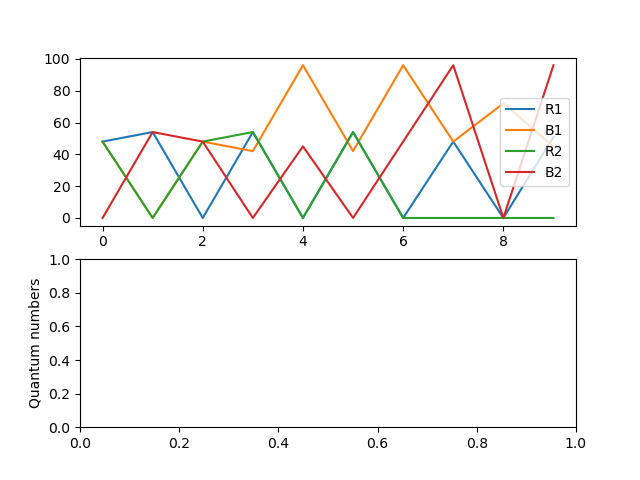

In [158]:
fig, ax = plt.subplots(2, 1)

x1, x2, x3, x4 = [], [], [], []
for i in range(1000):
    x1.append(topo_sectors(pos[i], [((0, 0, 0), 0)], 96)[0])
    x2.append(topo_sectors(pos[i], [((1, 0, 0), 0)], 96)[0])
    x3.append(topo_sectors(pos[i], [((0, 0, 0), 1)], 96)[0])
    x4.append(topo_sectors(pos[i], [((1, 0, 0), 1)], 96)[0])

ax[0].plot(x1[:400], label="R1")
ax[0].plot(x2[:400], label="B1")
ax[0].plot(x3[:400], label="R2")
ax[0].plot(x4[:400], label="B2")
ax[1].set_ylabel("Quantum numbers")
ax[0].legend()

d1 = read_trimers_r("data/96x96-3-1000000.1000-trimers-cut.dat", 96, 47)
d2 = read_trimers_r("data/96x96-3-1000000.1000-trimers-cut.dat", 96, 45)
d3 = read_trimers_r("data/96x96-3-1000000.1000-trimers-cut.dat", 96, 20)
ax[1].set_ylabel("Trimer-trimer correlation")
ax[1].plot(d1[:400], label="r=47")
ax[1].plot(d2[:400], label="r=45")
ax[1].plot(d3[:400], label="r=20")
ax[1].set_xlabel("Time (x1000)")
ax[1].legend()

In [ ]:
plt.plot([topo_sectors(pos[i], [((0, 0, 0), 0)], 96)[0]
          + topo_sectors(pos[i], [((1, 0, 0), 0)], 96)[0]
          + topo_sectors(pos[i], [((2, 0, 0), 0)], 96)[0] for i in range(1000)])

## Trimer-Trimer correlation

## Trimers

In [ ]:
data1 = read_accumulator("data/t0j0/-1/96x96_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((96, 96, 2))
data2 = read_accumulator("data/t0j0/-1/84x84_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((84, 84, 2))
data3 = read_accumulator("data/t0j0/-1/72x72_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((72, 72, 2))
data4 = read_accumulator("data/t0j0/-1/60x60_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((60, 60, 2))
data5 = read_accumulator("data/t0j0/-1/48x48_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data6 = read_accumulator("data/t0j0/-1/24x24_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((24, 24, 2))
data7 = read_accumulator("data/t0j0/-1/12x12_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((12, 12, 2))
data8 = read_accumulator("data/t0j0/-1/6x6_r-3_t0.000000_j0.000_50000000.20_0/tri-tri.dat", skip=10)[0].reshape((6, 6, 2))

/tmp/ipykernel_4089479/3084718470.py:31: RuntimeWarning: divide by zero encountered in power
  return B * np.power(np.abs(x), A) + C


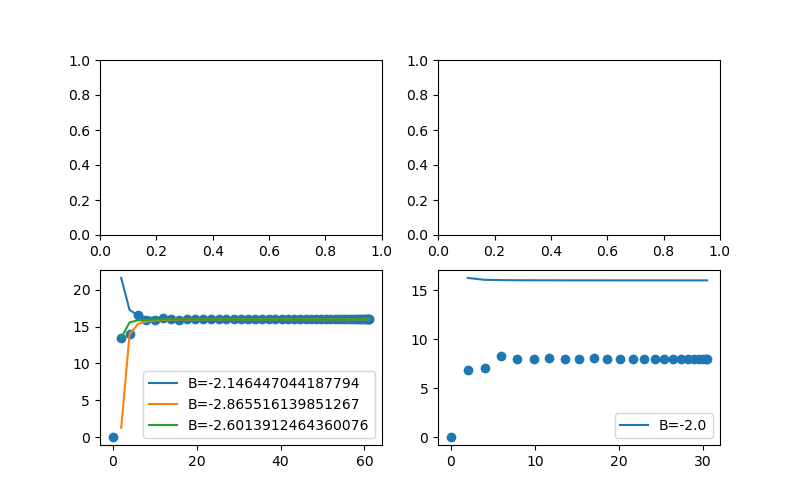

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=[8, 5])
# plot2d_hex(ax[0, 0], data1)
# plot2d_hex(ax[0, 1], data2)

def mod(data, x, y, s):
    return data.transpose(1, 0, 2)[x%(data.shape[0]), y%(data.shape[1]), s]

def symmetrize(data, sublattice=0):
    lin = [0]
    xs = np.arange(data.shape[0]//2) * 2
    for i in range(1, data.shape[0]//2):
        total = 0
        total += mod(data, i, i, 0)
        total += mod(data, -i, 2*i, 0)
        total += mod(data, -2*i, i, 0)
        total += mod(data, -i, -i, 0)
        total += mod(data, i, -2*i, 0)
        total += mod(data, 2*i, -i, 0)
        lin.append(total / 6)

    lin = np.array(lin)

    L = data.shape[0] * 2
    xs = np.sin(np.pi/L * xs) / (np.pi/L)
    return xs, lin

def fit(xs, ys):
    import scipy

    def fun(x, A, B, C):
        return B * np.power(np.abs(x), A) + C
    param, _ = scipy.optimize.curve_fit(fun, xs, ys, p0=[-2, 1, 16])

    return fun, param

x1, y1 = symmetrize(data1)
ax[1, 0].scatter(x1, y1)
fun, param = fit(x1[3::3], y1[3::3])
ax[1, 0].plot(x1, fun(x1, *param), label=f"B={param[0]}")
fun, param = fit(x1[2::3], y1[2::3])
ax[1, 0].plot(x1, fun(x1, *param), label=f"B={param[0]}")
fun, param = fit(x1[1::3], y1[1::3])
ax[1, 0].plot(x1, fun(x1, *param), label=f"B={param[0]}")
ax[1, 0].legend()

x2, y2 = symmetrize(data2)
ax[1, 1].scatter(x2, y2)
fun, param = fit(x2, y2)
ax[1, 1].plot(x2, fun(x2, *param), label=f"B={param[0]}")
ax[1, 1].legend()

{(248832, 0, 0): [1, 16.00613142857141], (245388, 0, 1): [1, 16.023475102040837], (243684, 0, 0): [2, 31.96156448979592], (240276, 0, 1): [2, 31.94809020408163], (238608, 0, 0): [2, 31.966841224489798], (235236, 0, 1): [2, 31.94801551020408], (233604, 0, 0): [2, 32.02073632653064], (230268, 0, 1): [2, 32.03354204081631], (228672, 0, 0): [2, 31.95848163265306], (225372, 0, 1): [2, 31.951715102040815], (223812, 0, 0): [2, 31.963691836734696], (220548, 0, 1): [2, 31.951769795918366], (219024, 0, 0): [2, 32.02299510204077], (215796, 0, 1): [2, 32.03097224489799], (214308, 0, 0): [2, 31.96324612244898], (211116, 0, 1): [2, 31.948272653061224], (209664, 0, 0): [2, 31.96436775510204], (206508, 0, 1): [2, 31.96907142857143], (205092, 0, 0): [2, 32.01512938775512], (201972, 0, 1): [2, 32.02207714285714], (200592, 0, 0): [2, 31.95942489795918], (197508, 0, 1): [2, 31.952217142857144], (196164, 0, 0): [2, 31.960005306122447], (193116, 0, 1): [2, 31.964305714285715], (191808, 0, 0): [2, 32.0146632

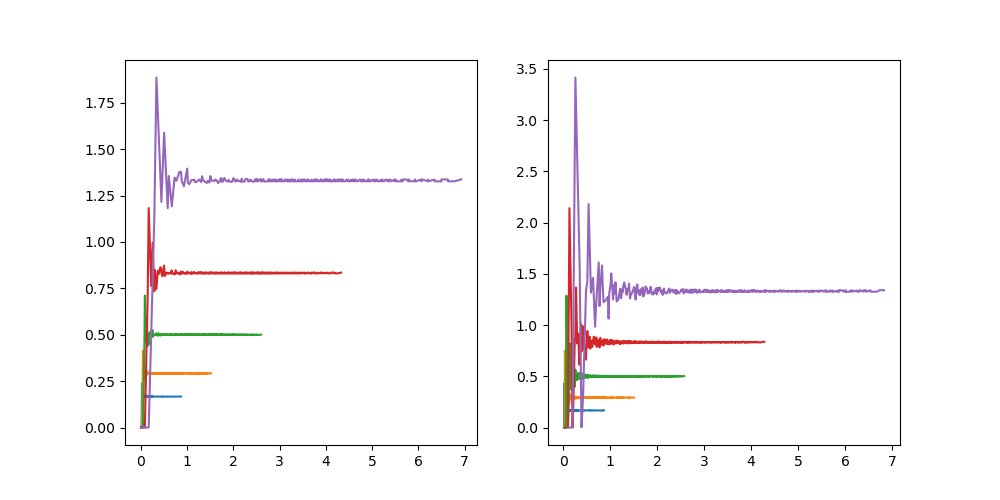

In [ ]:
def symmetrize2(data):
    vals = {}
    def add(x, y, s):
        if s == 1:
            xy = ((6*x + 3*y + 3, 0), (0, 3*y + 1))
        else:
            xy = ((6*x + 3*y, 0), (0, 3*y))
        dist = (xy[0][0]**2 + 3*xy[0][1]**2 + xy[1][0]**2 + 3*xy[1][1]**2,
                2*xy[0][0]*xy[0][1] + 2*xy[1][0]*xy[1][1], s)

        if dist not in vals:
            vals[dist] = [0, 0]
        vals[dist][0] += 1
        vals[dist][1] += mod(data, x, y, s)
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            add(i - data.shape[0]//2, j - data.shape[1]//2, 0)
            add(i - data.shape[0]//2, j - data.shape[1]//2, 1)
    
    print(vals)
    xs0 = []
    ys0 = []
    xs1 = []
    ys1 = []
    for key, val in sorted(vals.items(), key=lambda x: x[0][0] + x[0][1] * np.sqrt(3)):
        if key[2] == 0:
            xs0.append(np.sqrt((key[0] + key[1] * np.sqrt(3))/36))
            ys0.append(val[1] / val[0])
        else:
            xs1.append(np.sqrt((key[0] + key[1] * np.sqrt(3))/36))
            ys1.append(val[1] / val[0])
    return tuple(map(np.array, [xs0, ys0, xs1, ys1]))

fig, ax = plt.subplots(1, 2, figsize=[10, 5])
def do(data, scale):
    x, y, xb, yb = symmetrize2(data)
    ax[0].plot(x / scale, y / scale)
    ax[1].plot(xb / scale, yb / scale)
do(data1, 96)
do(data2, 48)
do(data3, 24)
do(data4, 12)
do(data5, 6)

In [ ]:
# x = read_trimers_cut("data/72x72-6-1000000-trimers-cut.dat", 72, stride=1, skip=500000)
x1 = read_trimers_cut("data/96x96-3-2000000-trimers-cut.dat", 96, stride=1, skip=800000)
# x2 = read_trimers_cut("data/108x108-3-5000000-trimers-cut.dat", 108, skip=2500000, stride=10)

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=[8, 5])

xr = x1 / x1.sum()
xs = np.arange(x1.shape[0])

import scipy

def fit(x, A, B, C):
    return B * np.power(x, A) + C

def fitplot(x, y, ax):
    P, cov = scipy.optimize.curve_fit(fit, x, y, p0=[-2, 1, 0.1])
    y0 = P[2]
    print(y0)
    ax.plot(np.linspace(2, xr.shape[0], 100), fit(np.linspace(2, xr.shape[0], 100), *P)-y0, label=f"{P[0]:.2f}+-{np.sqrt(cov[0, 0]):.2f}")
    ax.scatter(x, y-y0)
    ax.legend()

    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.set_ylabel("y-y0")
    ax.set_xlabel("x")
    ax.set_title(f"y0={y0:.5f}")

fitplot(xs[1::3], xr[1::3], ax[0, 0])
fitplot(xs[2::3], xr[2::3], ax[0, 1])
fitplot(xs[3::3], -xr[3::3], ax[0, 2])

def fit(x, A, B):
    return B * np.power(x, A)

p0 = (xr[-10:].max() + xr[-10:].min())/2


def fitplot(x, y, ax):
    P, cov = scipy.optimize.curve_fit(fit, x, y, p0=[-2, 1])
    ax.plot(np.linspace(2, xr.shape[0], 100), fit(np.linspace(2, xr.shape[0], 100), *P), label=f"{P[0]:.2f}+-{np.sqrt(cov[0, 0]):.2f}")
    ax.scatter(x, y)
    ax.legend()

    ax.set_yscale("log")
    ax.set_xscale("log")
    ax.set_ylabel("y-y0")
    ax.set_xlabel("x")
    ax.set_title(f"y0={p0:.5f}")

print(p0)
fitplot(xs[1::3], xr[1::3]-p0, ax[1, 0])
fitplot(xs[2::3], xr[2::3]-p0, ax[1, 1])
fitplot(xs[3::3], -xr[3::3]+p0, ax[1, 2])

plt.suptitle("Trimer-trimer correlation L=96 filling=-1")
plt.tight_layout()

In [ ]:
d1 = read_trimers_r("data/108x108-3-5000000-trimers-cut.dat", 108, 2, skip=0, stride=1)
d2 = read_trimers_r("data/108x108-3-5000000-trimers-cut.dat", 108, 20, skip=0, stride=1)
d3 = read_trimers_r("data/108x108-3-5000000-trimers-cut.dat", 108, 50, skip=0, stride=1)

In [ ]:
skip = 1000000
autocorr(d1[skip:], "r=2")
autocorr(d2[skip:], "r=20")
autocorr(d3[skip:], "r=50")
plt.legend()
plt.xscale("log")
plt.title("autocorr trimer-trimer L=108 n=-1 skip=1M")

In [ ]:
d1 = read_trimers_r("data/60x60-3-2000000-trimers-cut2.dat", 60, 2, skip=0, stride=1)
d2 = read_trimers_r("data/60x60-3-2000000-trimers-cut2.dat", 60, 10, skip=0, stride=1)
d3 = read_trimers_r("data/60x60-3-2000000-trimers-cut2.dat", 60, 25, skip=0, stride=1)

In [ ]:
skip = 1000000
autocorr(d1[skip:], "r=2")
autocorr(d2[skip:], "r=10")
autocorr(d3[skip:], "r=25")
plt.legend()
plt.xscale("log")
plt.title("autocorr trimer-trimer L=60 n=-1 skip=1M")

In [ ]:
d1 = read_trimers_r("data/60x60-6-1000000-trimers-cut.dat", 60, 2, skip=0, stride=1)
d2 = read_trimers_r("data/60x60-6-1000000-trimers-cut.dat", 60, 10, skip=0, stride=1)
d3 = read_trimers_r("data/60x60-6-1000000-trimers-cut.dat", 60, 25, skip=0, stride=1)

In [ ]:
skip = 500000
autocorr(d1[skip:], "r=2")
autocorr(d2[skip:], "r=10")
autocorr(d3[skip:], "r=25")
plt.legend()
plt.xscale("log")
plt.title("autocorr trimer-trimer L=60 n=-2 skip=0.5M")

### Trimer Collapse

In [ ]:
L, data = get_all_data("data/t0j0/-1/*_0/tri-tri.dat", lambda data, props: data[0].reshape((props["l"], props["l"], 2)), skip=10, by="l")
plt.close("all")
plt.figure()
xs = []
ys = []
for l, d in zip(L, data):
# for l, d in zip([96], [data[-1]]):
    x = np.arange(l)
    scaledx = np.sin(np.pi * x/l) / (np.pi/l)
    scaledx = scaledx/l

    d = d / l

    plt.scatter(scaledx, d[:, 0, 0], marker="x", label="L="+str(l))
    for i in range(d.shape[0]//2):
        if i % 3 != 2: continue
        xs.append(scaledx[i])
        ys.append(d[i, 0, 0])

x = np.linspace(0.01, 1/np.pi, 100)

def fun(x, A, B, C, D):
    return B * np.power(np.abs(x)+D, A) + C
param, _ = scipy.optimize.curve_fit(fun, xs[2:], ys[2:], p0=[-0.25, 1, 0.17, 0], bounds=([-5, 0, 0, -5], [-0.01, np.inf, 10, 5]))
plt.plot(x, fun(x, *param), label=f"Fit $y={param[1]:.2f}(x+{param[3]:.2f})^{{{param[0]:.2f}}}+{param[2]:.2f}$")

plt.legend()

## Monomer-Monomer

### Monomer Scaling

In [ ]:
# L, data = get_all_data("data/t0j0/1-48/*/mono-mono.dat", lambda data, props: data[0].reshape((props["l"], props["l"])), skip=10, by="l")
L, data = get_all_data("data/t0j0/doped/1.48/*/mono-mono.dat", lambda data, props: data[0].reshape((props["l"], props["l"])), skip=10, by="l")
L, data = L[:-2], data[:-2]

[-1.96176044 -0.99985232]


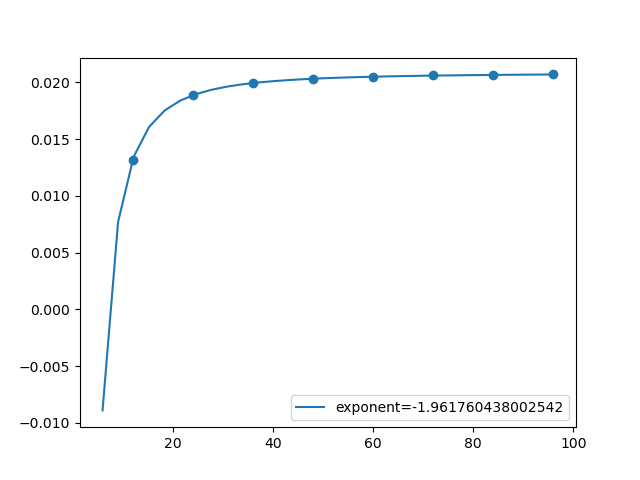

In [ ]:
plt.figure()
xs = []
ys = []
for l, d in zip(L, data):
    xs.append(l)
    ys.append((d[l//3:2*l//3, 0].mean()))

# plt.xscale("log")
# plt.yscale("log")
plt.scatter(xs, ys)

def fit(xs, ys):
    def fun(x, A, B):
        return B * np.power(np.abs(x), A) + 1/48
    param, _ = scipy.optimize.curve_fit(fun, xs, ys, p0=[-0.25, -0.001], bounds=([-2, -1], [0, 1]))
    return fun, param

fun, param = fit(xs, ys)
xs = np.linspace(6, 96, 30)
plt.plot(xs, fun(xs, *param), label=f"exponent={param[0]}")
plt.legend()
print(param)

[-0.99999784 -0.24962146  0.        ]


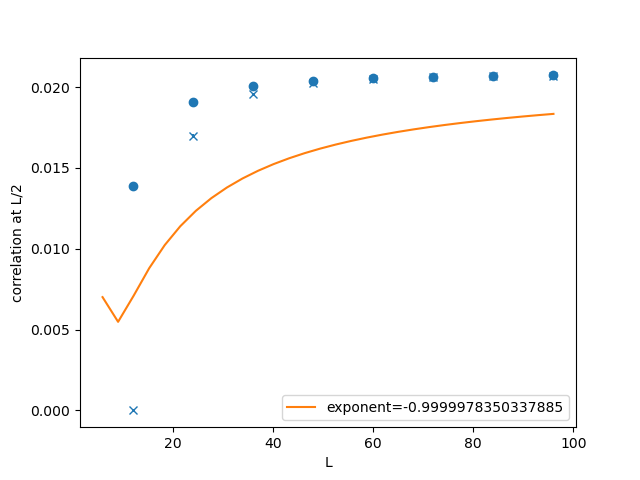

In [ ]:
def fit(xs, ys):
    import scipy

    def fun(x, A, B, C):
        return B * np.power(np.abs(x), A) + np.power(np.abs(x), -2) + 1/48
    param, _ = scipy.optimize.curve_fit(fun, xs, ys, p0=[-0.25, 1, 0], bounds=([-1, -10, -1], [0, 10, 1]))
    # def fun(x, A, B):
    #     return B * np.power(np.abs(x), A)
    # param, _ = scipy.optimize.curve_fit(fun, xs, ys, p0=[-0.25, -0.001], bounds=([-2, -1], [0, 1]))

    return fun, param

values = []
for l, d in zip(L, data):
    x = l//2
    values.append((d[x, 0] + d[0, x] + d[-x, x])/3)

values = np.array(values)

plt.figure()
fun, param = fit(L[0:], values[0:])

# plt.xscale("log")
# plt.yscale("log")

# values = values - param[2]
# if param[1] < 0:
#     values = values * -1

# fun, param = fit(L[0:], values[0:])

plt.errorbar(L, values, yerr=np.sqrt(np.abs(values))/1581, marker="x", ls="")
xs = np.linspace(6, 96, 30)
plt.plot(xs, fun(xs, *param), label=f"exponent={param[0]}")
plt.scatter(L, -np.power(L, -2.)+1/48)
plt.legend()
plt.xlabel("L")
plt.ylabel("correlation at L/2")
print(param)

### Correlation

$$\overline{x}=\sin(\pi x/L)/(\pi/L)$$

In [ ]:
i = 60
L = i
d = read_monomers_cut(f"data/{i}x{i}-3-3000000-monomers.dat", i)
dn = np.zeros((max(d.keys())-min(d.keys()) + 1,))
dk = np.arange(min(d.keys()), max(d.keys()) + 1)
for key, value in sorted(d.items()):
    dn[key-min(d.keys())] = value

dn[len(dn)//2] = 0
dk = np.sin(np.pi/L * dk) / (np.pi/L)

import scipy
def fit(x, A, B):
    return B * np.power(np.abs(x), A)

crit = np.logical_and(dn>0, dk>0)
P, _ = scipy.optimize.curve_fit(fit, dk[crit], dn[crit], p0=[-0.25, 10])

plt.plot(dk, dn)
plt.plot(dk, fit(dk, *P), label=str(P[0]))

plt.legend()
plt.title("monomer-monomer L=48 filling=-1")
plt.ylabel("counts (au)")
plt.xlabel("r (transformed)")

In [ ]:
i = 96
L = i
d = read_monomers_cut(f"data/0K/{i}x{i}-3-50000000.10-monomers.dat", i)
dn = np.zeros((max(d.keys())-min(d.keys()) + 1,))
dk = np.arange(min(d.keys()), max(d.keys()) + 1)
for key, value in sorted(d.items()):
    dn[key-min(d.keys())] = value

dn[len(dn)//2] = 0
dk = np.sin(np.pi/L * dk) / (np.pi/L)

Text(0.5, 0, '$\\overline{x}$')

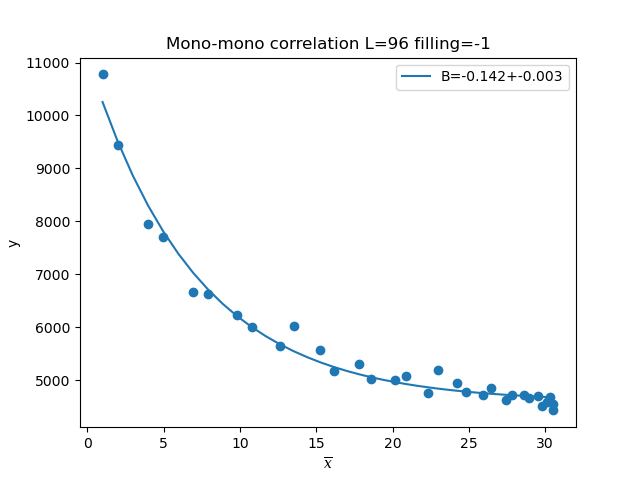

In [29]:
import scipy
def fit(x, A, B):
    return B * np.power(np.abs(x), A)
def fit(x, A, B, C):
    return B * np.exp(np.abs(x) * A) + C

# plt.scatter(dk[L//2:], dn[L//2:])
sigma = np.sqrt(dn/5e6*(1-dn/5e6)*5e6)

crit = np.logical_and(dn>0, dk>0)

plt.figure()
plt.scatter(dk[crit], dn[crit])

# P, cov = scipy.optimize.curve_fit(fit, dk[crit], dn[crit], p0=[-0.25, 1000], sigma=sigma[crit], absolute_sigma=True)
P, cov = scipy.optimize.curve_fit(fit, dk[crit], dn[crit], p0=[-0.13, 10000, 5000], sigma=sigma[crit], absolute_sigma=True)

plt.plot(dk[L//2:], fit(dk[L//2:], *P), label=f"B={P[0]:.3f}+-{np.sqrt(cov[0,0]):.3f}")

plt.legend()
plt.title(f"Mono-mono correlation L={L} filling=-1")
plt.ylabel("y")
plt.xlabel("$\\overline{x}$")

In [ ]:
i = 48
L = i
d = read_monomers_cut(f"data/{i}x{i}-6-1000000-monomers.dat", i)
dn = np.zeros((max(d.keys())-min(d.keys()) + 1,))
dk = np.arange(min(d.keys()), max(d.keys()) + 1)
for key, value in sorted(d.items()):
    dn[key-min(d.keys())] = value

dn[len(dn)//2] = 0
dk = np.sin(np.pi/L * dk) / (np.pi/L)

import scipy
def fit(x, A, B):
    return B * np.power(np.abs(x), A)

crit = np.logical_and(dn>12000, dk>0)
P, _ = scipy.optimize.curve_fit(fit, dk[crit], dn[crit], p0=[-0.25, 10])

plt.plot(dk, dn)
plt.plot(dk, fit(dk, *P), label=str(P[0]))
plt.legend()
plt.title("monomer-monomer L=48 filling=-2")

In [ ]:
p1 = read_monomers_r(f"data/96x96-3-50000000-monomers.dat", 96, [(0, 1), (0, 10), (0, 25), (31, 30)])

In [ ]:
skip = 500000
autocorr(p1[(0, 1)][skip:], "r=(0, 1)")
autocorr(p1[(0, 10)][skip:], "r=(0, 10)")
autocorr(p1[(0, 25)][skip:], "r=(0, 25)")
autocorr(p1[(31, 30)][skip:], "r=(31, 30)")
plt.legend()
plt.xscale("log")
plt.title("autocorr mono-mono L=60 n=-1 skip=0.5M")

In [ ]:
n = 30000
rng = np.arange(len(p1[(0, 1)])//n) * n
plt.plot(rng, bin(p1[(0, 1)], n))
plt.plot(rng, bin(p1[(0, 10)], n))
plt.plot(rng, bin(p1[(0, 25)], n))
plt.plot(rng, bin(p1[(24, 25)], n))
plt.title("equilib mono-mono L=60 n=-1")

### 2D correlation

In [ ]:
d1 = read_monomers(f"data/0K/6x6-3-50000000.10-monomers.dat", 6)
d2 = read_monomers(f"data/0K/12x12-3-50000000.10-monomers.dat", 12)
d3 = read_monomers(f"data/0K/24x24-3-50000000.10-monomers.dat", 24)
d4 = read_monomers(f"data/0K/48x48-3-50000000.10-monomers.dat", 48)
d5 = read_monomers(f"data/0K/96x96-3-50000000.10-monomers.dat", 96)

In [ ]:
plt.figure()
plot2d(d1, 6)
plt.figure()
plot2d(d2, 12)
plt.figure()
plot2d(d3, 24)
plt.figure()
plot2d(d4, 48)
plt.figure()
plot2d(d5, 96)

# T>0

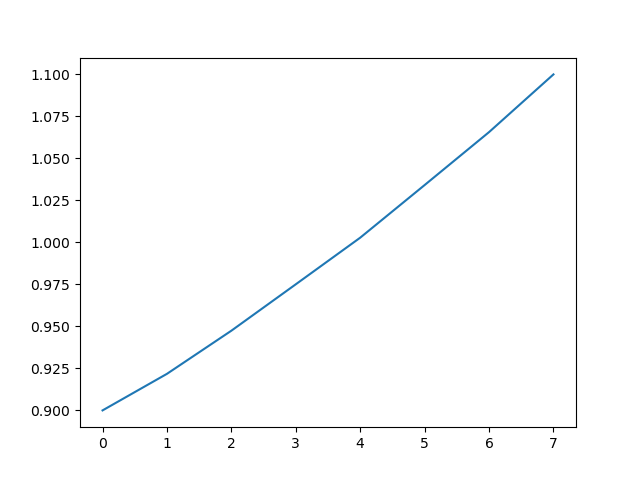

In [146]:
plt.figure()
plt.plot([ 0.900000,0.921767,0.947446,0.975066,1.002811,1.034138,1.065648,1.100000])
# plt.yscale('log')

## J4/U=0.1

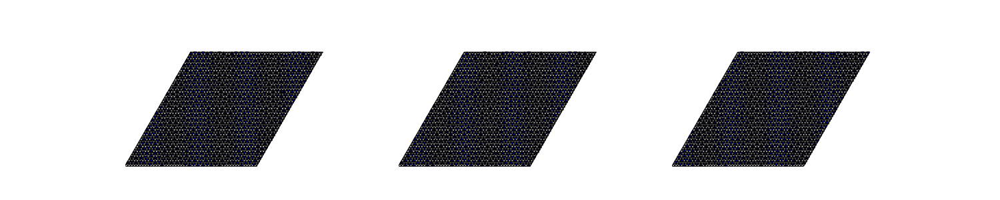

Text(0, 0.5, 'number of vacancies')

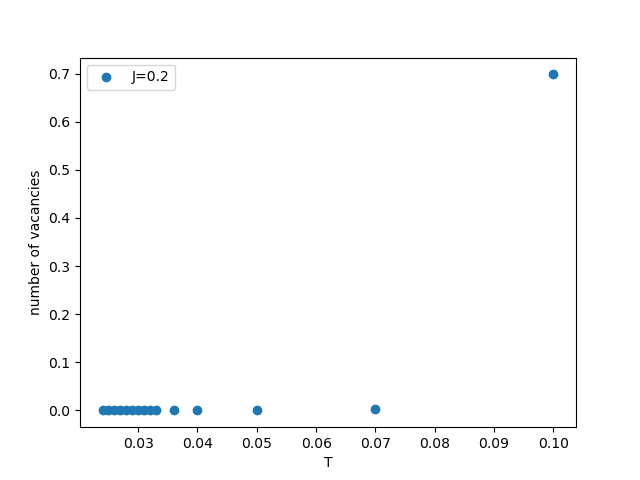

In [96]:
plt.figure()
# ts, ds = get_all_data("new-data/rough-pt/-1.5/2/*/cluster-count.dat", lambda x, props: x[0][0], skip=100)
# plt.scatter(ts, ds, label="J=-1.5")
# ts, ds = get_all_data("new-data/rough-pt/-1.5/3/*/cluster-count.dat", lambda x, props: x[0][0], skip=100)
# plt.scatter(ts, ds, label="J=-1.5 (another run)")
# ts, ds = get_all_data("new-data/rough-pt/-1.5/1/*/cluster-count.dat", lambda x, props: x[0][0], skip=100)
# plt.scatter(ts, ds, label="J=-1.5 (another run)")
# ts, ds = get_all_data("new-data/pt/0.2/48/*/cluster-count.dat", lambda x, props: x[0][0], skip=100)
# plt.scatter(ts, ds, label="J=0.2")
ts, ds = get_all_data("data/ptpeaks/-0.1b/*/cluster-count.dat", lambda x, props: x[0][0], skip=100)
plt.scatter(ts, ds, label="J=0.2")
plt.legend()
plt.xlabel("T")
plt.ylabel("number of vacancies")

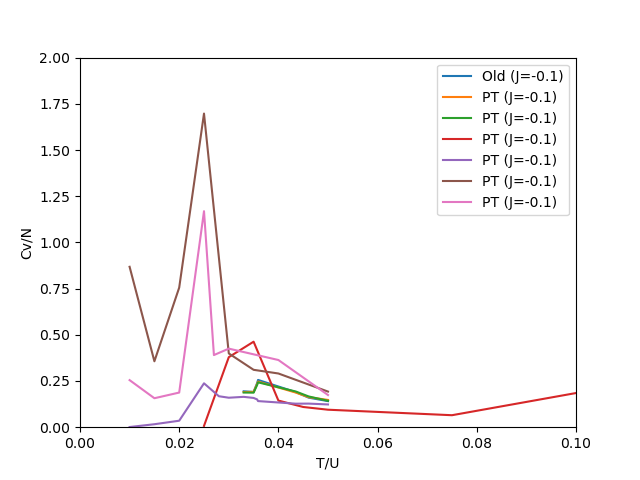

In [5]:
skip = 10
ts0, ds0 = get_all_cvs("data/temp/pt-doped3/*/energy.dat", skip=200000)
ts1, ds1 = get_all_cvs("data/temp/pt-doped4/*/energy.dat", skip=200000)
ts2, ds2 = get_all_cvs("data/temp/pt-doped5/*/energy.dat", skip=200000)
ts4, ds4 = get_all_cvs("data/vsweeps2/-0.1/48/*/energy.dat", skip=skip)
ts5, ds5 = get_all_cvs("data/temp/nopt-doped0/*/energy.dat", skip=200000)
ts6, ds6 = get_all_cvs("data/temp/pt-doped7/*/energy.dat", skip=200000)
ts7, ds7 = get_all_cvs("data/temp/pt-doped6/*/energy.dat", skip=100000)

plt.close("all")
plt.figure()
plt.plot(ts0, ds0, label="Old (J=-0.1)")
plt.plot(ts1, ds1, label="PT (J=-0.1)")
plt.plot(ts2, ds2, label="PT (J=-0.1)")
plt.plot(ts4, ds4, label="PT (J=-0.1)")
plt.plot(ts5, ds5, label="PT (J=-0.1)")
plt.plot(ts6, ds6, label="PT (J=-0.1)")
plt.plot(ts7, ds7, label="PT (J=-0.1)")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 0.1])
plt.ylim([0, 2])
plt.legend()

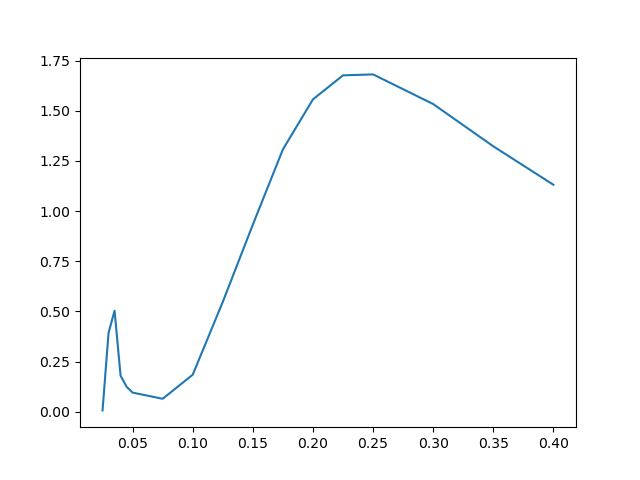

In [9]:

ts4, ds4 = get_all_cvs("data/vsweeps2/-0.1/48/*/energy.dat", skip=0)
plt.figure()
plt.plot(ts4, ds4)

(-0.15, -0.13)

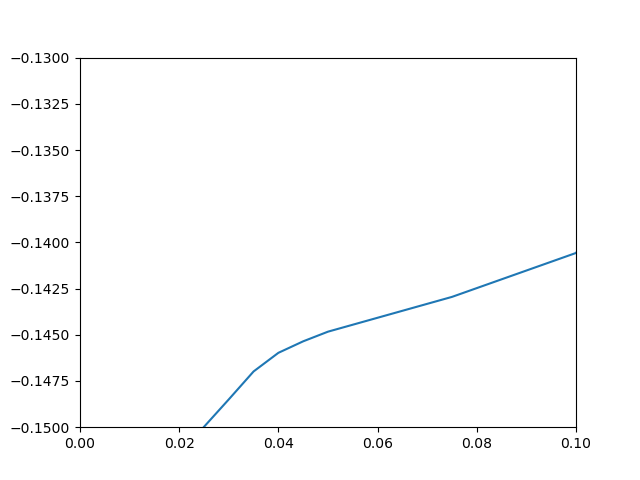

In [8]:
ts4, ds4 = get_all_energies("data/vsweeps2/-0.1/48/*/energy.dat", skip=0)
plt.figure()
plt.plot(ts4, ds4)
plt.xlim([0, 0.1])
plt.ylim([-0.15, -0.13])

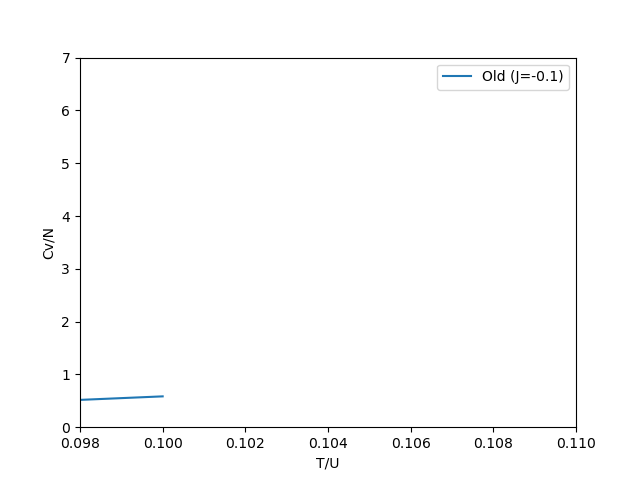

In [207]:
skip = 10
ts0, ds0 = get_all_cvs("data/temp/1/*_0/energy.dat", skip=0)

plt.close("all")
plt.figure()
plt.plot(ts0, ds0, label="Old (J=-0.1)")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0.098, 0.11])
plt.ylim([0, 7])
plt.legend()

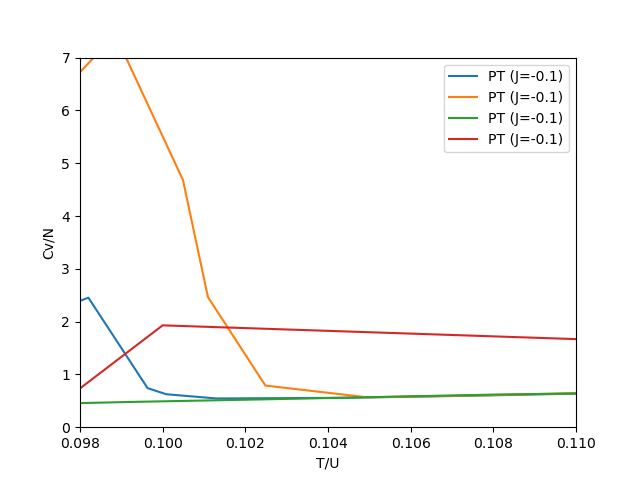

In [244]:
skip = 10
ts1, ds1 = get_all_cvs("data/pt-adapting/0.01/0/*/energy.dat", skip=50000)
ts2, ds2 = get_all_cvs("data/pt-adapting/0.01/1/*/energy.dat", skip=50000)
ts3, ds3 = get_all_cvs("data/pt-adapting/0.01/2/*/energy.dat", skip=50000)
ts4, ds4 = get_all_cvs("data/pt/0.01/0/*/energy.dat", skip=0)


plt.close("all")
plt.figure()
plt.plot(ts1, ds1, label="PT (J=-0.1)")
plt.plot(ts2, ds2, label="PT (J=-0.1)")
plt.plot(ts3, ds3, label="PT (J=-0.1)")
plt.plot(ts4, ds4, label="PT (J=-0.1)")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0.098, 0.11])
plt.ylim([0, 7])
plt.legend()

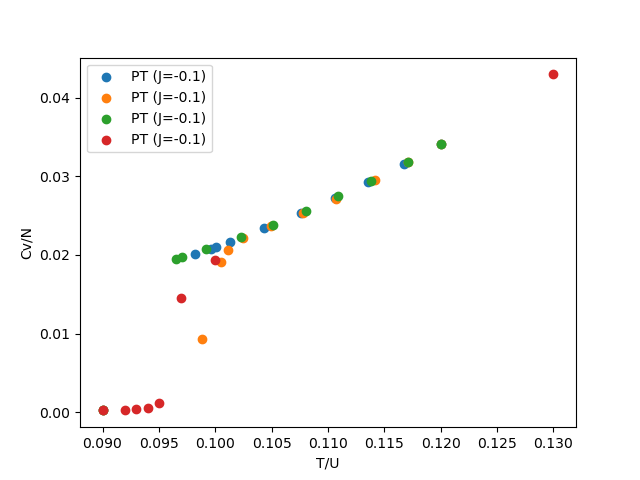

In [252]:
skip = 10
ts1, ds1 = get_all_energies("data/pt-adapting/0.01/0/*/energy.dat", skip=100000)
ts2, ds2 = get_all_energies("data/pt-adapting/0.01/1/*/energy.dat", skip=100000)
ts3, ds3 = get_all_energies("data/pt-adapting/0.01/2/*/energy.dat", skip=50000)
ts4, ds4 = get_all_energies("data/pt/0.01/0/*/energy.dat", skip=0)

plt.close("all")
plt.figure()
plt.scatter(ts1, ds1, label="PT (J=-0.1)")
plt.scatter(ts2, ds2, label="PT (J=-0.1)")
plt.scatter(ts3, ds3, label="PT (J=-0.1)")
plt.scatter(ts4, ds4, label="PT (J=-0.1)")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.legend()

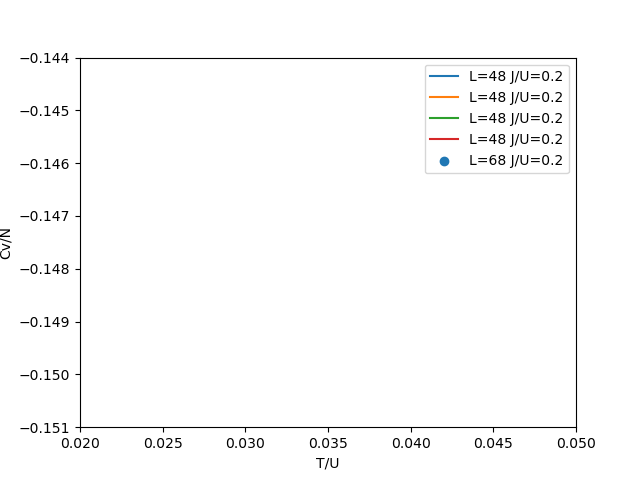

In [158]:
ts0, ds0 = get_all_cvs("data/vsweeps2/-0.1/48/*/energy.dat", skip=skip)
ts1, ds1 = get_all_cvs("data/ptpeaks/-0.1b/*/energy.dat", skip=skip)
ts3, ds3 = get_all_cvs("data/ptpeaks/-0.1/*/energy.dat", skip=skip)
ts4, ds4 = get_all_cvs("data/temp/pt5/*/energy.dat", skip=1)
ts6, ds6 = get_all_cvs("data/pt-adaptive/*/energy.dat", skip=200000)

plt.close("all")
plt.figure()
plt.plot(ts0, ds0, label="L=48 J/U=0.2")
plt.plot(ts1, ds1, label="L=48 J/U=0.2")
plt.plot(ts3, ds3, label="L=48 J/U=0.2")
plt.plot(ts4, ds4, label="L=48 J/U=0.2")
plt.scatter(ts6, ds6, label="L=68 J/U=0.2")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0.02, 0.05])
plt.ylim([-0.151, -0.144])
plt.legend()

In [72]:
# ds1 = read_accumulator_raw("data/pt-adapting/0.01/2/48x48_r-0_t0.090000_j0.010_10000000.15_0/energy.dat")
# ds2 = read_accumulator_raw("data/pt-adapting/0.01/2/48x48_r-0_t0.096505_j0.010_10000000.15_0/energy.dat")
# ds3 = read_accumulator_raw("data/pt-adapting/0.01/2/48x48_r-0_t0.097046_j0.010_10000000.15_0/energy.dat")
# ds4 = read_accumulator_raw("data/pt-adapting/0.01/2/48x48_r-0_t0.110913_j0.010_10000000.15_0/energy.dat")
# ds5 = read_accumulator_raw("data/pt-adapting/0.01/2/48x48_r-0_t0.120000_j0.010_10000000.15_0/energy.dat")

ds1 = read_accumulator_raw("data/pt/0.01/0/48x48_r-0_t0.090000_j0.010_10000000.15_0/energy.dat")
ds2 = read_accumulator_raw("data/pt/0.01/0/48x48_r-0_t0.092000_j0.010_10000000.15_0/energy.dat")
ds3 = read_accumulator_raw("data/pt/0.01/0/48x48_r-0_t0.094000_j0.010_10000000.15_0/energy.dat")
ds4 = read_accumulator_raw("data/pt/0.01/0/48x48_r-0_t0.097000_j0.010_10000000.15_0/energy.dat")
ds5 = read_accumulator_raw("data/vsweeps/0/48x48_r-0_t0.1000_j0.0000_40000000.5_0/energy.dat")

# ds1 = read_accumulator_raw("data/pt-adaptive/48x48_r-0_t0.033000_j-0.100_10000000.20_0/energy.dat")
# ds2 = read_accumulator_raw("data/pt-adaptive/48x48_r-0_t0.035000_j-0.100_10000000.20_0/energy.dat")
# ds3 = read_accumulator_raw("data/ptpeaks/-0.1/48x48_r-0_t0.035000_j-0.100_10000000.20_0/energy.dat")
# ds4 = read_accumulator_raw("data/ptpeaks/-0.1b/48x48_r-0_t0.024000_j-0.100_10000000.20_0/energy.dat")
# ds5 = read_accumulator_raw("data/ptpeaks/-0.1/48x48_r-0_t0.041000_j-0.100_10000000.20_0/energy.dat")


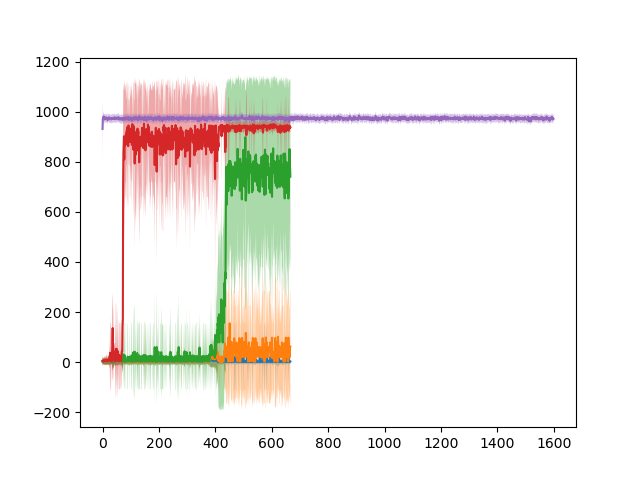

In [73]:
plt.figure()
ax = plt.gca()
plot_timeseries(ax, ds1[0][:, 1], ds1[1][:, 1])
plot_timeseries(ax, ds2[0][:, 1], ds2[1][:, 1])
plot_timeseries(ax, ds3[0][:, 1], ds3[1][:, 1])
plot_timeseries(ax, ds4[0][:, 1], ds4[1][:, 1])
plot_timeseries(ax, ds5[0][:, 1], ds5[1][:, 1])

Text(0.5, 1.0, 'J=-1.5 T=0.38')

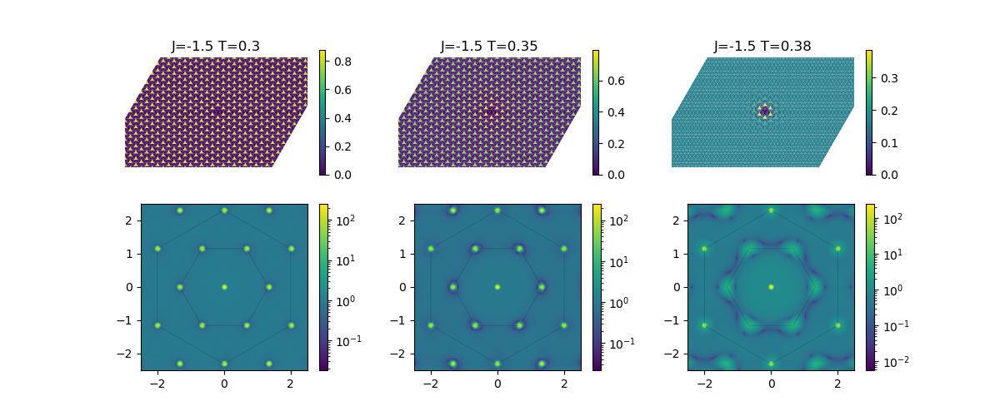

In [87]:
# data1 = read_accumulator("data/temp/pt-doped6/48x48_r-18_t0.010000_j-0.100_10000000.15_0/tri-tri.dat", skip=100000)[0].reshape((48, 48, 2))
# data2 = read_accumulator("data/temp/pt-doped6/48x48_r-18_t0.020000_j-0.100_10000000.15_0/tri-tri.dat", skip=100000)[0].reshape((48, 48, 2))
# data3 = read_accumulator("data/temp/pt-doped6/48x48_r-18_t0.030000_j-0.100_10000000.15_0/tri-tri.dat", skip=100000)[0].reshape((48, 48, 2))
# data4 = read_accumulator("data/temp/pt-doped7/48x48_r-18_t0.030000_j-0.100_10000000.15_0/tri-tri.dat", skip=100000)[0].reshape((48, 48, 2))
# data3 = read_accumulator("data/idealbw/60x60_r-3_uinf_4j0.00_1000.1_0/tri-tri.dat")[0].reshape((60, 60, 2))

# data1 = read_accumulator("new-data/rough-pt/-1.5/2/48x48_r-0_t0.300000_j-1.500_10000000.15_0/tri-tri.dat", skip=0)[0].reshape((48, 48, 2))
# data2 = read_accumulator("new-data/rough-pt/-1.5/2/48x48_r-0_t0.351110_j-1.500_10000000.15_0/tri-tri.dat", skip=0)[0].reshape((48, 48, 2))
# data3 = read_accumulator("new-data/rough-pt/-1.5/2/48x48_r-0_t0.381293_j-1.500_10000000.15_0/tri-tri.dat", skip=0)[0].reshape((48, 48, 2))
data1 = read_accumulator("new-data/pt/0.2/48/48x48_r-0_t0.245000_j0.200_10000000.15_0/tri-tri.dat", skip=0)[0].reshape((48, 48, 2))
data2 = read_accumulator("new-data/pt/0.2/48/48x48_r-0_t0.247000_j0.200_10000000.15_0/tri-tri.dat", skip=0)[0].reshape((48, 48, 2))
data3 = read_accumulator("new-data/pt/0.2/48/48x48_r-0_t0.270000_j0.200_10000000.15_0/tri-tri.dat", skip=0)[0].reshape((48, 48, 2))
fig, ax = plt.subplots(2, 3, figsize=[12, 5], height_ratios=[6, 8])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
# plot2d_hex(ax[0,3], data4)
plot_FT(ax[1,0], FT_hex(data1), proj="logabs")
plot_FT(ax[1,1], FT_hex(data2), proj="logabs")
plot_FT(ax[1,2], FT_hex(data3), proj="logabs")
# plot_FT(ax[1,3], FT_hex(data4), proj="logabs")
ax[0,0].set_title("J=-1.5 T=0.3")
ax[0,1].set_title("J=-1.5 T=0.35")
ax[0,2].set_title("J=-1.5 T=0.38")

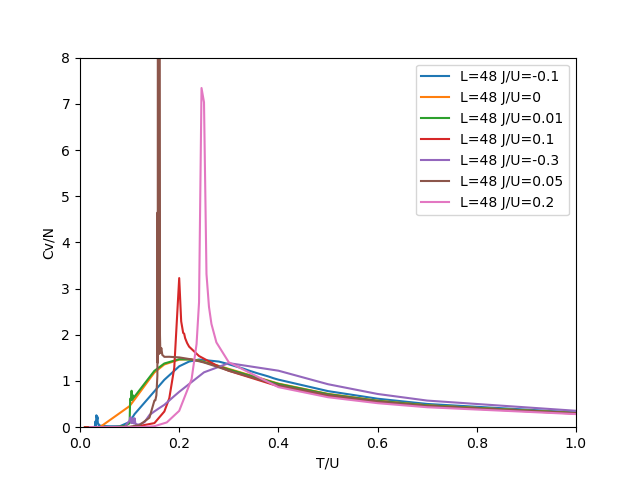

In [6]:
skip = 0
ts0, ds0 = get_all_cvs("data/vsweeps/-0.1/*/energy.dat", skip=skip)
ts1, ds1 = get_all_cvs("data/vsweeps/0/*/energy.dat", skip=skip)
ts2, ds2 = get_all_cvs("data/vsweeps/0.01/*/energy.dat", skip=skip)
ts3, ds3 = get_all_cvs("data/vsweeps/0.1/*/energy.dat", skip=skip)

ts4, ds4 = get_all_cvs("data/vsweeps/-0.3/*/energy.dat", skip=skip)
ts5, ds5 = get_all_cvs("data/vsweeps/0.05/*/energy.dat", skip=skip)
ts6, ds6 = get_all_cvs("data/vsweeps/0.2/*/energy.dat", skip=skip)

plt.close("all")
plt.figure()
plt.plot(ts0, ds0/4, label="L=48 J/U=-0.1")
plt.plot(ts1, ds1/4, label="L=48 J/U=0")
plt.plot(ts2, ds2/4, label="L=48 J/U=0.01")
plt.plot(ts3, ds3/4, label="L=48 J/U=0.1")
plt.plot(ts4, ds4/4, label="L=48 J/U=-0.3")
plt.plot(ts5, ds5/4, label="L=48 J/U=0.05")
plt.plot(ts6, ds6/4, label="L=48 J/U=0.2")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 1])
plt.ylim([0, 8])
plt.legend()

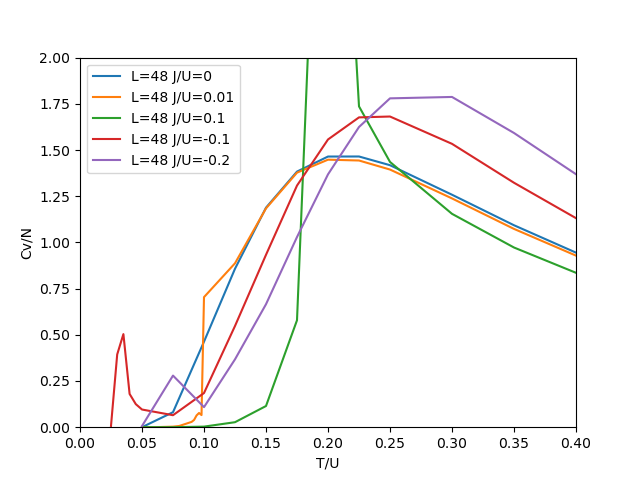

No such comm: a99865ca3697491c86e9051449d55ec6


No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm: 36d34ec1c36c47cab54004ece4856e9d
No such comm:

In [302]:
skip = 0
ts0, ds0 = get_all_cvs("data/vsweeps2/0/48/*/energy.dat", skip=skip)
ts1, ds1 = get_all_cvs("data/vsweeps2/0.01/48/*/energy.dat", skip=skip)
ts2, ds2 = get_all_cvs("data/vsweeps2/0.1/48/*/energy.dat", skip=skip)
ts3, ds3 = get_all_cvs("data/vsweeps2/-0.1/48/*/energy.dat", skip=skip)
ts4, ds4 = get_all_cvs("data/vsweeps2/-0.2/48/*/energy.dat", skip=skip)

plt.close("all")
plt.figure()
plt.plot(ts0, ds0, label="L=48 J/U=0")
plt.plot(ts1, ds1, label="L=48 J/U=0.01")
plt.plot(ts2, ds2, label="L=48 J/U=0.1")
plt.plot(ts3, ds3, label="L=48 J/U=-0.1")
plt.plot(ts4, ds4, label="L=48 J/U=-0.2")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 0.4])
plt.ylim([0, 2])
plt.legend()

Text(0.5, 1.0, 'L=48 J=0.01')

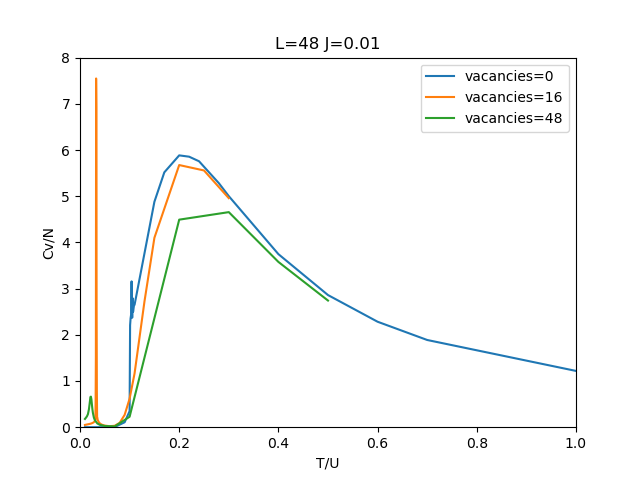

In [15]:
ts1, ds1 = get_all_cvs("data/vsweeps/0.01/*_0/energy.dat")
ts2, ds2 = get_all_cvs("data/vsweeps/v48/0.01/*_0/energy.dat", skip=10)
ts3, ds3 = get_all_cvs("data/vsweeps/v144/0.01/*_0/energy.dat")

# ds2[[11, 12, 14, 15, 17, 18]] *= 4
# ds2[[11, 12, 14, 15, 17, 18]] *= 2

plt.close("all")
plt.figure()
plt.plot(ts1, ds1, label="vacancies=0")
plt.plot(ts2, ds2, label="vacancies=16")
plt.plot(ts3, ds3, label="vacancies=48")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 1])
plt.ylim([0, 8])
plt.legend()
plt.title("L=48 J=0.01")

Text(0.5, 1.0, 'Comparison of MC algorithms J=0 L=48')

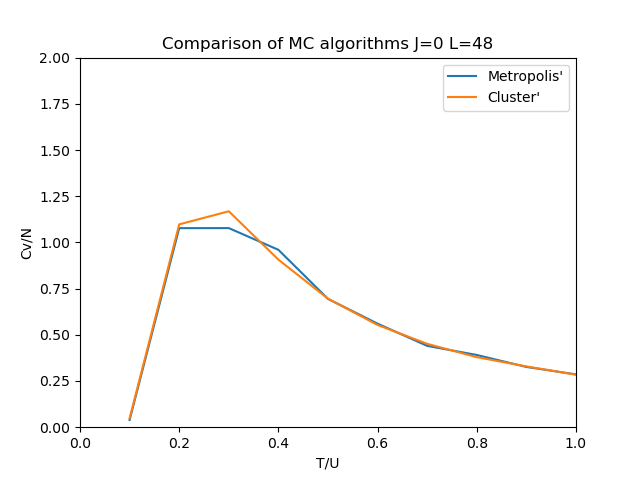

In [67]:
skip=10
ts1, ds1 = get_all_cvs("data/compare/metro/*/energy.dat", skip=skip)
ts2, ds2 = get_all_cvs("data/compare/pocket/*/energy.dat", skip=skip)

plt.close("all")
plt.figure()
plt.plot(ts1, ds1, label="Metropolis'")
plt.plot(ts2, ds2, label="Cluster'")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 1])
plt.ylim([0, 2])
plt.legend()
plt.title("Comparison of MC algorithms J=0 L=48")

Text(0.5, 1.0, 'Comparison of MC algorithms J=0 L=48')

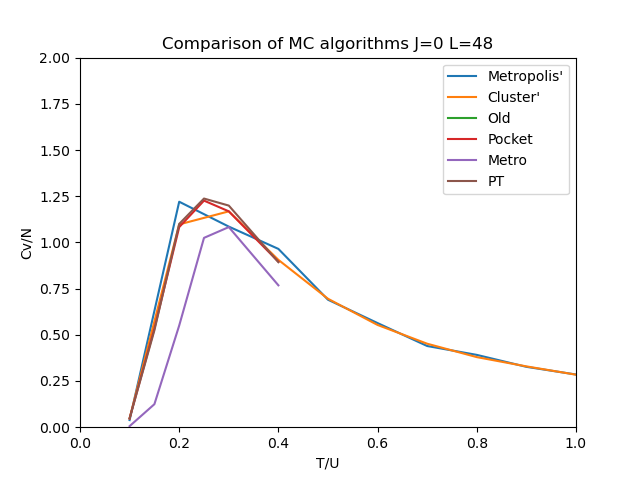

In [7]:
skip=3
ts1, ds1 = get_all_cvs("data/compare/metro/*/energy.dat", skip=skip)
ts2, ds2 = get_all_cvs("data/compare/pocket/*/energy.dat", skip=skip)
ts3, ds3 = get_all_cvs("data/compare2/old/*/energy.dat", skip=skip)
ts4, ds4 = get_all_cvs("data/compare2/pocket/*/energy.dat", skip=skip)
ts5, ds5 = get_all_cvs("data/compare2/metro/*/energy.dat", skip=skip)
ts6, ds6 = get_all_cvs("data/compare2/pt/*/energy.dat", skip=skip)

plt.close("all")
plt.figure()
plt.plot(ts1, ds1, label="Metropolis'")
plt.plot(ts2, ds2, label="Cluster'")
plt.plot(ts3, ds3, label="Old")
plt.plot(ts4, ds4, label="Pocket")
plt.plot(ts5, ds5, label="Metro")
plt.plot(ts6, ds6, label="PT")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 1])
plt.ylim([0, 2])
plt.legend()
plt.title("Comparison of MC algorithms J=0 L=48")

Text(0.5, 1.0, 'Comparison of MC algorithms J=0 L=48')

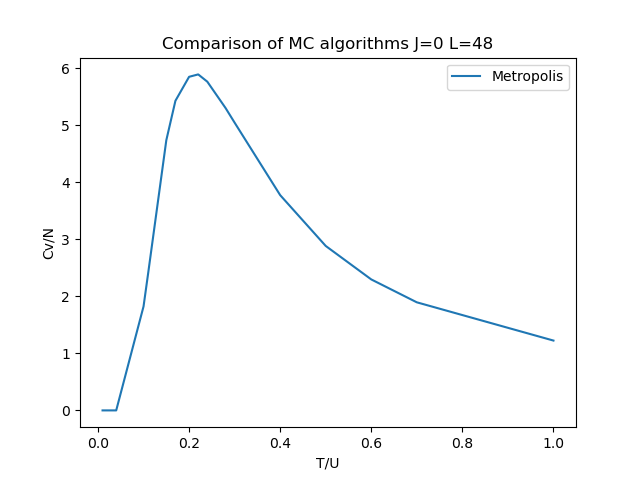

In [5]:
skip=5
ts1, ds1 = get_all_cvs("data/vsweeps/0/*/energy.dat", skip=skip)

plt.close("all")
plt.figure()
plt.plot(ts1, ds1, label="Metropolis")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.legend()
plt.title("Comparison of MC algorithms J=0 L=48")

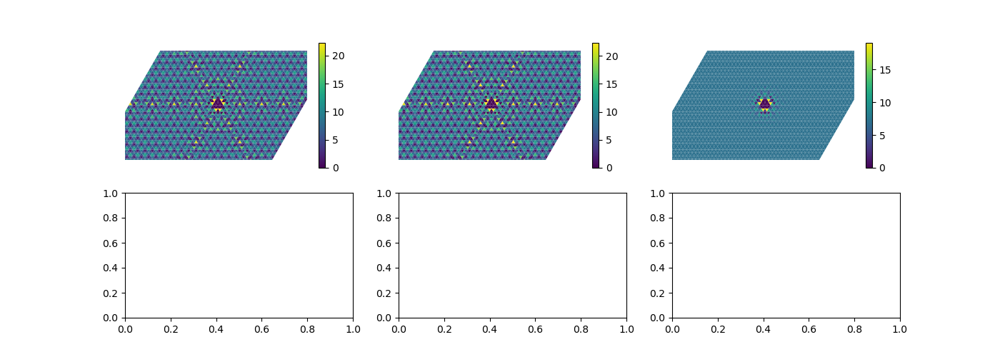

In [199]:
data1 = read_accumulator("data/vsweeps/v144/-0.1/48x48_r-144_t0.0050_j-0.1000_40000000.5_0/tri-tri.dat", skip=1)[0].reshape((48, 48, 2))
data2 = read_accumulator("data/vsweeps/v144/-0.1/48x48_r-144_t0.0100_j-0.1000_40000000.5_0/tri-tri.dat", skip=1)[0].reshape((48, 48, 2))
data3 = read_accumulator("data/vsweeps/v144/-0.1/48x48_r-144_t0.1000_j-0.1000_40000000.5_0/tri-tri.dat", skip=1)[0].reshape((48, 48, 2))

fig, ax = plt.subplots(2, 3, figsize=[14, 5])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
# plot2d_hex(ax[1,0], data4)
# plot2d_hex(ax[1,1], data5)
# plot2d_hex(ax[1,2], data6)

## old

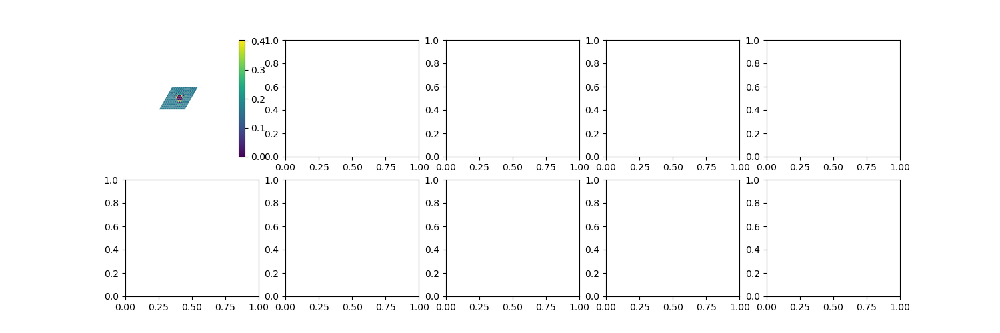

In [5]:
data1 = read_accumulator("data/temp/12x12_r-3_t0.000000_j0.000_100000.100_0/tri-tri.dat", skip=10)[0].reshape((12, 12, 2))
fig, ax = plt.subplots(2, 5, figsize=[15, 5])
plot2d_hex(ax[0,0], data1)

In [ ]:
data1 = read_accumulator("data/FT/48x48_r-3_uinf_4j0.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))
data2 = read_accumulator("data/FT/48x48_r-3_uinf_4j-1.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))
data3 = read_accumulator("data/FT/48x48_r-3_uinf_4j-2.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))
data4 = read_accumulator("data/FT/48x48_r-3_uinf_4j-3.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))
data5 = read_accumulator("data/FT/48x48_r-3_uinf_4j-4.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=[15, 5])
plot2d(ax[0,0], data1)
plot2d(ax[0,1], data2)
plot2d(ax[0,2], data3)
plot2d(ax[0,3], data4)
plot2d(ax[0,4], data5)
ax[0,0].set_title("0")
ax[0,1].set_title("-1")
ax[0,2].set_title("-2")
ax[0,3].set_title("-3")
ax[0,4].set_title("-4")

In [ ]:
data1 = read_accumulator("data/FT/48x48_r-3_uinf_4j0.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))
data2 = read_accumulator("data/FT/48x48_r-3_uinf_4j1.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))
data3 = read_accumulator("data/FT/48x48_r-3_uinf_4j2.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))
data4 = read_accumulator("data/FT/48x48_r-3_uinf_4j3.00_10000000.5_0/mono-mono.dat", skip=500)[0].reshape((48, 48))

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=[15, 5])
plot2d(ax[0,0], np.log(data1+1))
plot2d(ax[0,1], np.log(data2+1))
plot2d(ax[0,2], np.log(data3+1))
plot2d(ax[0,3], np.log(data4+1))
ax[0,0].set_title("0")
ax[0,1].set_title("1")
ax[0,2].set_title("2")
ax[0,3].set_title("3")

scratch

In [ ]:
data1 = read_accumulator("data/", skip=10)[0].reshape((96, 96, 2))

Text(0.5, 1.0, 'T=0.07')

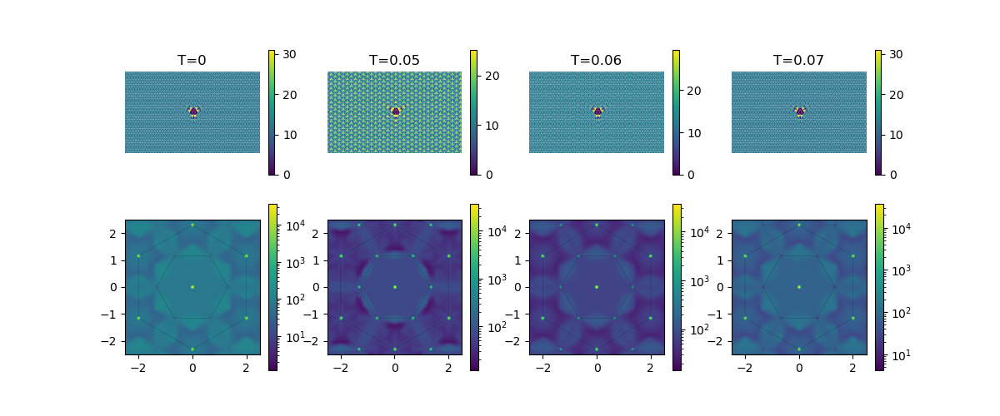

In [3]:
data1 = read_accumulator("data/obd/72x72_r-0_t0.000000_j0.000_1000000.5_0/tri-tri.dat", skip=10)[0].reshape((72, 72, 2))
data2 = read_accumulator("data/obd/72x72_r-0_t0.050000_j0.000_1000000.5_1/tri-tri.dat", skip=100)[0].reshape((72, 72, 2))
data3 = read_accumulator("data/obd/72x72_r-0_t0.060000_j0.000_1000000.5_0/tri-tri.dat", skip=50)[0].reshape((72, 72, 2))
data4 = read_accumulator("data/obd/72x72_r-0_t0.070000_j0.000_1000000.5_0/tri-tri.dat", skip=50)[0].reshape((72, 72, 2))
fig, ax = plt.subplots(2, 4, figsize=[12, 5], height_ratios=[6, 8])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
plot2d_hex(ax[0,3], data4)
plot_FT(ax[1,0], FT_hex(data1), proj="logabs")
plot_FT(ax[1,1], FT_hex(data2), proj="logabs")
plot_FT(ax[1,2], FT_hex(data3), proj="logabs")
plot_FT(ax[1,3], FT_hex(data4), proj="logabs")
ax[0,0].set_title("T=0")
ax[0,1].set_title("T=0.05")
ax[0,2].set_title("T=0.06")
ax[0,3].set_title("T=0.07")

Text(0.5, 1.0, 'T=0.07')

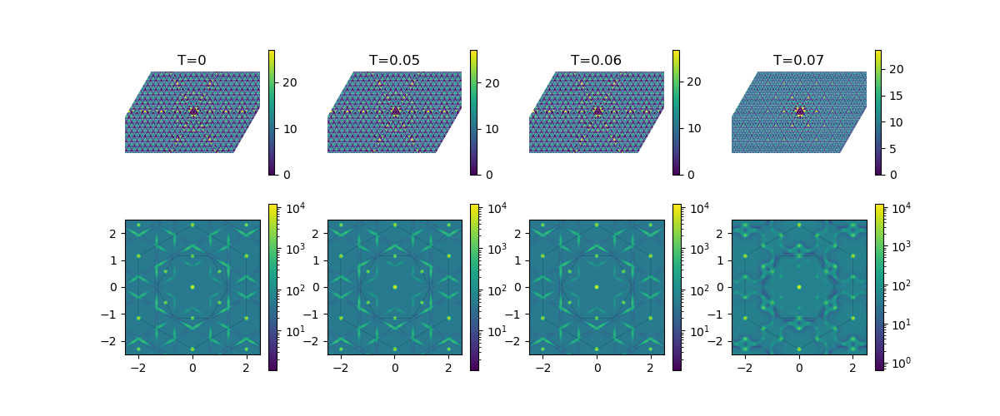

In [4]:
data1 = read_accumulator("data/vsweeps/-0.3/48x48_r-0_t0.0200_j-0.3000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data2 = read_accumulator("data/vsweeps/-0.3/48x48_r-0_t0.0600_j-0.3000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data3 = read_accumulator("data/vsweeps/-0.3/48x48_r-0_t0.0800_j-0.3000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data4 = read_accumulator("data/vsweeps/-0.3/48x48_r-0_t0.1000_j-0.3000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
fig, ax = plt.subplots(2, 4, figsize=[12, 5], height_ratios=[6, 8])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
plot2d_hex(ax[0,3], data4)
plot_FT(ax[1,0], FT_hex(data1), proj="logabs")
plot_FT(ax[1,1], FT_hex(data2), proj="logabs")
plot_FT(ax[1,2], FT_hex(data3), proj="logabs")
plot_FT(ax[1,3], FT_hex(data4), proj="logabs")
ax[0,0].set_title("T=0")
ax[0,1].set_title("T=0.05")
ax[0,2].set_title("T=0.06")
ax[0,3].set_title("T=0.07")

Text(0.5, 1.0, 'T=0.07')

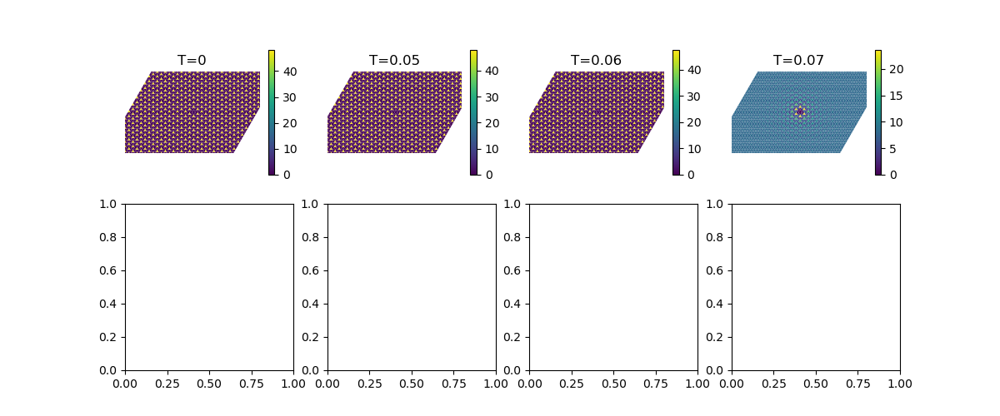

In [63]:
data1 = read_accumulator("data/vsweeps/0.2/48x48_r-0_t0.0200_j0.2000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data2 = read_accumulator("data/vsweeps/0.2/48x48_r-0_t0.1000_j0.2000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data3 = read_accumulator("data/vsweeps/0.2/48x48_r-0_t0.2000_j0.2000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data4 = read_accumulator("data/vsweeps/0.2/48x48_r-0_t0.2500_j0.2000_40000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
fig, ax = plt.subplots(2, 4, figsize=[12, 5], height_ratios=[6, 8])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
plot2d_hex(ax[0,3], data4)
# plot_FT(ax[1,0], FT_hex(data1), proj="logabs")
# plot_FT(ax[1,1], FT_hex(data2), proj="logabs")
# plot_FT(ax[1,2], FT_hex(data3), proj="logabs")
# plot_FT(ax[1,3], FT_hex(data4), proj="logabs")
ax[0,0].set_title("T=0")
ax[0,1].set_title("T=0.05")
ax[0,2].set_title("T=0.06")
ax[0,3].set_title("T=0.07")

9

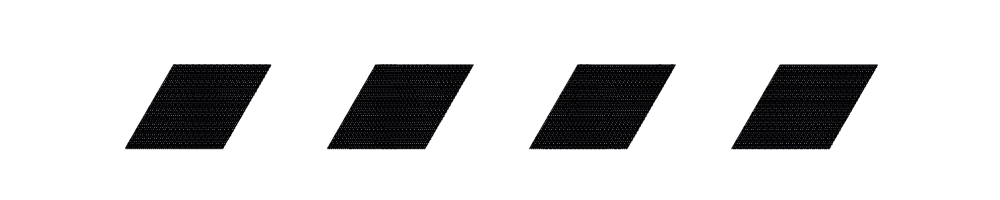

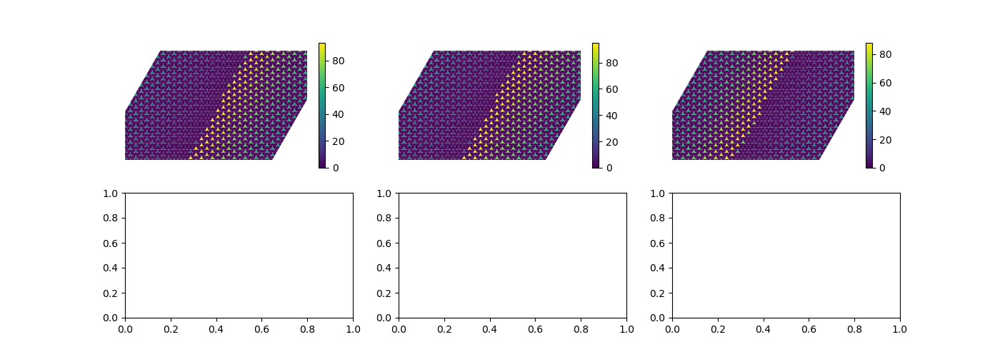

In [127]:
data1 = read_accumulator("data/temp/48x48_r-0_t0.100000_j0.000_100000.100_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data1 = read_accumulator("data/temp/48x48_r-0_t0.100000_j0.000_100000.100_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))

fig, ax = plt.subplots(2, 3, figsize=[14, 5])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)

### bw

In [ ]:
js1 = np.array([-0.5, -1, -1.5, -1.7, -1.9, -2, -2.1, -2.3, -2.5, -3, -3.5])
ds1 = np.array([read_accumulator(f"data/bwtrans/24x24_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js1])
js2 = np.array([-0.5, -1, -1.5, -1.7, -1.9, -2, -2.1, -2.3, -2.5, -3, -3.5, -4, -5, -6, -7])
ds2 = np.array([read_accumulator(f"data/bwtrans/36x36_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js2])
js3 = np.array([-0.5, -1, -1.5, -1.7, -1.9, -2, -2.1, -2.3, -2.5, -3, -3.5, -4, -5, -6, -7])
ds3 = np.array([read_accumulator(f"data/bwtrans/48x48_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js3])
js4 = np.array([-0.5, -1, -1.5, -1.7, -1.9, -2, -2.1, -2.3, -2.5, -3, -3.5, -4, -5, -6, -7])
ds4 = np.array([read_accumulator(f"data/bwtrans/60x60_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js4])

In [ ]:
plt.figure()
plt.plot(js1, ds1*ds1*js1*js1/24/24*3, label="24")
plt.plot(js2, ds2*ds2*js2*js2/36/36*3, label="36")
plt.plot(js3, ds3*ds3*js3*js3/48/48*3, label="48")
plt.plot(js4, ds4*ds4*js4*js4/60/60*3, label="60")
plt.legend()
plt.xlabel("J4/T")
plt.ylabel("Cv/N")

In [ ]:
js1 = np.array([-2, -2.2, -2.4, -2.6, -2.8, -3, -3.2, -3.4, -3.6, -3.8, -4])
ds1 = np.array([read_accumulator(f"data/bwtrans2/12x12_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js1])
js2 = np.array([-2, -2.2, -2.4, -2.6, -2.8, -3, -3.2, -3.4, -3.6, -3.8, -4])
ds2 = np.array([read_accumulator(f"data/bwtrans2/24x24_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js2])
js3 = np.array([-2, -2.2, -2.4, -2.6, -2.8, -3, -3.2, -3.4, -3.6, -3.8, -4])
ds3 = np.array([read_accumulator(f"data/bwtrans2/36x36_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js3])
js4 = np.array([-2, -2.2, -2.4, -2.6, -2.8, -3, -3.2, -3.4, -3.6, -3.8, -4])
ds4 = np.array([read_accumulator(f"data/bwtrans2/48x48_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js4])
js5 = np.array([-2, -2.2, -2.4, -2.6, -2.8, -3, -3.2, -3.4, -3.6, -3.8, -4])
ds5 = np.array([read_accumulator(f"data/bwtrans2/60x60_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=100)[1][1] for x in js5])

In [ ]:
plt.figure()
plt.plot(js1, ds1*ds1*js1*js1/12/12*3, label="12")
plt.plot(js2, ds2*ds2*js2*js2/24/24*3, label="24")
plt.plot(js3, ds3*ds3*js3*js3/36/36*3, label="36")
plt.plot(js4, ds4*ds4*js4*js4/48/48*3, label="48")
plt.plot(js5, ds5*ds5*js5*js5/60/60*3, label="60")
plt.legend()
plt.xlabel("J4/T")
plt.ylabel("Cv/N")

In [ ]:
plt.figure()
plt.plot(read_accumulator_raw(f"data/bwtrans2/60x60_r-3_uinf_4j-3.40_40000000.5_0/energy.dat")[1][:, 1])
plt.title("L=60 J4=-3.4")
plt.xlabel("MC sweep # (*25000)")
plt.ylabel("# j4 bonds")

In [ ]:
data1 = read_accumulator("data/bwtrans2/12x12_r-3_uinf_4j-2.00_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((12, 12, 2))
data2 = read_accumulator("data/bwtrans2/24x24_r-3_uinf_4j-2.00_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((24, 24, 2))
data3 = read_accumulator("data/bwtrans2/48x48_r-3_uinf_4j-2.00_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((48, 48, 2))
data4 = read_accumulator("data/bwtrans2/12x12_r-3_uinf_4j-4.00_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((12, 12, 2))
data5 = read_accumulator("data/bwtrans2/24x24_r-3_uinf_4j-4.00_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((24, 24, 2))
data6 = read_accumulator("data/bwtrans2/48x48_r-3_uinf_4j-4.00_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((48, 48, 2))

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=[15, 6])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
plot2d_hex(ax[1,0], data4)
plot2d_hex(ax[1,1], data5)
plot2d_hex(ax[1,2], data6)

In [ ]:
data1 = read_accumulator("data/temp/12x12_r-3_uinf_4j-999.0000_10000.1_0/tri-tri.dat", skip=1000)[0].reshape((12, 12, 2))
data2 = read_accumulator("data/temp/12x12_r-3_uinf_4j-10.0000_10000.1_0/tri-tri.dat", skip=1000)[0].reshape((12, 12, 2))
data3 = read_accumulator("data/temp/12x12_r-3_uinf_4j-4.0000_10000.1_3/tri-tri.dat", skip=1000)[0].reshape((12, 12, 2))
data4 = read_accumulator("data/temp/12x12_r-3_uinf_4j-2.0000_10000.1_0/tri-tri.dat", skip=1000)[0].reshape((12, 12, 2))

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=[15, 6])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
plot2d_hex(ax[0,3], data4)

In [ ]:
js = np.array([0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.16, 0.18, 0.2, 0.25, 0.3, 0.4, 0.5])
ds1 = np.array([read_accumulator(f"data/rt3trans/24x24_r-3_uinf_4j{x:.2f}_20000000.5_0/energy.dat", skip=300)[1][1] for x in js])
ds2 = np.array([read_accumulator(f"data/rt3trans/36x36_r-3_uinf_4j{x:.2f}_20000000.5_0/energy.dat", skip=300)[1][1] for x in js])
ds3 = np.array([read_accumulator(f"data/rt3trans/48x48_r-3_uinf_4j{x:.2f}_20000000.5_0/energy.dat", skip=300)[1][1] for x in js])

In [ ]:
plt.figure()
plt.plot(js, ds1*ds1*js*js/24/24*3)
plt.plot(js, ds2*ds3*js*js/36/36*3)
plt.plot(js, ds3*ds3*js*js/48/48*3)
plt.xlabel("T/J4")
plt.ylabel("Cv/N")

### rt3

In [ ]:
js1 = np.array([0.05, 0.1, 0.15, 0.17, 0.20, 0.23, 0.25, 0.27, 0.3, 0.4])
ds1 = np.array([read_accumulator(f"data/rt3trans2/12x12_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=200)[1][1] for x in js1])
js2 = np.array([0.1, 0.15, 0.17, 0.19, 0.2, 0.21, 0.23, 0.25, 0.3])
ds2 = np.array([read_accumulator(f"data/rt3trans2/24x24_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=200)[1][1] for x in js2])
js3 = np.array([0.05, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.25])
ds3 = np.array([read_accumulator(f"data/rt3trans2/36x36_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=200)[1][1] for x in js3])
js4 = np.array([0.05, 0.07, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.17, 0.20, 0.25])
ds4 = np.array([read_accumulator(f"data/rt3trans2/48x48_r-3_uinf_4j{x:.2f}_40000000.5_0/energy.dat", skip=200)[1][1] for x in js4])
js5 = np.array([0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.15])
ds5 = np.array([read_accumulator(f"data/rt3trans2/60x60_r-3_uinf_4j{x:.4f}_40000000.5_0/energy.dat", skip=200)[1][1] for x in js5])

In [ ]:
plt.figure()
plt.plot(js1, ds1*ds1*js1*js1/12/12*3, label="L=12")
plt.plot(js2, ds2*ds2*js2*js2/48/24*3, label="L=24")
plt.plot(js3, ds3*ds3*js3*js3/36/36*3, label="L=36")
plt.plot(js4, ds4*ds4*js4*js4/48/48*3, label="L=48")
plt.plot(js5, ds5*ds5*js5*js5/60/60*3, label="L=60")
plt.xlabel("T/J4")
plt.ylabel("Cv/N")
plt.legend()

In [ ]:
np.sqrt(data[2][:, 1]/data[0])

In [ ]:
plt.figure()

# data = read_accumulator_raw(f"data/rt3trans2/60x60_r-3_uinf_4j0.0900_40000000.5_0/energy.dat")
# plot_timeseries(data[1][:, 1], data[2][:, 1], label="J4=0.09")
# data = read_accumulator_raw(f"data/rt3trans2/60x60_r-3_uinf_4j0.1000_40000000.5_0/energy.dat")
# plot_timeseries(data[1][:, 1], data[2][:, 1], label="J4=0.10")

data = read_accumulator_raw(f"data/rt3trans2/12x12_r-3_uinf_4j0.20_40000000.5_0/energy.dat")
plot_timeseries(data[1][:, 1], data[2][:, 1], label="J4=0.20")
data = read_accumulator_raw(f"data/rt3trans2/12x12_r-3_uinf_4j0.30_40000000.5_0/energy.dat")
plot_timeseries(data[1][:, 1], data[2][:, 1], label="J4=0.30")
data = read_accumulator_raw(f"data/rt3trans2/12x12_r-3_uinf_4j0.40_40000000.5_0/energy.dat")
plot_timeseries(data[1][:, 1], data[2][:, 1], label="J4=0.40")

plt.title("L=12")
plt.xlabel("MC sweep # (*25000)")
plt.ylabel("# j4 bonds")
plt.legend()

In [ ]:
data1 = read_accumulator("data/rt3trans2/12x12_r-3_uinf_4j0.25_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((12, 12, 2))
data2 = read_accumulator("data/rt3trans2/12x12_r-3_uinf_4j0.40_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((12, 12, 2))
data3 = read_accumulator("data/rt3trans2/24x24_r-3_uinf_4j0.20_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((24, 24, 2))
data4 = read_accumulator("data/rt3trans2/24x24_r-3_uinf_4j0.25_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((24, 24, 2))
data5 = read_accumulator("data/rt3trans2/36x36_r-3_uinf_4j0.15_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((36, 36, 2))
data6 = read_accumulator("data/rt3trans2/36x36_r-3_uinf_4j0.17_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((36, 36, 2))
data7 = read_accumulator("data/rt3trans2/48x48_r-3_uinf_4j0.10_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((48, 48, 2))
data8 = read_accumulator("data/rt3trans2/48x48_r-3_uinf_4j0.15_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((48, 48, 2))
data9 = read_accumulator("data/rt3trans2/60x60_r-3_uinf_4j0.0600_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((60, 60, 2))

In [ ]:
data10 = read_accumulator("data/rt3trans2/60x60_r-3_uinf_4j0.1000_40000000.5_0/tri-tri.dat", skip=100)[0].reshape((60, 60, 2))

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=[15, 6])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[1,0], data2)
plot2d_hex(ax[0,1], data3)
plot2d_hex(ax[1,1], data4)
plot2d_hex(ax[0,2], data5)
plot2d_hex(ax[1,2], data6)
plot2d_hex(ax[0,3], data7)
plot2d_hex(ax[1,3], data8)
plot2d_hex(ax[0,4], data9)
plot2d_hex(ax[1,4], data10)

### u

In [ ]:
js = np.array([0.05, 0.1, 0.2, 0.5, 0.8, 1, 1.5, 2, 2.5, 3, 4, 5, 6, 7, 8, 10])
ds0 = np.array([read_accumulator(f"data/FT/6x6_r-3_u{x:.2f}_4j0.00_10000000.5_0/energy.dat")[1][0] for x in js])
ds1 = np.array([read_accumulator(f"data/FT/12x12_r-3_u{x:.2f}_4j0.00_10000000.5_0/energy.dat")[1][0] for x in js])
ds2 = np.array([read_accumulator(f"data/FT/24x24_r-3_u{x:.2f}_4j0.00_10000000.5_0/energy.dat")[1][0] for x in js])
ds3 = np.array([read_accumulator(f"data/FT/36x36_r-3_u{x:.2f}_4j0.00_10000000.5_0/energy.dat")[1][0] for x in js])
ds4 = np.array([read_accumulator(f"data/FT/48x48_r-3_u{x:.2f}_4j0.00_10000000.5_0/energy.dat")[1][0] for x in js])

In [ ]:
plt.close("all")
plt.figure()
plt.plot(js, ds0*ds0*js*js/6/6*3, label="L=6")
plt.plot(js, ds1*ds1*js*js/12/12*3, label="L=12")
plt.plot(js, ds2*ds2*js*js/24/24*3, label="L=24")
plt.plot(js, ds3*ds3*js*js/36/36*3, label="L=36")
plt.plot(js, ds4*ds4*js*js/48/48*3, label="L=48")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 2])
plt.legend()

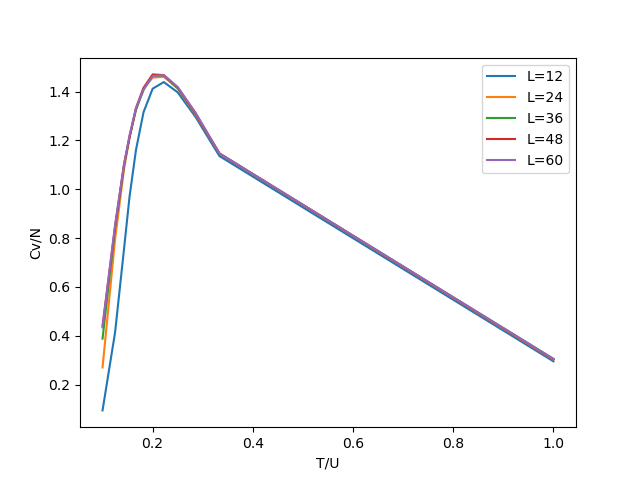

In [7]:
js0 = np.array([1, 2, 2.5, 3, 3.25, 3.5, 3.75, 4, 4.25, 4.5, 4.75, 5, 6, 8])
ds0 = np.array([read_accumulator(f"data/utrans/6x6_r-3_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js0])
js1 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds1 = np.array([read_accumulator(f"data/utrans/12x12_r-3_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js1])
js2 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds2 = np.array([read_accumulator(f"data/utrans/24x24_r-3_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js2])
js3 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds3 = np.array([read_accumulator(f"data/utrans/36x36_r-3_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js3])
js4 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds4 = np.array([read_accumulator(f"data/utrans/48x48_r-3_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js4])
js5 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds5 = np.array([read_accumulator(f"data/utrans/60x60_r-3_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js5])

plt.close("all")
plt.figure()
# plt.plot(1/js0, ds0*ds0*js0*js0/6/6*3/4, label="L=6")
plt.plot(1/js1, ds1*ds1*js1*js1/12/12*3/4, label="L=12")
plt.plot(1/js2, ds2*ds2*js2*js2/24/24*3/4, label="L=24")
plt.plot(1/js3, ds3*ds3*js3*js3/36/36*3/4, label="L=36")
plt.plot(1/js4, ds4*ds4*js4*js4/48/48*3/4, label="L=48")
plt.plot(1/js5, ds5*ds5*js5*js5/60/60*3/4, label="L=60")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt
plt.legend()

In [ ]:
js1 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds1 = np.array([read_accumulator(f"data/utrans/60x60_r-3_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js1])
js2 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds2 = np.array([read_accumulator(f"data/utrans/60x60_r-0_u{x:.4f}_4j0.0000_40000000.5_0/energy.dat")[1][0] for x in js2])

plt.close("all")
plt.figure()
plt.plot(js1, ds1*ds1*js1*js1/60/60*3, label="L=60 v=-1")
plt.plot(js2, ds2*ds2*js2*js2/60/60*3, label="L=60 v=0")
plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.legend()

In [ ]:
data1 = read_accumulator("data/FT/24x24_r-3_u2.00_4j0.00_10000000.5_0/tri-tri.dat", skip=10)[0].reshape((24, 24, 2))
data2 = read_accumulator("data/FT/24x24_r-3_u5.00_4j0.00_10000000.5_0/tri-tri.dat", skip=10)[0].reshape((24, 24, 2))
data3 = read_accumulator("data/FT/24x24_r-3_u8.00_4j0.00_10000000.5_0/tri-tri.dat", skip=10)[0].reshape((24, 24, 2))

data4 = read_accumulator("data/FT/48x48_r-3_u2.00_4j0.00_10000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data5 = read_accumulator("data/FT/48x48_r-3_u5.00_4j0.00_10000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))
data6 = read_accumulator("data/FT/48x48_r-3_u8.00_4j0.00_10000000.5_0/tri-tri.dat", skip=10)[0].reshape((48, 48, 2))

fig, ax = plt.subplots(2, 3, figsize=[15, 6])
plot2d_hex(ax[0,0], data1)
plot2d_hex(ax[0,1], data2)
plot2d_hex(ax[0,2], data3)
plot2d_hex(ax[1,0], data4)
plot2d_hex(ax[1,1], data5)
plot2d_hex(ax[1,2], data6)

In [ ]:
c = 1
js0 = np.array([1, 2, 2.5, 3, 3.25, 3.5, 3.75, 4, 4.25, 4.5, 4.75, 5, 6, 8])
ds0 = np.array([read_accumulator(f"data/utrans/6x6_r-3_u{x:.4f}_4j0.0000_40000000.5_0/cluster-count.dat")[0][c] for x in js0])
js1 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds1 = np.array([read_accumulator(f"data/utrans/12x12_r-3_u{x:.4f}_4j0.0000_40000000.5_0/cluster-count.dat")[0][c] for x in js1])
js2 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds2 = np.array([read_accumulator(f"data/utrans/24x24_r-3_u{x:.4f}_4j0.0000_40000000.5_0/cluster-count.dat")[0][c] for x in js2])
js3 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds3 = np.array([read_accumulator(f"data/utrans/36x36_r-3_u{x:.4f}_4j0.0000_40000000.5_0/cluster-count.dat")[0][c] for x in js3])
js4 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds4 = np.array([read_accumulator(f"data/utrans/48x48_r-3_u{x:.4f}_4j0.0000_40000000.5_0/cluster-count.dat")[0][c] for x in js4])
js5 = np.array([1, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10])
ds5 = np.array([read_accumulator(f"data/utrans/60x60_r-3_u{x:.4f}_4j0.0000_40000000.5_0/cluster-count.dat")[0][c] for x in js5])

plt.close("all")
plt.figure()
plt.plot(1/js0, ds0/6/6, label="L=6")
plt.plot(1/js1, ds1/12/12, label="L=12")
plt.plot(1/js2, ds2/24/24, label="L=24")
plt.plot(1/js3, ds3/36/36, label="L=36")
plt.plot(1/js4, ds4/48/48, label="L=48")
plt.plot(1/js5, ds5/60/60, label="L=60")
plt.ylabel("cluster 1 density")
plt.xlabel("T/U")
plt.legend()

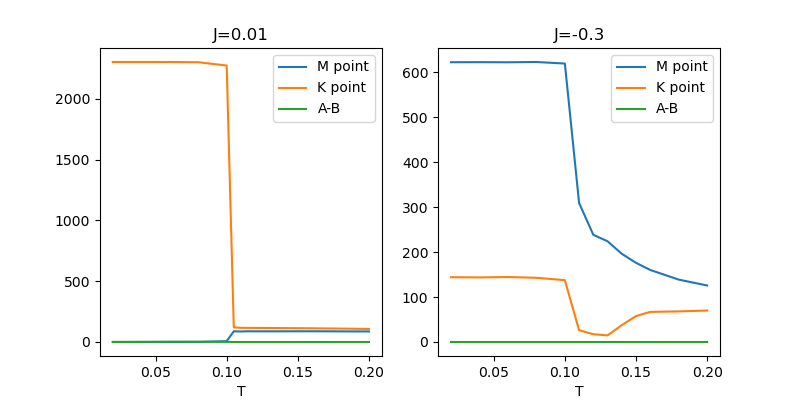

In [2]:
ts, ds = get_all_data("data/rt3order/48*/order.dat", lambda x, props: x[0], skip=100)
fig, ax = plt.subplots(1, 2, figsize=[8, 4])
ax[0].plot(ts, ds[:, 0], label="M point")
ax[0].plot(ts, ds[:, 3], label="K point")
ax[0].plot(ts, ds[:, 6], label="A-B")
ax[0].set_xlabel("T")
ax[0].set_title("J=0.01")
ax[0].legend()
ts, ds = get_all_data("data/bworder/48*/order.dat", lambda x, props: x[0], skip=100)
ax[1].plot(ts, ds[:, 0], label="M point")
ax[1].plot(ts, ds[:, 3], label="K point")
ax[1].plot(ts, ds[:, 6], label="A-B")
ax[1].set_xlabel("T")
ax[1].set_title("J=-0.3")
ax[1].legend()


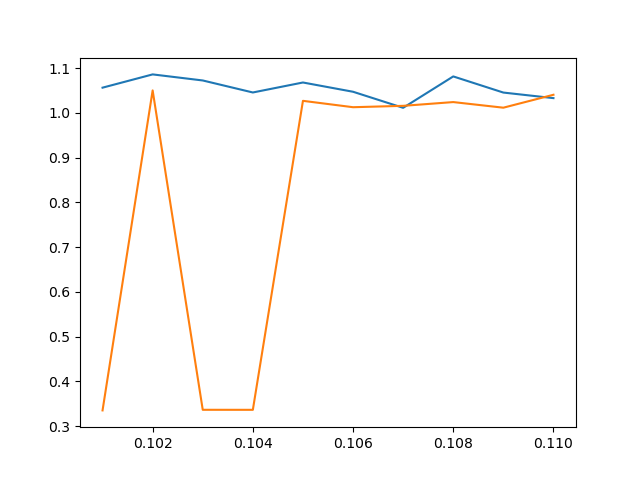

In [3]:
plt.figure()
ts, ds = get_all_data("data/rt3order2/48*/order.dat", lambda x, props: x[0], skip=100)
plt.plot(ts, ds[:, 8]/3/ds[:, 7]**2, label="A-B")
ts, ds = get_all_data("data/rt3order2/60*/order.dat", lambda x, props: x[0], skip=100)
plt.plot(ts, ds[:, 8]/3/ds[:, 7]**2, label="A-B")


### PD scaling

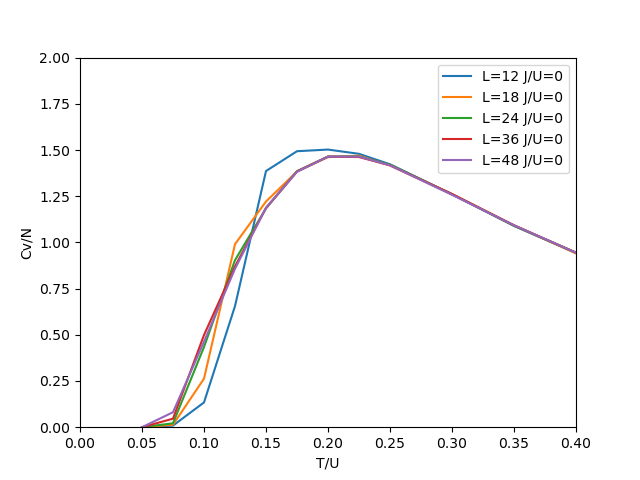

In [250]:
plt.close("all")
plt.figure()
skip = 20

ts1, ds1 = get_all_cvs("data/vsweeps2/0/12/*/energy.dat", skip=skip)
ts2, ds2 = get_all_cvs("data/vsweeps2/0/18/*/energy.dat", skip=skip)
ts3, ds3 = get_all_cvs("data/vsweeps2/0/24/*/energy.dat", skip=skip)
ts4, ds4 = get_all_cvs("data/vsweeps2/0/36/*/energy.dat", skip=skip)
ts5, ds5 = get_all_cvs("data/vsweeps2/0/48/*/energy.dat", skip=skip)
plt.plot(ts1, ds1, label="L=12 J/U=0")
plt.plot(ts2, ds2, label="L=18 J/U=0")
plt.plot(ts3, ds3, label="L=24 J/U=0")
plt.plot(ts4, ds4, label="L=36 J/U=0")
plt.plot(ts5, ds5, label="L=48 J/U=0")

plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 0.4])
plt.ylim([0, 2])
plt.legend()

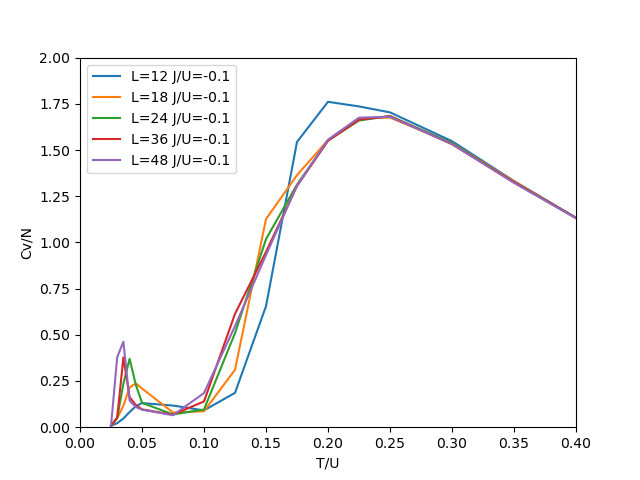

In [251]:
plt.close("all")
plt.figure()
skip = 20

ts1, ds1 = get_all_cvs("data/vsweeps2/-0.1/12/*/energy.dat", skip=skip)
ts2, ds2 = get_all_cvs("data/vsweeps2/-0.1/18/*/energy.dat", skip=skip)
ts3, ds3 = get_all_cvs("data/vsweeps2/-0.1/24/*/energy.dat", skip=skip)
ts4, ds4 = get_all_cvs("data/vsweeps2/-0.1/36/*/energy.dat", skip=skip)
ts5, ds5 = get_all_cvs("data/vsweeps2/-0.1/48/*/energy.dat", skip=skip)
plt.plot(ts1, ds1, label="L=12 J/U=-0.1")
plt.plot(ts2, ds2, label="L=18 J/U=-0.1")
plt.plot(ts3, ds3, label="L=24 J/U=-0.1")
plt.plot(ts4, ds4, label="L=36 J/U=-0.1")
plt.plot(ts5, ds5, label="L=48 J/U=-0.1")

plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 0.4])
plt.ylim([0, 2])
plt.legend()

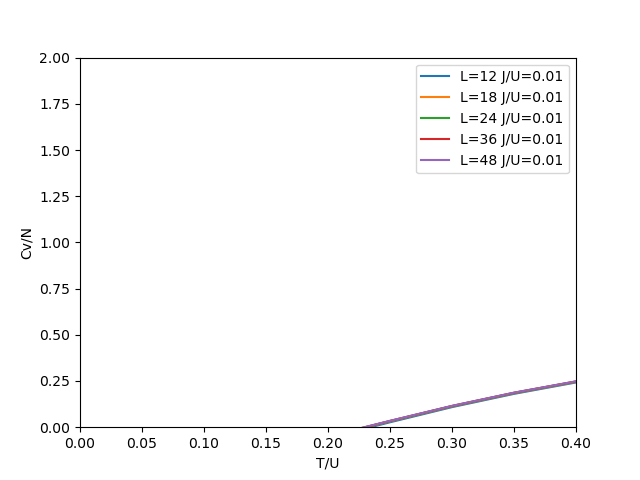

In [39]:
plt.close("all")
plt.figure()
skip = 10

ts1, ds1 = get_all_energies("data/vsweeps2/-0.1/12/*/energy.dat", skip=skip)
ts2, ds2 = get_all_energies("data/vsweeps2/-0.1/18/*/energy.dat", skip=skip)
ts3, ds3 = get_all_energies("data/vsweeps2/-0.1/24/*/energy.dat", skip=skip)
ts4, ds4 = get_all_energies("data/vsweeps2/-0.1/36/*/energy.dat", skip=skip)
ts5, ds5 = get_all_energies("data/vsweeps2/-0.1/48/*/energy.dat", skip=skip)
plt.plot(ts1, ds1, label="L=12 J/U=0.01")
plt.plot(ts2, ds2, label="L=18 J/U=0.01")
plt.plot(ts3, ds3, label="L=24 J/U=0.01")
plt.plot(ts4, ds4, label="L=36 J/U=0.01")
plt.plot(ts5, ds5, label="L=48 J/U=0.01")

plt.ylabel("Cv/N")
plt.xlabel("T/U")
plt.xlim([0, 0.4])
plt.ylim([0, 2])
plt.legend()

In [10]:
skip = 1
lens = []
for l in [24, 36, 48, 60]:
    T, data = get_all_data(f"new-data/vsweeps/single/0.2/{l}*/tri-tri.dat", lambda data, _: data[0].reshape((l, l, 2)), filter=lambda props: props["t"], skip=skip)

    ops = []
    for i in data:
        ops.append(np.abs(FT_hex(i)((4/3, 0))))
    lens.append([l, T, ops])

Text(0.5, 1.0, 'J=0.2 order parameter')

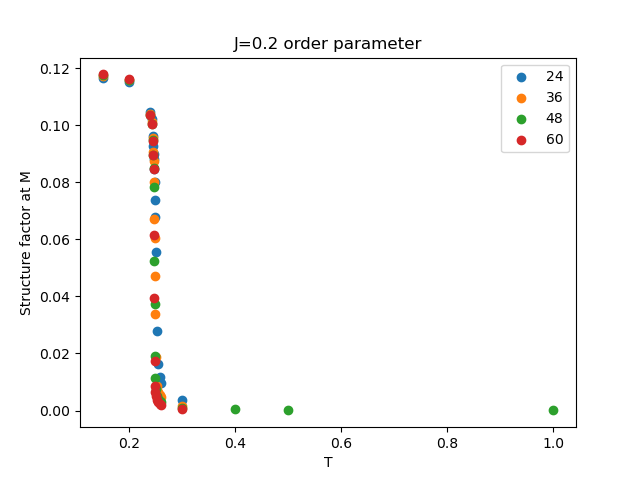

In [12]:
plt.figure()
for l, t, ops in lens:
    plt.scatter(t, np.array(ops) / l**2, label=l)
plt.legend()
plt.xlabel("T")
plt.ylabel("Structure factor at M")
plt.title("J=0.2 order parameter")

In [58]:
skip = 1
lens = []
# for l in [12, 18, 24, 36, 48]:
    # T, data = get_all_data(f"data/vsweeps2/-0.1/{l}/*/tri-tri.dat", lambda data, _: data[0].reshape((l, l, 2)), filter=lambda props: props["t"] < 0.3, skip=skip)
for l in [1]:
    T, data = get_all_data(f"data/temp/pt-doped[345]/*/tri-tri.dat", lambda data, _: data[0].reshape((48, 48, 2)), filter=lambda props: props["t"] < 0.3, skip=200000)

    ops = []
    for i in data:
        ops.append(np.abs(FT_hex(i)((0, 2/np.sqrt(3)))))
    lens.append([l, T, ops])

Text(0.5, 1.0, 'J=-0.1 order parameter')

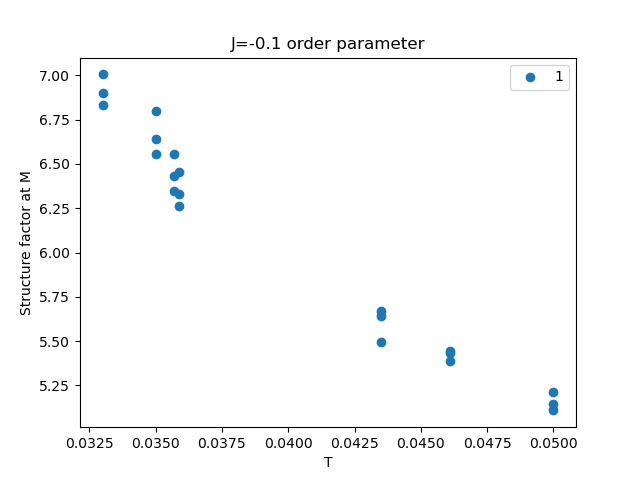

In [59]:
plt.figure()
for l, t, ops in lens:
    plt.scatter(t, np.array(ops) / l**2, label=l)
plt.legend()
plt.xlabel("T")
plt.ylabel("Structure factor at M")
plt.title("J=-0.1 order parameter")

In [188]:
skip = 10
lens = []
# for l in [12, 18, 24, 36, 48]:
#     T, data = get_all_data(f"data/vsweeps2/0.01/{l}/*/tri-tri.dat", lambda data, _: data[0].reshape((l, l, 2)), filter=lambda props: props["t"] < 0.15, skip=skip)
for l in [1]:
    T, data = get_all_data(f"data/pt-adapting/0.01/*/*/tri-tri.dat", lambda data, _: data[0].reshape((48, 48, 2)), filter=lambda props: props["t"] < 0.3, skip=200000)
    ops = []
    for i in data:
        ops.append(np.abs(FT_hex(i)((4/3, 0))))
    lens.append([l, T, ops])

Text(0.5, 1.0, 'J=0.01 order parameter')

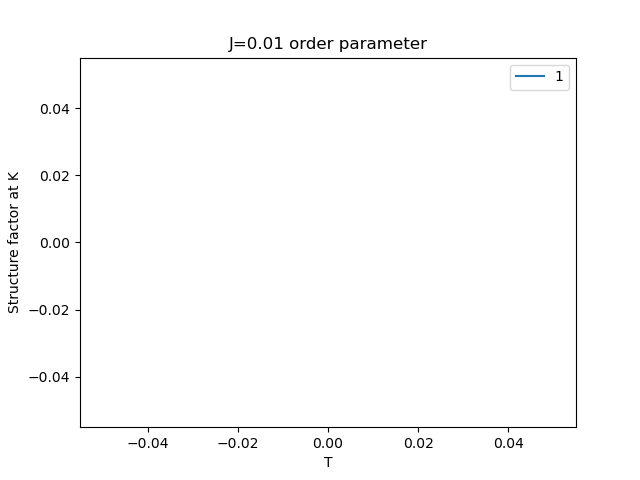

In [187]:
plt.figure()
for l, t, ops in lens:
    plt.plot(t, np.array(ops) / l**2, label=l)
plt.legend()
plt.xlabel("T")
plt.ylabel("Structure factor at K")
plt.title("J=0.01 order parameter")

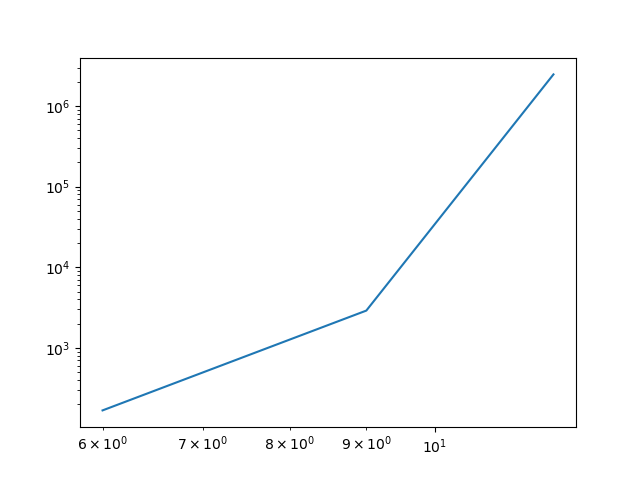

In [260]:
plt.figure()
plt.plot([6, 9, 12], [168,2904,2467326])
plt.xscale("log")
plt.yscale("log")

# Simple model

In [62]:
print(S(48)-entropies[0])
print(np.log(2700000)/48)
print(entropies[0])

0.30982821276585604
0.30851588189530327
2.3359686600098555


Average j4 bonds

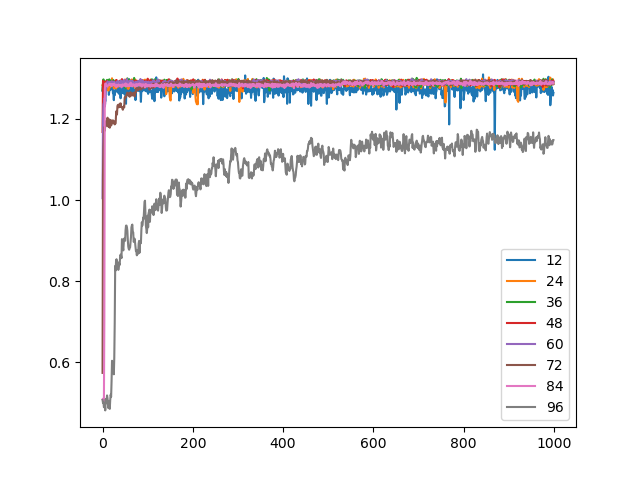

In [25]:
plt.figure()

ls = np.array([12, 24, 36, 48, 60, 72, 84, 96]) 
finals = []
for l in ls:
    if ls == 96:
        x = np.genfromtxt(f"new-data/disordered/{l}x{l}_r-0_t0.000000_j0.000_200000000.2000_0/energy-single.dat")
    else:
        x = np.genfromtxt(f"new-data/disordered/{l}x{l}_r-0_t0.000000_j0.000_20000000.200_0/energy-single.dat")

    plt.plot(bin(x[:, 1], 100)/l**2*3, label=l)
    finals.append(x[50000:, 1].mean()/l**2*3)
plt.legend()

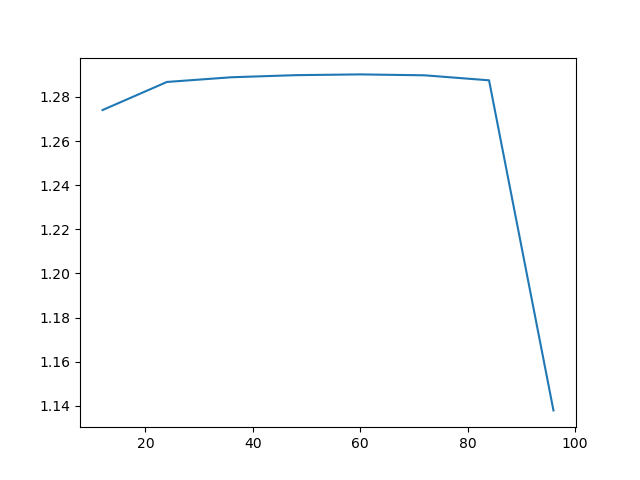

In [26]:
plt.figure()
plt.plot(ls, finals)

# Adaptive

			// action+ - action- ~ (-B1 + B2)(E(B1) - E(B2)) - (-B0 + B1)(E(B0) - E(B1))
			// ~ B0 E(B0) - B1 E(B0) - B0 E(B1) + B1 E(B1) - B1 E(B1) + B1 E(B2) + B2 E(B1) - B2 E(B2)
			// ~ B0 E(B0) - B2 E(B2) - B1 (E(B0) - E(B2)) - E(B1) (B0 - B2)

			// assume E(B) ~ E(B1) - (B - B1) c
			// ~ B0 E(B0) - B2 E(B2) - c B1 (B2 - B0) - E(B1) (B0 - B2)
			// ~ (c B1 - E(B1)) (B0 - B2) c + const

			// small change in B1:
			// change in action diff = 2 c dB1 (B0 - B2)


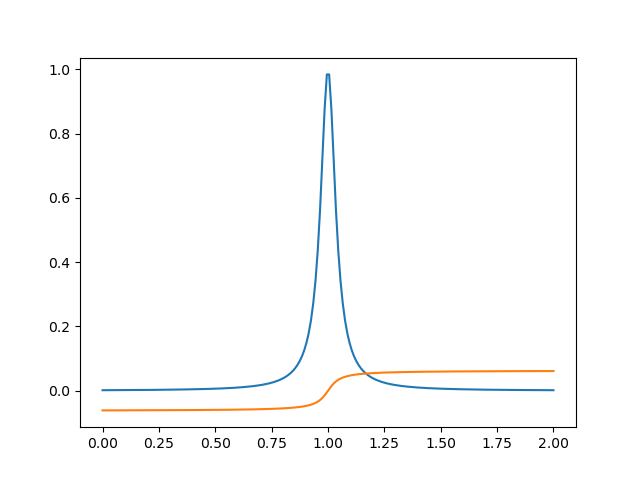

In [ ]:
def cv(T):
    return 1/(1+625*(T-1)**2.)
def E(T):
    return 1/25 * np.arctan(25*(T-1))

xs = np.linspace(0, 2, 200)
plt.figure()
plt.plot(xs, cv(xs))
plt.plot(xs, E(xs))

IntSlider(value=0)

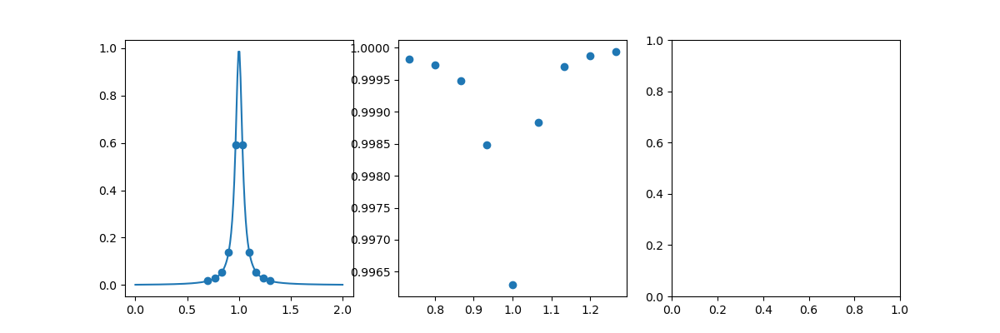

In [ ]:
from IPython.display import display
import ipywidgets as widgets

fig, ax = plt.subplots(1, 3, figsize=[12, 4])
init_positions = np.linspace(0.7, 1.3, 10)
positions = init_positions.copy()

scatter = ax[0].scatter(positions, cv(positions))
ax[0].plot(xs, cv(xs))

positions_list = []
actions_list = []

for i in range(100):
    actions = []
    for j in range(len(positions) - 1):
        actions.append((1/positions[j+1] - 1/positions[j]) * (E(positions[j]) - E(positions[j+1])))
    actions = np.array(actions)

    # differences = actions[1:] - actions[:-1]
    # dBs = -differences / (1/positions[:-2] - 1/positions[2:]) * 0.5
    # positions[1:-1] = 1/(1/positions[1:-1] + dBs)
    # positions[1:-1] = positions[1:-1] + differences * 10

    acceptance_ratios = np.minimum(1, np.exp(-actions))
    positions[1:-1] = positions[1:-1] - np.tanh(acceptance_ratios[1:] / acceptance_ratios[:-1]) * (positions[2:] - positions[:-2]) * 0.5

    positions_list.append(positions.copy())
    actions_list.append(acceptance_ratios.copy())

    # dBs = []
    # for j in range(1, len(positions) - 1):
    #     difference = actions[j] - actions[j-1]
    #     dB = -difference / (1/positions[j-1] - 1/positions[j+1]) * 0.5
    #     dBs.append(dB)
    #     new_positions[j] = 1/(1/positions[j] + dB)
    
scatter2 = ax[1].scatter((init_positions[1:]+init_positions[:-1])/2, actions_list[0])

w = widgets.IntSlider()
def on_value_change(change):
    i = change['new']
    scatter.set_offsets(np.stack((positions_list[i], cv(positions_list[i])), axis=1))
    scatter2.set_offsets(np.stack(((positions[1:]+positions[:-1])/2, actions_list[i]), axis=1))

w.observe(on_value_change, names='value')
display(w)

In [ ]:
print(positions)

## Fit to decoupled

In [ ]:
ts1, ds1 = get_all_cvs("new-data/vsweeps/0/84*/energy.dat")

NameError: name 'ts1' is not defined

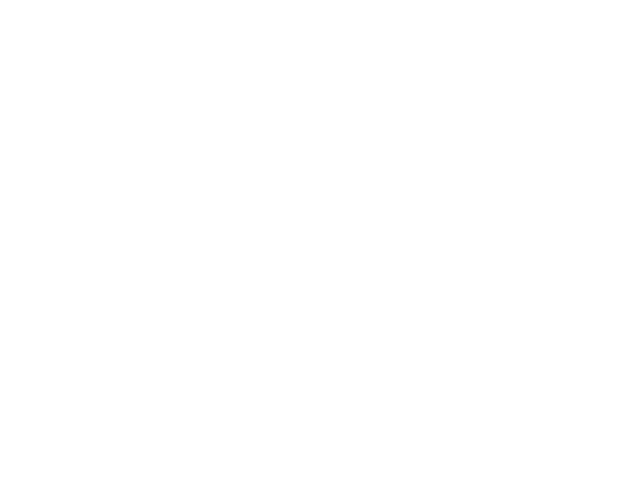

In [48]:
def cv(t, u, c, mu):
    mu = mu * u
    N = 6
    nZ = np.zeros_like(t)
    dnZ = np.zeros_like(t)

    Z = np.zeros_like(t)
    dZ = np.zeros_like(t)

    for n in range(N):
        nZ += n * np.exp(-1/t*(u*n*(n-1)/2 + mu*n))
        dnZ += n/t**2 * (n*mu + n*(n-1)*u/2) * np.exp(-1/t*(u*n*(n-1)/2 + mu*n))

        Z += np.exp(-1/t*(u*n*(n-1)/2 + mu*n))
        dZ += 1/t**2 * (n*mu + n*(n-1)*u/2) * np.exp(-1/t*(u*n*(n-1)/2 + mu*n))

    return c * (dnZ * Z - nZ * dZ) / Z**2

plt.figure()

import scipy
fit_region = ts1 < 1
popt, pcov = scipy.optimize.curve_fit(cv, ts1[fit_region], ds1[fit_region], p0=[1, 2, 0.3])

plt.plot(ts1, ds1, label="Simulation J4=0")
xs = np.linspace(0.01, 1, 100)
plt.plot(xs, cv(xs, *popt), label="Fit U=3.01 mu=0.17 N=1.75")
plt.title(r"Fit to $Z=\left(\sum_{n=0}^6 \frac{U}{2}n(n-1) + \mu n \right)^N$")
plt.legend()
# plt.xscale("log")
plt.xlim([0, 1])
print(popt)
print(pcov)

# DIpslay

[(2, 0, 1), (0, 1, 0), (4, 1, 0), (1, 2, 0), (2, 2, 1), (4, 2, 1), (5, 3, 1), (1, 4, 0), (3, 4, 0), (1, 5, 1), (4, 5, 0), (5, 5, 1)]


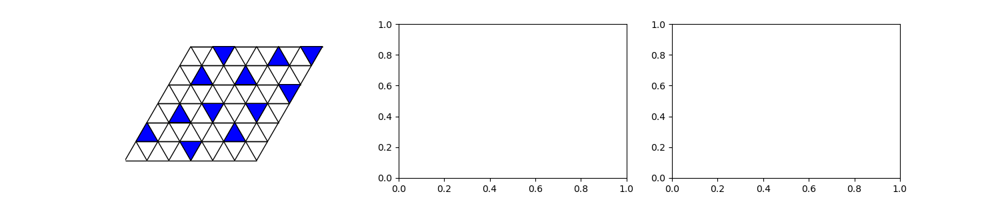

In [9]:
pos0 = parse_positions("(2,0,1) (0,1,0) (4,1,0) (1,2,0) (2,2,1) (4,2,1) (5,3,1) (1,4,0) (3,4,0) (1,5,1) (4,5,0) (5,5,1)")
print(pos0)

pocket.width = 6
pocket.height = 6
fig, ax = plt.subplots(1, 3, figsize=[15, 3])
pocket.draw_hexalattice(ax[0])
pocket.show_tiling(ax[0], (pos0, None), wf="tri")

1058
1060
1059


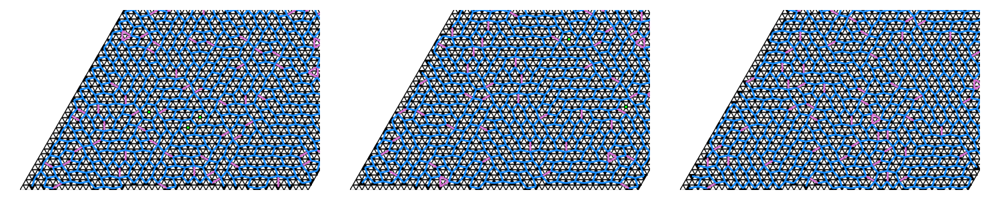

In [10]:
# pos0 = read_positions("new-data/vsweeps/rough/-0.1/bw/48x48_r-0_t0.040000_j-0.100_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/rough/-0.1/bw/48x48_r-0_t0.100000_j-0.100_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/hsweeps/0.1/48x48_r-0_t0.100000_j-0.010_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/pt/0.2/48/1/48x48_r-0_t0.247859_j0.200_10000000.15_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/binder/0.2d/60x60_r-0_t0.247817_j0.200_30000000.15_0/positions.dat")
# pos0 = read_positions("new-data/t0j0/108x108_r-3_t0.000000_j0.000_200000000.20_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/single/1/72x72_r-0_t0.320000_j1.000_20000000.20_0/positions.dat")

# pos0 = read_positions("new-data/vsweeps/single/10/72x72_r-0_t0.338000_j10.000_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/single/0.2/48x48_r-0_t0.400000_j0.200_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/rough/0.01/rand/48x48_r-0_t0.020000_j0.010_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/rough/0.01/rt3/48x48_r-0_t0.100000_j0.010_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/rough/-0.1/rand/48x48_r-0_t0.030000_j-0.100_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/dsweeps/1.48/rand/48x48_r-48_t3.200000_uinf_j1.000_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/dsweeps/1.6/rand/48x48_r-384_t0.400000_uinf_j1.000_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/dsweeps/0/rand/48x48_r-0_t3.000000_uinf_j1.000_20000000.20_0/positions.dat")

# pos0 = read_positions("new-data/vsweeps/binder/0.6b/96x96_r-0_t0.329000_j0.600_20000000.15_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/single/1/72x72_r-0_t0.350000_j1.000_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/measure-k/0/96x96_r-0_t1.000000_uinf_j0.000_20000000.20_0/positions.dat")

# pos0 = read_positions("new-data/temp/0.6t/48x48_r-0_t0.320000_j0.600_40000000.15_3/positions.dat")
# pos0 = read_positions("new-data/vsweeps/binder/0.6c/48x48_r-0_t0.321000_j0.600_40000000.15_0/positions.dat")
# pos0 = read_positions("new-data/infinite-u/1/72x72_r-3_t5.000000_uinf_j1.000_50000000.10_0/positions.dat")

# pos0 = read_positions("new-data/temp/72x72_r-3_t0.000000_uinf_j1.000_50000000.20_3/positions.dat")
# pos0 = read_positions("new-data/temp/72x72_r-3_t1000.000000_uinf_j1.000_50000000.20_0/positions.dat")

# pos0 = read_positions("new-data/infinite-u/pt/48x48_r-3_t0.700000_uinf_j-1.000_40000000.20_0/positions.dat")
pos0 = read_positions("new-data/temp/pt/48x48_r-3_t0.000100_uinf_j-1.000_50000000.10_0/positions.dat")
# pos0 = read_positions("new-data/temp/48x48_r-3_t0.100000_j-1.000_1000000.10_0/positions.dat")
# pos0 = read_positions("new-data/temp/pt2/48x48_r-3_t0.100000_j-1.000_50000000.10_0/positions.dat")

fig, ax = plt.subplots(1, 3, figsize=[15, 3])

type = "j4"
show_positions(ax[0], pos0[len(pos0)//3], type, show_monomers=True)
show_positions(ax[1], pos0[len(pos0)//2], type, show_monomers=True)
show_positions(ax[2], pos0[-1], type)
plt.tight_layout()
# show_positions(ax[0], ((0, 0, 0), (25, 25, 0)), "none")

0
0
0


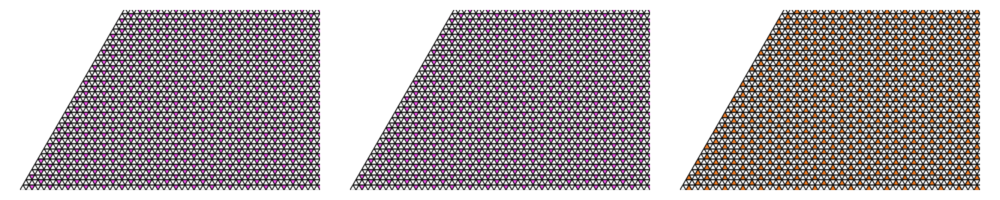

In [8]:
# pos0 = read_positions("new-data/vsweeps/rough/-0.1/bw/48x48_r-0_t0.040000_j-0.100_20000000.20_0/positions.dat")
# pos0 = read_positions("data/idealbw/60x60_r-3_uinf_4j0.00_1000.1_0/positions.dat")
# pos0 = read_positions("new-data/vsweeps/rough/0.01a/rand/48x48_r-0_t0.010000_j0.010_20000000.20_0/positions.dat")
pos0 = read_positions("data/idealrt3/60x60_r-0_t0.000000_j0.000_10.1_0/positions.dat")

fig, ax = plt.subplots(1, 3, figsize=[15, 3])

type = "domain"
show_positions(ax[0], pos0[len(pos0)//3], type, show_monomers=True)
show_positions(ax[1], pos0[len(pos0)//2], type, show_monomers=True)
show_positions(ax[2], pos0[-1], type)
plt.tight_layout()
# show_positions(ax[0], ((0, 0, 0), (25, 25, 0)), "none")

957
962
957


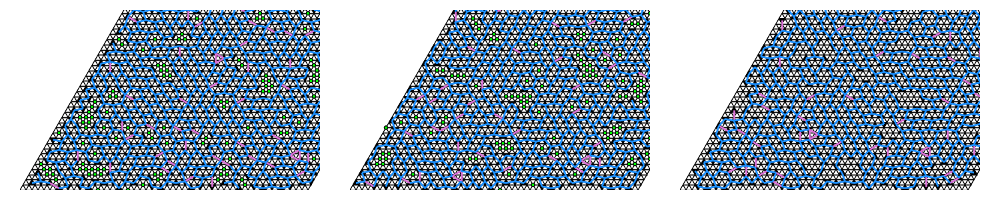

In [40]:
# pos0 = read_positions("new-data/openbc/0.01p/48x48_r-144_t0.010000_j0.010_20000000.20_0/positions.dat")
# pos0 = read_positions("new-data/openbc/0.01p/48x48_r-3_t0.010000_j0.010_20000000.20_0/positions.dat")
pos0 = read_positions("new-data/openbc/-0.1p/48x48_r-144_t0.010000_j-0.100_20000000.20_1/positions.dat")

fig, ax = plt.subplots(1, 3, figsize=[15, 3])

type = "j4"
show_positions(ax[0], pos0[len(pos0)//3], type, show_monomers=True)
show_positions(ax[1], pos0[len(pos0)//2], type, show_monomers=True)
show_positions(ax[2], pos0[-1], type)
plt.tight_layout()
# show_positions(ax[0], ((0, 0, 0), (25, 25, 0)), "none")

2
2
2


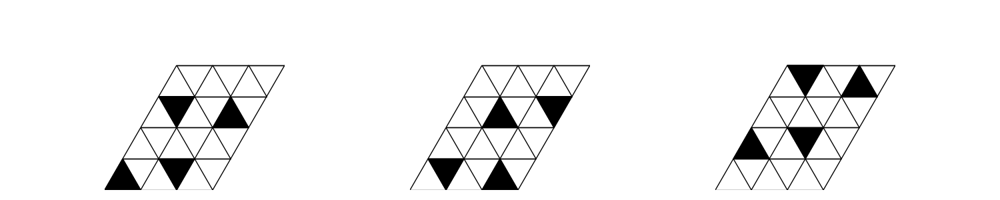

In [13]:
pos0 = read_positions("new-data/3x4pos.dat")

fig, ax = plt.subplots(1, 3, figsize=[15, 3])

type = "none"
show_positions(ax[0], pos0[1], type, height=4, width=3)
show_positions(ax[1], pos0[5], type, height=4, width=3)
show_positions(ax[2], pos0[10], type, height=4, width=3)
ax[0].set_xlim([0, 5])
ax[0].set_ylim([0, 5])
ax[1].set_xlim([0, 5])
ax[1].set_ylim([0, 5])
ax[2].set_xlim([0, 5])
ax[2].set_ylim([0, 5])
plt.tight_layout()
# show_positions(ax[0], ((0, 0, 0), (25, 25, 0)), "none")

11


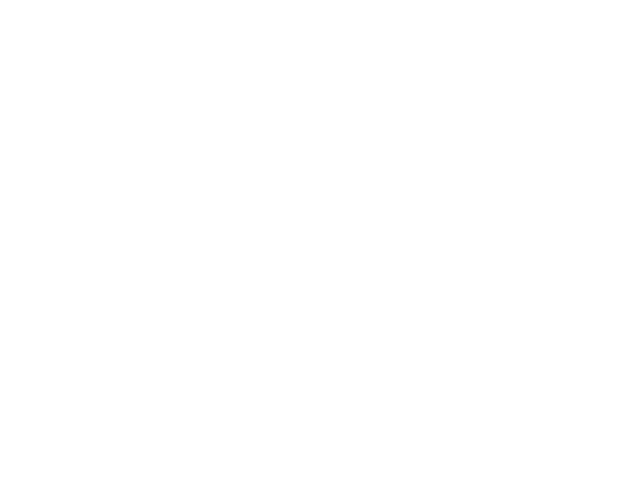

In [2]:
plt.figure()
# show_positions(plt.gca(), [(0, 1, 0), (1, 1, 1), (3, 1, 0), (4, 1, 1), (0, 3, 0), (1, 3, 1), (3, 3, 0), (4, 3, 1), (0, 5, 1), (2, 5, 0), (3, 5, 1), (5, 5, 0)], None)
show_positions(plt.gca(), [(5, 1, 1), (1, 1, 0), (2, 1, 1), (4, 1, 0), (5, 3, 1), (1, 3, 0), (2, 3, 1), (4, 3, 0), (0, 5, 0), (1, 5, 1), (3, 5, 0), (4, 5, 1)], None)

In [16]:
pos0 = read_positions("/home/kz345/tbg-charge-order/new-data/positions-example/24x24_r-0_t0.000000_j0.000_10000.1_0/positions.dat", skip=9050) 

235
239
239
239


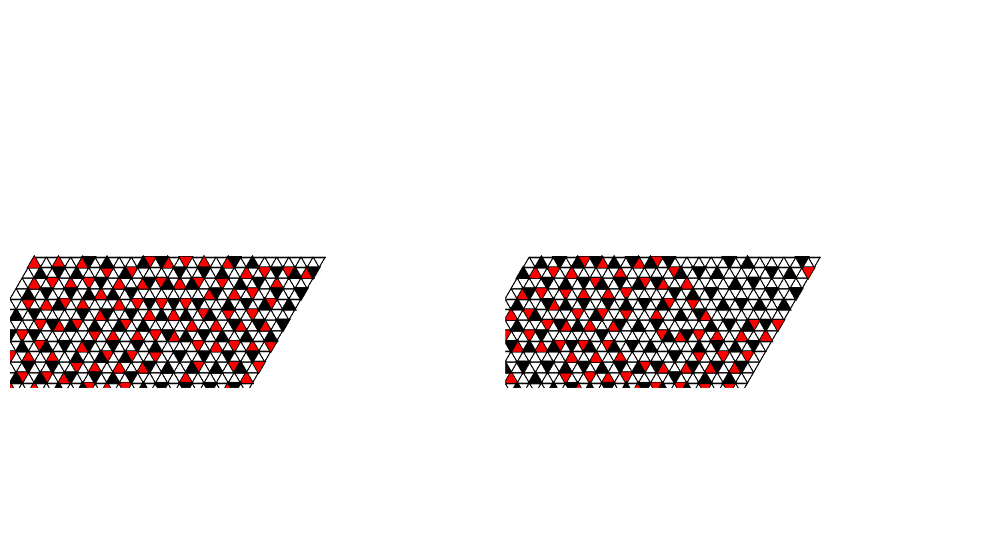

In [19]:
fig, ax = plt.subplots(1, 2, figsize=[15, 8])
type = "none"
show_positions(ax[0], pos0[0], type, color="red")
show_positions(ax[0], pos0[1], type)
show_positions(ax[1], pos0[1], type, color="red")
show_positions(ax[1], pos0[2], type)
plt.tight_layout()

KeyboardInterrupt: 

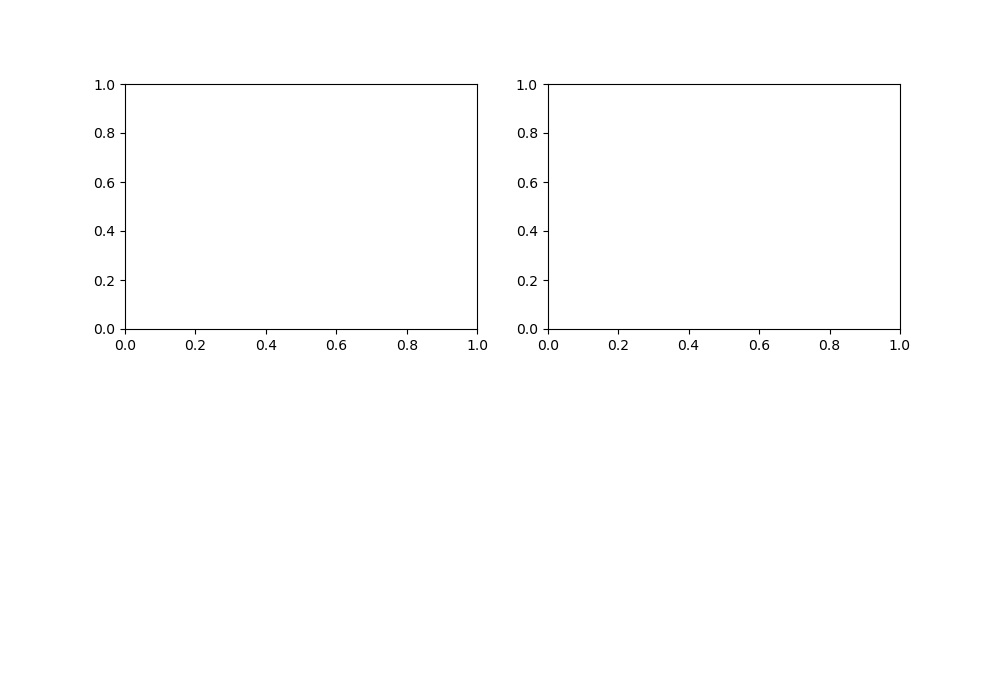

In [9]:
data = read_accumulator("new-data/vsweeps/single/1/72x72_r-0_t0.350000_j1.000_20000000.20_0/tri-tri.dat")[0].reshape((72, 72, 2))
fig, ax = plt.subplots(2, 2, figsize=[10, 7])
plot2d_hex(ax[0,0], data)
plot_FT(ax[1, 0], FT_hex(data), proj="logabs")

data = read_accumulator("new-data/vsweeps/single/1/72x72_r-0_t0.500000_j1.000_20000000.20_0/tri-tri.dat")[0].reshape((72, 72, 2))
plot2d_hex(ax[0, 1], data)
plot_FT(ax[1, 1], FT_hex(data), proj="logabs")

## Multicanonical

In [2]:
def read_dos(fname):
    with open(fname) as f:
        line = f.readlines()[-1]
    
    vals = {}
    for token in line.strip().split(" "):
        if token != "":
            vals[int(token.split(",")[0])] = float(token.split(",")[1])
    
    m = np.amax(list(vals.values()))
    for key in vals.keys():
        vals[key] = max(0, vals[key] - m + 194)

    # make corrections
    vals[0] = np.log(6)

    vals[1152] = (48//2 + 1) * np.log(2)
    # for key in vals.keys():
    #     if key > 1100:
    #         vals[key] = max(vals[1152], vals[key])

    for j4 in range(48, 600):
        atot = (np.sqrt(3)/3 * 48)**2 * np.sqrt(3)/2
        ltot = j4/2
        nhex = ltot**2/atot * 3*np.sqrt(3)/18
        S = np.log(6) + nhex * (np.log(np.sqrt(2/3/np.sqrt(3))) + np.log(np.sqrt(atot/nhex)))
        if j4 in vals:
            vals[j4] = max(vals[j4], S)
        else:
            vals[j4] = S

    e = []
    dos = []
    for key, val in sorted(vals.items()):
        e.append(key)
        dos.append(val)

    return np.array(e), np.array(dos)

In [3]:
def read_pt_dos(fname):
    bounds = []
    hists = []
    doss = []

    counter = 0
    with open(fname) as f:
        for line in f:
            if counter == 0:
                counter = int(line.strip().split()[2])
                state = "bound"
                hists = []
                doss = []
            elif state == "bound":
                bounds.append(line.strip())
                state = "hist"
            elif state == "hist":
                hists.append(line.strip())
                state = "dos"
            else:
                state = "bound"
                doss.append(line.strip())
                counter -= 1

    chains = []
    for bound, hist, dos in zip(bounds, hists, doss):
        bound = list(map(int, bound.split()))
        hist_dict = {}
        dos_dict = {}

        vals = {}
        for pair in hist.split():
            hist_dict[int(pair.split(",")[0])] = int(pair.split(",")[1])
        for pair in dos.split():
            dos_dict[int(pair.split(",")[0])] = float(pair.split(",")[1])
        
        for key, val in hist_dict.items():
            if bound[0] <= key <= bound[1]:
                vals[key] = (val, dos_dict[key])

        e = []
        dos = []
        hist = []
        for key, val in sorted(vals.items()):
            e.append(key)
            hist.append(val[0])
            dos.append(val[1])
        chains.append((np.array(e), np.array(hist), np.array(dos)))
    return chains


In [6]:
def merge_chains(chains):
    events = sorted([(np.amin(c[0]), 0, i) for i, c in enumerate(chains)] + [(np.amax(c[0]), 1, i) for i, c in enumerate(chains)])
    active = []
    constraints = []
    for i in range(len(events)-1):
        bmin = events[i][0]+5
        bmax = events[i+1][0]-5

        if events[i][1] == 0:
            active.append(events[i][2])
        if events[i][1] == 1:
            active.remove(events[i][2])

        constraint = []
        for a in active:
            e = chains[a][0]
            dos = chains[a][2]
            if np.sum((e>=bmin)*(e<=bmax)) < 5:
                continue
            constraint.append((a, np.mean(dos[(e>=bmin)*(e<=bmax)])))

        if len(constraint) < 2:
            continue

        constraints.append(constraint)

    def fun(x, constraints):
        loss = 0
        for constraint in constraints:
            vals = []
            for idx, mean in constraint:
                if idx == 0:
                    vals.append(mean)
                else:
                    vals.append(mean+x[idx-1])
            loss += np.var(vals)
        return loss
    
    res = scipy.optimize.minimize(fun, np.zeros((len(chains)-1,)), constraints)
    shifts = np.concatenate(([0], res.x))

    active = []
    all_e = np.array([], dtype=int)
    all_dos = np.array([], dtype=float)
    for i in range(len(events)-1):
        bmin = events[i][0]
        bmax = events[i+1][0]
        if events[i][1] == 0:
            active.append(events[i][2])
        if events[i][1] == 1:
            active.remove(events[i][2])
        
        if bmin==bmax: continue
        
        e = chains[active[0]][0]
        partials = [chains[active[0]][2][(e>=bmin)*(e<=bmax)] + shifts[active[0]]]
        e = e[(e>=bmin)*(e<=bmax)]
        for a in active[1:]:
            vals = []
            for ei in e:
                idx = np.searchsorted(chains[a][0], ei)
                if chains[a][0][idx] == ei:
                    vals.append(chains[a][2][idx] + shifts[a])
                else:
                    vals.append(np.nan)
            partials.append(vals)
        all_e = np.concatenate((all_e, e[(e>=bmin)*(e<=bmax)]))
        all_dos = np.concatenate((all_dos, np.nanmean(partials, axis=0)))
    return all_e, all_dos

197.63897300742823


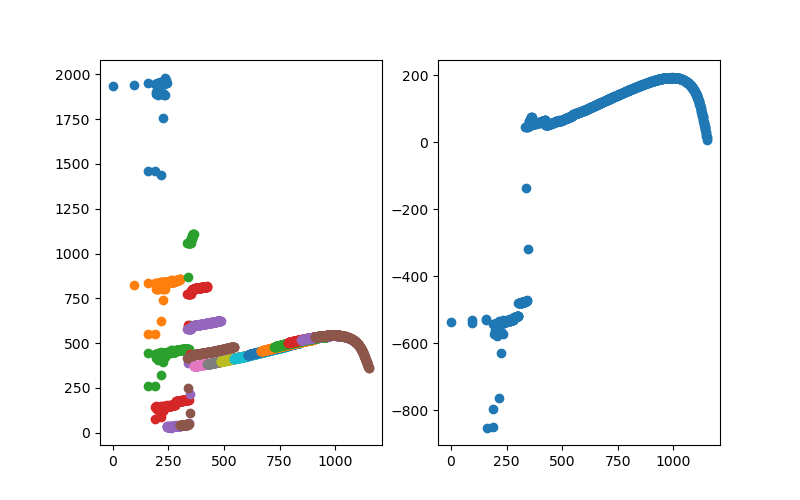

In [39]:
# def breathing(e, l):
#     atot = (np.sqrt(3)/3 * l)**2 * np.sqrt(3)/2
#     ltot = e/2
#     nhex = ltot**2/atot * 3*np.sqrt(3)/18
#     S = np.log(6) + nhex * (np.log(np.sqrt(2/3/np.sqrt(3))) + np.log(np.sqrt(atot/nhex)))
#     return S

# chains = read_pt_dos("new-data/multitest/48x48_r-0_20000000.10_16/log-dos.dat")
chains = read_pt_dos("new-data/muca/48x48_r-0_20000000.20_0/log-dos.dat")
# chains = read_pt_dos("new-data/multitest/36x36_r-0_10000000.10_0/log-dos.dat")
fig, ax = plt.subplots(1, 2, figsize=[8, 5])

e, dos = merge_chains(chains)
# dos = dos - np.amax(dos[e>500]) + 108
dos = dos - np.amax(dos[e>500]) + 194
# dos[(e>0)*(e<=380)] = breathing(e[(e>0)*(e<=380)], 48)
# dos[(e>0)*(e<=380)] = 0
# dos[(e>0)*(e<=280)] = breathing(e[(e>0)*(e<=280)], 36)
# dos[e==0] = np.log(6)
# dos[e==1152] = 24*np.log(2)

# dos[e==0] = np.log(6)
# dos[e>0] = breathing(e[e>0], 48)
# dos[(e>0)*(e<500)] = breathing(e[(e>0)*(e<500)], 48)

ax[1].scatter(e, dos)
print(np.log(np.sum(np.exp(dos))))

for ei, histi, dosi in chains:
    ax[0].scatter(ei, dosi)
# x = np.linspace(0, 1140, 1000)
# ax[1].plot(x, 194*np.sin((x/1140)**5*np.pi)**(0.5))

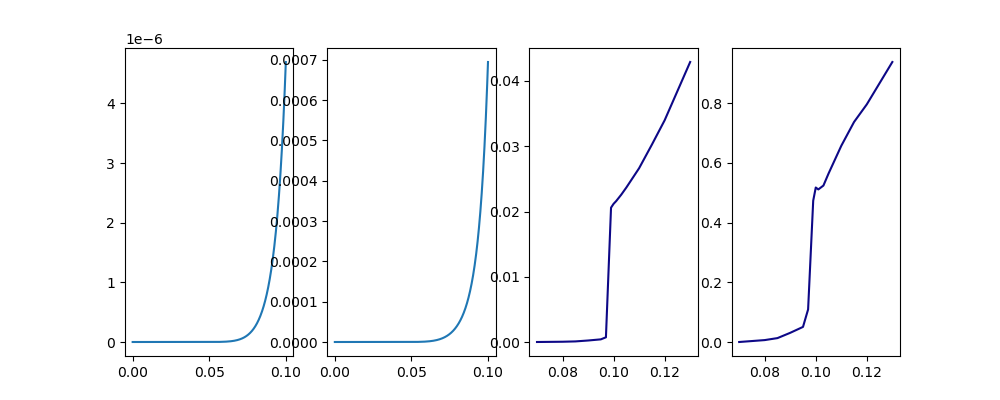

In [36]:
J = 0.01

# e = np.linspace(0, 1152, 1153)
# dos = 194*np.sin((e/1152)**5*np.pi)**(0.5)
# dos[e>1100] = 24*np.log(2)

ts = np.linspace(0.0001, 0.1, 1000)
ys = []
cvs = []
for T in ts:
    shift = np.amax(-e * J / T + dos)
    energy = np.sum(J * e * np.exp(-e * J / T + dos - shift)) / np.sum(np.exp(-e * J / T + dos - shift))
    energy2 = np.sum(J*J * e*e * np.exp(-e * J / T + dos - shift)) / np.sum(np.exp(-e * J / T + dos - shift))
    ys.append(energy)
    cvs.append((energy2 - energy**2)/T**2)

ys = np.array(ys)
cvs = np.array(cvs)

fig, ax = plt.subplots(1, 4, figsize=[10, 4])
ax[0].plot(ts, ys/48/48*3)
ax[1].plot(ts, cvs/48/48*3)

skip=500000
Ls = [48]
colors = [matplotlib.colormaps["plasma"](x) for x in np.linspace(0, 1, 5)]
colormap = {Ls[i]: colors[i] for i in range(len(Ls))}

for l in Ls:
    for init in ["rt3"]:
        ls = "--" if init == "rand" else None
        ts2, ds2 = get_all_energies(f"new-data/vsweeps/rough/0.01/{init}/{l}*/energy.dat", skip=skip)
        ax[2].plot(ts2, ds2, label=init+str(l), ls=ls, color=colormap[l])
        ts2, ds2 = get_all_cvs(f"new-data/vsweeps/rough/0.01/{init}/{l}*/energy.dat", skip=skip)
        ax[3].plot(ts2, ds2, label=init+str(l), ls=ls, color=colormap[l])

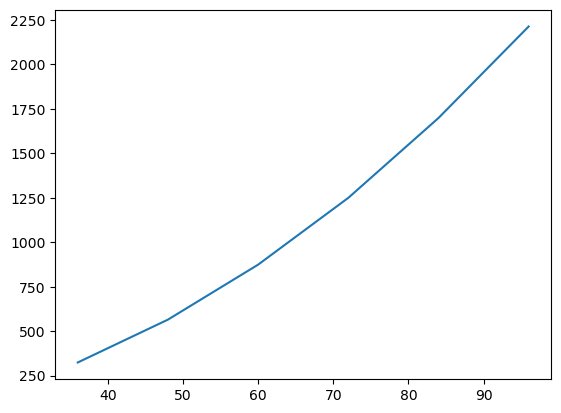

In [6]:
l = []
d = []
for i in range(36, 97, 12):
    data = read_accumulator(f"new-data/vsweeps/binder/0.6b/{i}x{i}_r-0_t0.323000_j0.600_20000000.15_0/order.dat")[0]
    d.append(data[3])
    l.append(i)
plt.plot(l, d)

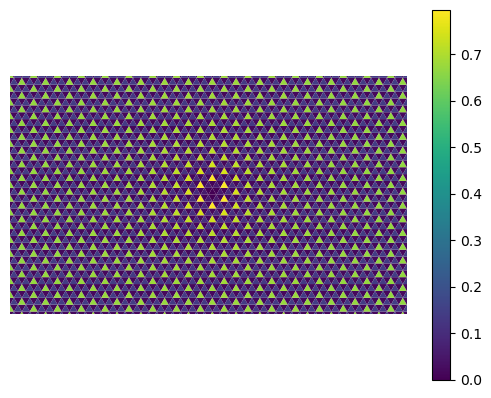

In [9]:
i = 96
data = read_accumulator(f"new-data/vsweeps/binder/0.6b/{i}x{i}_r-0_t0.323000_j0.600_20000000.15_0/tri-tri.dat")[0].reshape((96, 96, 2))
fig, ax = plt.subplots(1, 1)
plot2d_hex(ax, data)

# lorentzian SF fit

In [ ]:
data1 = read_accumulator("new-data/vsweeps/binder/0.2d/60x60_r-0_t0.246970_j0.200_30000000.15_0/tri-tri.dat")[0].reshape((60, 60, 2))
data2 = read_accumulator("new-data/vsweeps/binder/0.2d/84x84_r-0_t0.246987_j0.200_30000000.15_0/tri-tri.dat")[0].reshape((84, 84, 2))

ft1 = FT_hex(data1)
ft2 = FT_hex(data2)
fig, ax = plt.subplots(1, 2)
xs = np.linspace(0, 0.1, 100)
ys = []
ys2 = []
for x in xs:
    ys.append(np.real(ft1((4/3, x))))
    ys2.append(np.real(ft2((4/3, x))))

def fun(x, A, B):
    return A / (1 + (B * x)**2)

ax[0].plot(xs, ys)
param, _ = scipy.optimize.curve_fit(fun, xs, ys, p0=(250, 0.1))
ax[0].plot(xs, fun(xs, *param))

ax[1].plot(xs, ys2)
param, _ = scipy.optimize.curve_fit(fun, xs, ys2, p0=(350, 0.1))
ax[1].plot(xs, fun(xs, *param))

Text(0.5, 1.0, 'T=0 J=0 96x96')

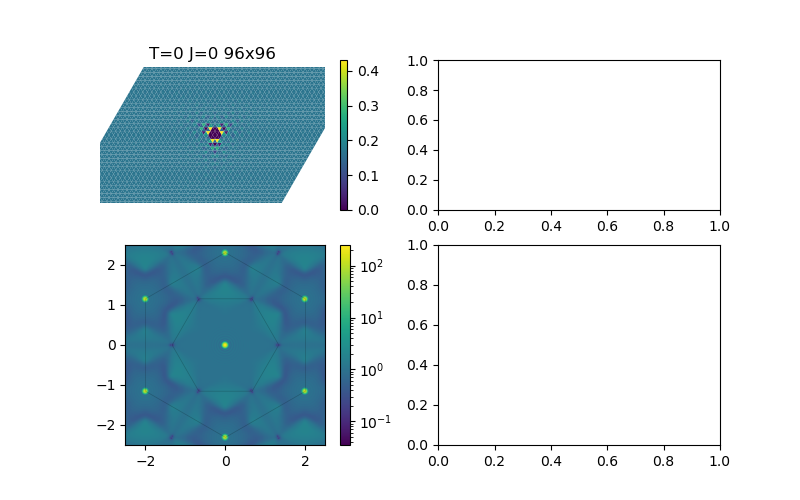

In [4]:
data1 = read_accumulator("new-data/t0j0-ergodic/48x48_r-0_t0.000000_j0.000_50000000.20_1/tri-tri.dat")[0].reshape((48, 48, 2))
fig, ax = plt.subplots(2, 2, figsize=[8, 5], height_ratios=[6, 8])
plot2d_hex(ax[0,0], data1)
plot_FT(ax[1,0], FT_hex(data1), proj="logabs")
ax[0,0].set_title("T=0 J=0 96x96")

# superfluid stiffness

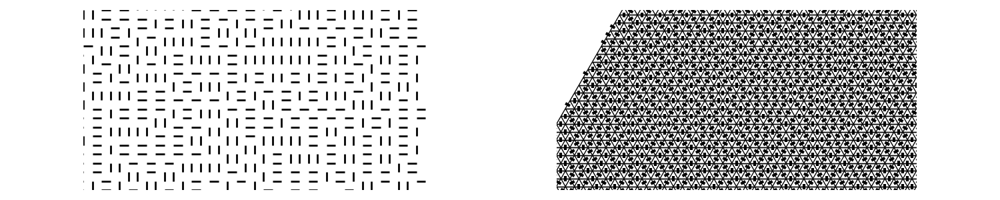

In [2]:
fig, ax = plt.subplots(1, 2, figsize=[15, 3])

pos0 = read_positions("new-data/dimers/48x48/positions.dat")
show_positions_dimer(ax[0], pos0[-1])

pos0 = read_positions("new-data/dimers-hex/48x48/positions.dat")
show_positions_dimer_hex(ax[1], pos0[-1])
plt.tight_layout()

In [13]:
# k = read_histogram_winding_dimer(f"new-data/dimers-hex/48x48/winding-histogram.dat")
k = read_histogram_winding_dimer(f"new-data/temp/dimerskew4/winding-histogram.dat")
a = k[10000:, 0]
b = k[10000:, 1]
print(np.mean((a+b)**2))
print(len(k))

3.2089070351758795
2000000


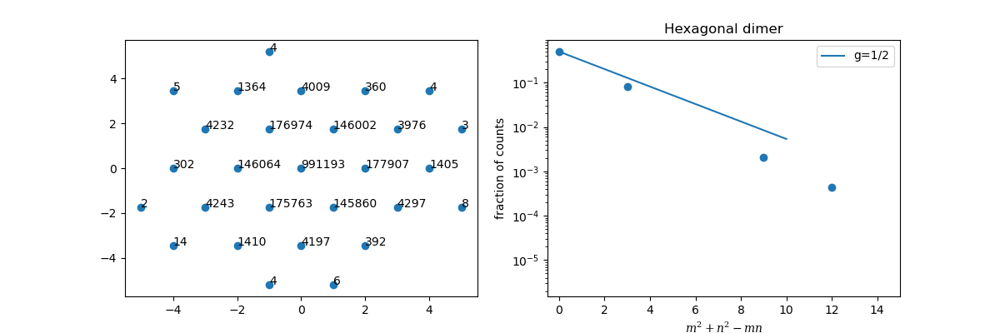

In [433]:
import collections
freq = collections.defaultdict(int)
for l in range(10000, k.shape[0]):
    freq[(k[l,0], k[l,1])] += 1

fig, ax = plt.subplots(1, 2, figsize=[12, 4])
radialfreq = collections.defaultdict(int)
radialcount = collections.defaultdict(int)

xs, ys = [], []
for key, v in freq.items():
    x, y = key
    if v > 1:
        xs.append(x)
        ys.append((2*y-x)/np.sqrt(3))
        # ys.append(2*np.sqrt(3)*y-x/np.sqrt(3))
        ax[0].text(xs[-1], ys[-1], v)

    r2 = x*x+y*y-x*y
    # r2 = x*x/9-3/9*x*y+y*y

    radialfreq[r2] += v
    radialcount[r2] += 1

ax[0].scatter(xs, ys)

xs, ys = [], []
for key, v in sorted(radialfreq.items(), key=lambda x: x[0]):
    xs.append(key)
    ys.append(v / radialcount[key] / len(k))
ax[1].scatter(xs, ys)
ax[1].set_yscale("log")
ax[1].set_xlim([-0.5, 15])
ax[1].set_xlabel("$m^2+n^2-mn$")
ax[1].set_ylabel("fraction of counts")
ax[1].set_title("Hexagonal dimer")

geometrical_factor = np.sqrt(3)/2
geometrical_factor = np.sqrt(3)/6
geometrical_factor = np.sqrt(3)*2

x = np.linspace(0, 10, 100)
ax[1].plot(x, np.exp(-x * np.pi / 2 / geometrical_factor) * 0.5, label="g=1/2")
ax[1].legend()

In [444]:
N=10000
# e, k = read_histogram_sector(f"new-data/measure-k/0/48x48_r-0_t1.000000_uinf_j0.000_50000000.10_0/winding-histogram.dat")
# e, k = read_histogram_sector(f"new-data/temp/trimerskew54/54x18_r-0_t0.000000_j0.000_2000000.1_4/winding-histogram.dat")
e, k = read_histogram_sector(f"new-data/temp/48x24_r-0_t0.000000_j0.000_2000000.1_0/winding-histogram.dat")
print((k[N:, 0]**2).mean(), ((k[N:, 0] + k[N:, 1])**2).mean())
# print(((k[N:, 0]-k[N:, 2])**2).mean(), ((k[N:, 0]-k[N:, 2] + k[N:, 1]-k[N:, 3])**2).mean())
# e, k = read_histogram_sector(f"new-data/temp/54x18_r-0_t1.000000_uinf_j0.000_50000000.1_1/winding-histogram.dat")
# print((k[N:, 0]**2).mean(), ((k[N:, 0] + k[N:, 1])**2).mean())
# print(((k[N:, 0]-k[N:, 2])**2).mean(), ((k[N:, 0]-k[N:, 2] + k[N:, 1]-k[N:, 3])**2).mean())
# e, k = read_histogram_sector(f"new-data/temp/48x16_r-0_t1.000000_uinf_j0.000_50000000.1_0/winding-histogram.dat")
# print((k[N:, 0]**2).mean(), ((k[N:, 0] + k[N:, 1])**2).mean())
# print(((k[N:, 0]-k[N:, 2])**2).mean(), ((k[N:, 0]-k[N:, 2] + k[N:, 1]-k[N:, 3])**2).mean())

1.7455299506360358 3.9992500474653503


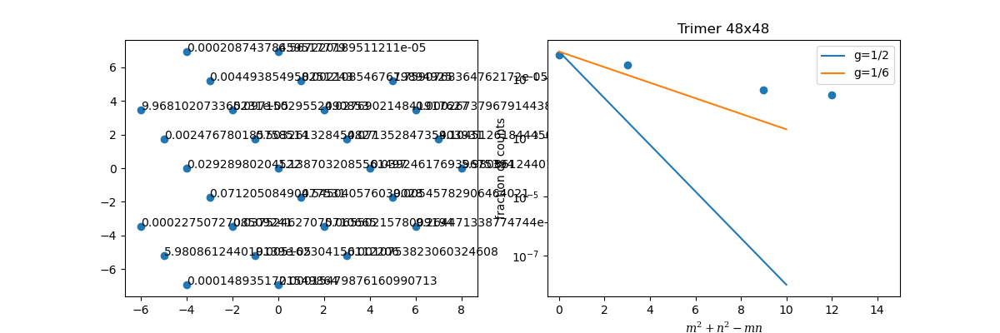

In [445]:
import collections
freq = collections.defaultdict(int)
avgfreq = collections.defaultdict(int)
for l in range(100000, k.shape[0]):
    freq[(k[l,0], k[l,1], k[l,2], k[l,3])] += 1
    avgfreq[(k[l,0], k[l, 1])] += 1
    avgfreq[(k[l,2], k[l, 3])] += 1
    avgfreq[(-k[l,0]-k[l,2], -k[l, 1]-k[l,3])] += 1

fig, ax = plt.subplots(1, 2, figsize=[12, 4])
radialfreq = collections.defaultdict(int)
radialcount = collections.defaultdict(int)

xs, ys = [], []
for key, v in avgfreq.items():
    x, y = key
    x = 

    if v > 1:
        xs.append(x)
        ys.append((2*y-x)/np.sqrt(3))
        ax[0].text(xs[-1], ys[-1], v / k.shape[0])

    radialfreq[x*x+y*y-x*y] += v
    radialcount[x*x+y*y-x*y] += 1

ax[0].scatter(xs, ys)

total = sum(v / radialcount[k] for k, v in radialfreq.items())

xs, ys = [], []
for key, v in sorted(radialfreq.items(), key=lambda x: x[0]):
    xs.append(key)
    ys.append(v / radialcount[key] / total)
ax[1].scatter(xs, ys)
ax[1].set_yscale("log")
ax[1].set_xlim([-0.5, 15])
ax[1].set_xlabel("$m^2+n^2-mn$")
ax[1].set_ylabel("fraction of counts")
ax[1].set_title("Trimer 48x48")

x = np.linspace(0, 10, 100)
ax[1].plot(x, np.exp(-x * np.pi * 0.5 / (np.sqrt(3)/2)) * 0.8, label="g=1/2")
ax[1].plot(x, np.exp(-x * np.pi * 0.5 / 3 / (np.sqrt(3)/2)) * 0.8, label="g=1/6")
plt.legend()

In [70]:
for l in range(120, 121, 12):
    k = read_histogram_winding_dimer(f"new-data/dimers/{l}x{l}/winding-histogram.dat")
    print(k[100000:, 0].std()**2, k[100000:, 1].std()**2)

0.30398200957461763 0.3034606493144086


In [71]:
import collections
freq = collections.defaultdict(int)
for l in range(k.shape[0]):
    freq[(k[l,0], k[l,1])] += 1

radialfreq = collections.defaultdict(int)
radialcount = collections.defaultdict(int)

xs, ys = [], []
for key, v in freq.items():
    x, y = key
    radialfreq[x*x+y*y] += v
    radialcount[x*x+y*y] += 1

In [237]:
def partfun(m, n, t, k):
    return np.exp(-(m**2*np.abs(t)**2+n**2-2*np.real(t)*m*n) * k / np.imag(t))

12433731.25
0.30342593379872007


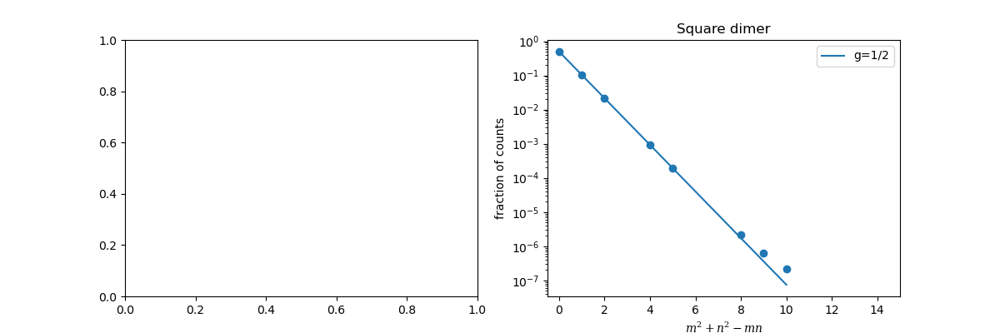

In [77]:
fig, ax = plt.subplots(1, 2, figsize=[12, 4])

total = sum(v / radialcount[k] for k, v in radialfreq.items())
print(total)

xs, ys = [], []
for key, v in sorted(radialfreq.items(), key=lambda x: x[0]):
    xs.append(key)
    ys.append(v / radialcount[key] / k.shape[0])
ax[1].scatter(xs, ys)
ax[1].set_yscale("log")
ax[1].set_xlim([-0.5, 15])
ax[1].set_xlabel("$m^2+n^2$")
ax[1].set_ylabel("fraction of counts")
ax[1].set_title("Square dimer")

# dimer
total, val = 0, 0
for i in range(-50, 51):
    for j in range(-50, 51):
        part = partfun(i, j, 1j, np.pi/2)
        total += part
        val += i**2 * part
print(val / total)

x = np.linspace(0, 10, 100)
ax[1].plot(x, np.exp(-x * np.pi / 2) / total, label="g=1/2")
ax[1].legend()

In [357]:
total = 0
val = 0
val2 = 0
tau = 0.5+0.5j*np.sqrt(3)

k = np.pi / 2

for ri in range(-20, 21):
    for rj in range(-20, 21):
        factor = partfun(ri, rj, tau, k)
        total += factor
        val += ri**2 * factor
        val2 += (ri + rj)**2 * factor
print(val / total, val2 / total)

0.35629640871153867 1.0688892261346163


In [435]:
total = 0
val = 0
val2 = 0
# tau = 0.5+0.5j*np.sqrt(3)
tau = (0.5+0.5j*np.sqrt(3))/3

k = np.pi * 1 / 2
# k = np.pi * 0.46
# k = np.pi * 0.46 / 3

for ri in range(-20, 21):
    for rj in range(-20, 21):
        factor = partfun(ri, rj, tau, k)
        total += factor
        val += ri**2 * factor
        val2 += (ri + rj)**2 * factor
print(val / total, val2 / total)

0.9005109954801899 1.031216345596691


## worms + topo

In [10]:
def read_histogram2(fname, skip=0):
    with open(fname, mode="rb") as f:
        f.seek(0, 2)
        fsize = f.tell()
        f.seek(skip*4, 0)
        buf = f.read(fsize - skip*4)
        entries = len(buf) // 4

        w = np.ndarray((entries), dtype=np.single, buffer=buf, strides=(4,), offset=0).astype(np.double)
        return w

def read_histogram3(fname, skip=0):
    with open(fname, mode="rb") as f:
        f.seek(0, 2)
        fsize = f.tell()
        f.seek(skip*8, 0)
        buf = f.read(fsize - skip*8)
        entries = len(buf) // 8

        w = np.ndarray((entries,4), dtype=np.short, buffer=buf, strides=(8,2), offset=0).astype(np.double)
        return w

1.1840635544026412
1.1801792711243333


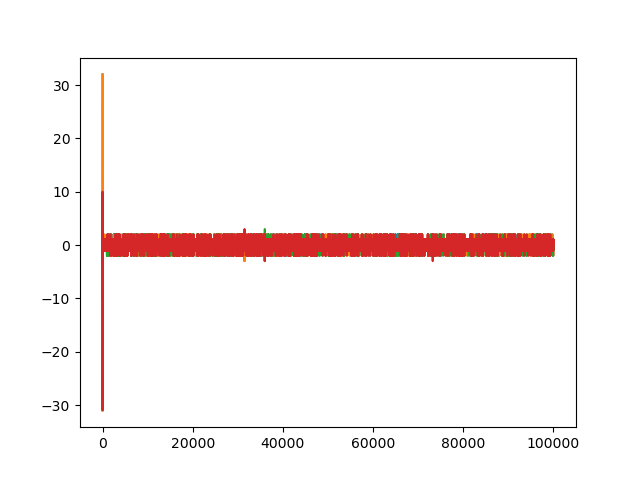

In [14]:
l = "96"
f = 0.4
d = read_histogram3(f"new-data/worm-timing/{l}_{f}_topohist.dat")
plt.figure()
plt.plot(d[:100000])

n = d[100000:1000000, 0]
m = d[100000:1000000, 1]

# import collections
# occurrences = collections.defaultdict(int)
# for ni, nm in zip(n, m):
#     occurrences[(int(ni), int(nm))] += 1
# for k, v in sorted(occurrences.items(), key=lambda x: x[1]):
#     print(k, v / len(n))

print(((m+n)**2).mean())
print(((2*m-n)**2).mean())

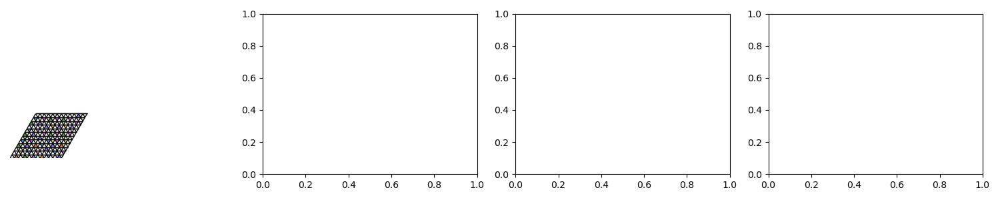

In [65]:
pos = read_positions("new-data/exact-sectors-12x12/-1_0_0_0.dat", take=1000)
fig, ax = plt.subplots(1, 4, figsize=[15, 3])

show_positions(ax[0], pos[0], "domain", length=12)
plt.tight_layout()

In [62]:
pos = read_positions("new-data/exact-sectors-12x12/-4_0_0_-4.dat", take=1000)
pos2 = read_positions("new-data/exact-sectors-12x12/-4_0_1_-2.dat", take=1000)
pos3 = read_positions("new-data/exact-sectors-12x12/-4_0_2_0.dat", take=1000)

('R', 1, -2) ('B', 1, 1) ('G', -2, 1) ('R', 1, -2) ('B', 1, 1) ('G', -2, 1) ('B', 1, 1) ('G', -2, 1) ('B', 1, 1) ('G', -2, 1) ('R', 1, -2) ('R', 1, -2)
('R', 1, -2) ('B', 5, 2) ('G', -7, 2) ('R', 1, -2) ('R', 1, -2) ('R', -1, 2)
('R', 1, -2) ('B', 1, 0) ('G', -1, 0) ('R', -1, 2) ('G', -1, 0) ('R', 1, -2) ('R', -1, 2) ('B', 1, 0) ('G', -1, 0) ('B', 1, 0) ('G', -1, 0) ('B', 1, 0) ('G', -1, 0) ('B', 1, 0) ('G', -1, 0) ('B', 1, 0)
('R', 1, -2) ('B', 1, 0) ('G', -1, 0) ('R', 1, -2) ('G', -1, 0) ('R', -1, 2) ('B', 1, 0) ('R', -1, 2) ('B', 1, 0) ('G', -1, 0) ('B', 1, 0) ('G', -1, 0) ('G', -1, 0) ('B', 1, 0) ('B', 1, 0) ('G', -1, 0)


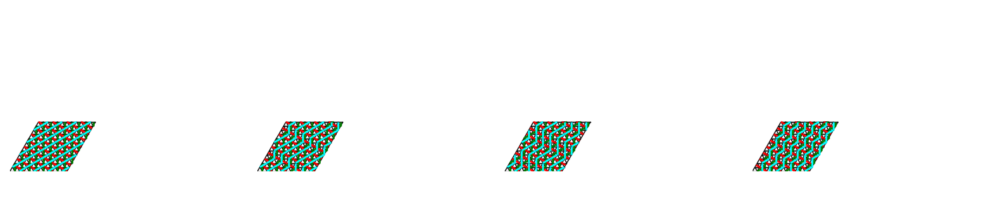

In [63]:
fig, ax = plt.subplots(1, 4, figsize=[15, 3])

type = "domains"
show_positions(ax[0], pos[0], "worm", length=12)
show_positions(ax[1], pos2[0], "worm", length=12)
show_positions(ax[2], pos3[0], "worm", length=12)
show_positions(ax[3], pos3[1], "worm", length=12)
plt.tight_layout()

In [137]:
mc_hist = {(0,-4,-4,0):1, (-1,-3,4,4):4, (1,-2,3,2):4, (2,3,0,-4):4, (-2,1,2,3):4, (0,-4,4,4):1, (-1,-1,-2,-2):36, (2,2,-2,-2):90, (-4,0,2,0):6, (-3,-1,-1,-3):4, (4,4,-3,-1):4, (3,2,-4,0):4, (-3,-1,4,4):4, (2,0,2,0):6, (0,0,2,0):90, (-4,0,3,2):4, (0,-2,0,2):90, (1,0,2,0):36, (-3,0,2,0):36, (2,0,1,0):36, (2,2,-1,-1):15348, (0,-2,0,1):15348, (0,-2,-2,0):2592, (2,2,-1,0):2304, (1,1,0,0):104232, (-1,0,1,0):104232, (0,0,-2,-2):90, (1,0,0,0):104232, (3,3,-2,-2):36, (0,-1,-2,-1):2304, (0,1,0,-1):104232, (0,0,2,2):90, (0,0,0,1):104232, (0,-1,0,0):104232, (0,1,0,0):104232, (0,0,1,0):104232, (-2,0,0,0):90, (-2,0,2,0):90, (-1,0,1,2):2304, (0,-4,-2,1):4, (0,-3,0,1):36, (0,-2,1,1):2304, (-1,-1,-1,-1):15348, (-3,0,1,0):36, (-2,-2,-2,-2):6, (2,2,0,-1):2304, (1,-2,-4,0):4, (1,-1,0,0):420, (-1,-2,2,2):2304, (0,2,0,0):90, (-2,-1,2,2):2304, (1,0,1,0):15348, (2,1,0,-1):2304, (2,2,0,-2):2592, (0,0,0,0):627372, (0,-1,0,1):104232, (0,0,-1,-2):420, (0,2,0,-2):90, (-2,0,0,-1):2304, (1,-1,1,1):2304, (2,0,-4,0):6, (2,2,-1,-2):2304, (-4,0,0,-4):1, (1,1,-2,0):2304, (-2,0,1,1):2304, (1,1,0,-2):2304, (0,-4,2,3):4, (-1,-3,-3,-1):4, (-1,-1,0,0):104232, (0,2,0,2):6, (-1,1,0,-2):2304, (-1,-2,0,0):420, (0,0,0,2):90, (-4,0,4,4):1, (0,-2,-1,0):2304, (0,-4,0,2):6, (0,-2,-1,1):2304, (-2,0,2,1):2304, (1,1,1,-1):2304, (4,4,-4,0):1, (0,0,0,-1):104232, (1,-1,-2,0):2304, (1,1,-1,1):2304, (1,2,-1,0):2304, (0,-1,2,2):2304, (0,0,1,2):420, (0,0,1,1):104232, (0,-1,2,1):2304, (1,2,0,-2):2304, (0,-3,0,2):36, (0,-2,1,2):2304, (2,3,-2,1):4, (-2,1,0,-4):4, (-2,0,1,-1):2304, (2,1,-2,0):2304, (-2,-2,4,4):6, (-2,-2,0,0):90, (4,4,0,-4):1, (0,1,0,-2):15348, (3,2,1,-2):4, (-1,0,0,0):104232, (-1,-2,-1,0):2304, (0,0,0,-2):90, (0,1,0,-3):36, (-4,0,1,-2):4, (1,0,-2,0):15348, (4,4,-1,-3):4, (0,1,0,1):15348, (2,1,-2,-1):420, (1,0,-1,0):104232, (1,-1,-1,1):420, (-2,-1,0,0):420, (0,0,-2,0):90, (-1,-2,1,2):420, (2,1,0,0):420, (1,2,0,0):420, (0,0,2,1):420, (0,0,-1,1):420, (0,-1,-2,0):2304, (-1,1,1,-1):420, (-1,-1,1,1):104232, (-1,0,-1,-2):2304, (3,3,-1,-1):36, (0,0,1,-1):420, (-1,0,0,-2):2304, (0,1,0,2):36, (1,1,-1,-1):104232, (1,2,-1,-2):420, (4,4,-2,-2):6, (0,0,-2,-1):420, (-2,0,2,2):2592, (-2,0,0,-2):2592, (0,-2,2,2):2592, (-1,-1,2,2):15348, (2,2,-2,0):2592, (0,0,-1,-1):104232, (0,-1,0,-1):120, (0,2,0,-3):36, (2,2,0,0):90, (-1,1,0,0):420, (2,0,-3,0):36, (0,0,-1,0):104232, (-1,0,2,0):120, (0,2,0,-4):6, (1,1,1,1):120, (-2,-2,1,1):120, (-1,0,-1,0):120, (0,2,0,-1):120, (0,-1,0,2):120, (2,2,-2,-1):2304, (2,0,-1,0):120, (0,2,0,1):36, (-2,0,1,0):15348, (1,1,-2,-2):120, (0,-2,0,0):90, (-2,-2,3,3):36, (-1,-1,3,3):36, (-2,-1,2,1):420, (1,0,-3,0):36, (-1,0,2,2):2304, (2,0,0,0):90, (-1,1,1,1):2304, (2,0,-2,0):90, (-2,-2,2,2):90, (-2,-1,0,-1):2304, (-2,-2,-1,-1):36}
exact_hist = {(0, 0, 0, 0): 627372, (0, -1, 0, 1): 104232, (0, 0, 0, 1): 104232, (0, 1, 0, 0): 104232, (0, 1, 0, 1): 15348, (0, 1, 0, -1): 104232, (0, 0, 0, -1): 104232, (0, -1, 0, 0): 104232, (0, 1, 0, -2): 15348, (0, -2, 0, 1): 15348, (0, -2, 0, 2): 90, (0, -1, 0, 2): 120, (0, 0, 0, 2): 90, (0, -3, 0, 2): 36, (0, 1, 0, 2): 36, (0, 2, 0, 0): 90, (0, 2, 0, 1): 36, (0, 2, 0, -1): 120, (0, 2, 0, -2): 90, (0, 2, 0, 2): 6, (0, 2, 0, -3): 36, (0, 0, 0, -2): 90, (0, -1, 0, -1): 120, (0, 1, 0, -3): 36, (0, -2, 0, 0): 90, (0, -3, 0, 1): 36, (0, 2, 0, -4): 6, (0, -4, 0, 2): 6, (1, 1, -1, -1): 104232, (1, 0, -1, 0): 104232, (1, 2, -1, 0): 2496, (1, 2, -1, -2): 420, (1, 1, -1, 1): 2496, (1, -1, -1, 1): 420, (-1, -1, 0, 0): 104232, (-1, 0, 0, 0): 104232, (-1, 0, 0, -2): 2496, (-1, -2, 0, 0): 420, (-1, 1, 0, -2): 2496, (-1, 1, 0, 0): 420, (0, 0, -1, -1): 104232, (0, 0, -1, 0): 104232, (0, -2, -1, 0): 2496, (0, 0, -1, -2): 420, (0, -2, -1, 1): 2496, (0, 0, -1, 1): 420, (0, 0, 1, 1): 104232, (0, 0, 1, 0): 104232, (0, -2, 1, 2): 2496, (0, 0, 1, 2): 420, (0, -2, 1, 1): 2496, (0, 0, 1, -1): 420, (1, 1, 0, 0): 104232, (1, 0, 0, 0): 104232, (1, 2, 0, -2): 2496, (1, 2, 0, 0): 420, (1, 1, 0, -2): 2496, (1, -1, 0, 0): 420, (-1, -1, 1, 1): 104232, (-1, 0, 1, 0): 104232, (-1, 0, 1, 2): 2496, (-1, -2, 1, 2): 420, (-1, 1, 1, 1): 2496, (-1, 1, 1, -1): 420, (2, 2, -2, 0): 2592, (2, 2, -2, -1): 2496, (2, 1, -2, 0): 2496, (2, 2, -2, -2): 90, (2, 1, -2, -1): 420, (2, 0, -2, 0): 90, (1, 0, -2, 0): 15348, (1, 1, -2, 0): 2496, (1, -1, -2, 0): 2496, (1, 1, -2, -2): 120, (2, 2, -1, -1): 15348, (2, 2, -1, -2): 2496, (2, 2, -1, 0): 2496, (2, 0, -1, 0): 120, (-2, 0, 0, -2): 2592, (-2, -1, 0, -1): 2496, (-2, 0, 0, -1): 2496, (-2, -2, 0, 0): 90, (-2, -1, 0, 0): 420, (-2, 0, 0, 0): 90, (-1, -1, -1, -1): 15348, (-1, 0, -1, -2): 2496, (-1, -2, -1, 0): 2496, (-1, 0, -1, 0): 120, (-2, 0, 1, 0): 15348, (-2, 0, 1, -1): 2496, (-2, 0, 1, 1): 2496, (-2, -2, 1, 1): 120, (0, -2, -2, 0): 2592, (0, -1, -2, -1): 2496, (0, -1, -2, 0): 2496, (0, 0, -2, -2): 90, (0, 0, -2, -1): 420, (0, 0, -2, 0): 90, (0, -2, 2, 2): 2592, (0, -1, 2, 2): 2496, (0, -1, 2, 1): 2496, (0, 0, 2, 2): 90, (0, 0, 2, 1): 420, (0, 0, 2, 0): 90, (1, 0, 1, 0): 15348, (1, -1, 1, 1): 2496, (1, 1, 1, -1): 2496, (1, 1, 1, 1): 120, (-1, -1, 2, 2): 15348, (-1, -2, 2, 2): 2496, (-1, 0, 2, 2): 2496, (-1, 0, 2, 0): 120, (2, 2, 0, -2): 2592, (2, 1, 0, -1): 2496, (2, 2, 0, -1): 2496, (2, 2, 0, 0): 90, (2, 1, 0, 0): 420, (2, 0, 0, 0): 90, (-2, 0, 2, 2): 2592, (-2, -1, 2, 2): 2496, (-2, 0, 2, 1): 2496, (-2, -2, 2, 2): 90, (-2, -1, 2, 1): 420, (-2, 0, 2, 0): 90, (2, 3, -2, 1): 4, (2, 0, -3, 0): 36, (3, 3, -2, -2): 36, (1, 0, -3, 0): 36, (3, 3, -1, -1): 36, (-2, 1, 0, -4): 4, (-2, -2, -1, -1): 36, (-3, 0, 1, 0): 36, (-1, -1, -2, -2): 36, (-3, 0, 2, 0): 36, (0, -4, -2, 1): 4, (0, -4, 2, 3): 4, (-1, -1, 3, 3): 36, (1, 0, 2, 0): 36, (2, 0, 1, 0): 36, (-2, -2, 3, 3): 36, (-2, 1, 2, 3): 4, (4, 4, -4, 0): 1, (3, 2, -4, 0): 4, (4, 4, -3, -1): 4, (2, 0, -4, 0): 6, (4, 4, -2, -2): 6, (1, -2, -4, 0): 4, (2, 3, 0, -4): 4, (4, 4, -1, -3): 4, (-4, 0, 0, -4): 1, (-3, -1, -1, -3): 4, (-4, 0, 1, -2): 4, (-2, -2, -2, -2): 6, (-4, 0, 2, 0): 6, (-1, -3, -3, -1): 4, (-4, 0, 3, 2): 4, (0, -4, -4, 0): 1, (0, -4, 4, 4): 1, (1, -2, 3, 2): 4, (-1, -3, 4, 4): 4, (2, 0, 2, 0): 6, (-2, -2, 4, 4): 6, (3, 2, 1, -2): 4, (-3, -1, 4, 4): 4, (4, 4, 0, -4): 1, (-4, 0, 4, 4): 1}
print(sum(mc_hist.values()))
print(sum(exact_hist.values()))
n = 0
d = 0
for k, v in exact_hist.items():
    n += (k[0]-k[2])**2 * v
    d += v
print(n / d)

2751216
2758128
1.3449296044273507


0 0.0003385561451993222
0 1.6300620613092712e-05
0.1 8.616313684779528e-05
0.1 1.8841793481827283e-05
0.2 6.146189826099433e-05
0.2 1.8848146782857648e-05
0.4 4.2029365056769014e-05
0.4 1.916909731172205e-05
0.6 3.408988601176344e-05
0.6 1.8965619789944416e-05
0.7 3.2015177088135156e-05
0.7 1.930181544526542e-05
0.8 3.0045401820855816e-05
0.8 1.9847372613156582e-05
1 2.86759396274547e-05
1 1.9449192527513137e-05


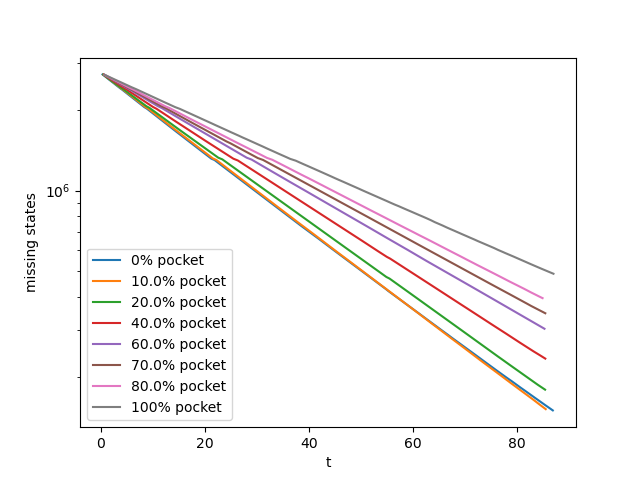

In [52]:
plt.figure()


l = "12"
for f in [0, 0.1, 0.2, 0.4, 0.6, 0.7, 0.8, 1]:
    d1 = np.genfromtxt(f"new-data/worm-timing/{l}_{f}.csv", delimiter=",")
    plt.plot(d1[:, 0], 2758129-d1[:, 2], label=f"{f*100}% pocket")

    d = read_histogram2(f"new-data/worm-timing/{l}_{f}_thist.dat")
    import mhr
    print(f, mhr.autocorr_gw2010(d[None, 20000:100000]) / (d1[-1, 1]/d1[-1, 0]))

    d = read_histogram3(f"new-data/worm-timing/{l}_{f}_topohist.dat")
    print(f, mhr.autocorr_gw2010(d[None, 20000:100000, 0]) / (d1[-1, 1]/d1[-1, 0]))

plt.xlabel("t")
plt.ylabel("missing states")
plt.yscale("log")
plt.legend()

Text(0.5, 1.0, 'around K point r=0.1')

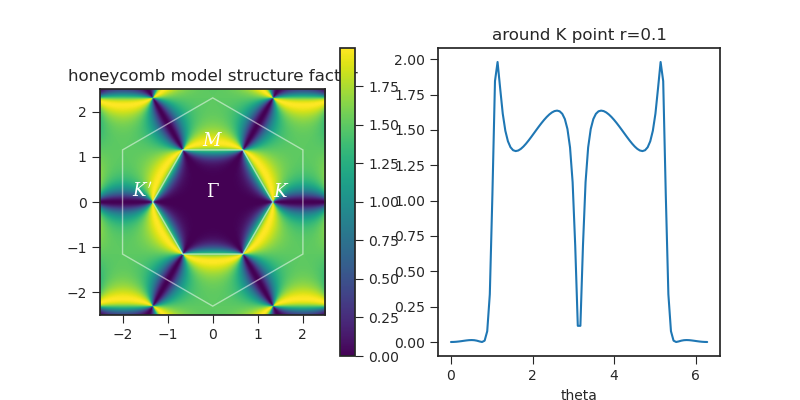

In [161]:
def e(kx, ky, gamma):
    kx = np.pi * kx
    ky = np.pi * ky
    def s(xy):
        return sum(np.exp(1j * (kx * (x + 1/2) + ky * (y + np.sqrt(3)/6))) for x, y in xy)
    def s2(xy):
        return sum(np.exp(1j * (kx * (x + 1) + ky * (y + np.sqrt(3)/3))) for x, y in xy)

    return np.array([[
        s([(0, 0), (-1, 0), (-0.5, -np.sqrt(3)/2)]) + gamma * s([(-0.5, np.sqrt(3)/2), (0.5, -np.sqrt(3)/2), (-1.5, -np.sqrt(3)/2)]),
        s2([(-1.5, -np.sqrt(3)/2), (-1, 0), (-0.5, -np.sqrt(3)/2)]) + gamma * s2([(0, 0), (-2, 0), (-1, -np.sqrt(3))]),
    ]]).T

def s(e):
    m = np.array([[1, 1]]).T
    return m.T @ (np.eye(2) - e @ np.linalg.inv(e.conj().T @ e) @ e.conj().T) @ m

def s2(e):
    return (np.eye(2) - e @ np.linalg.inv(e.conj().T @ e) @ e.conj().T)[0, 1]

fig, ax = plt.subplots(1, 2, figsize=[8, 4])
plot_FT(ax[0], lambda k: s(e(k[0], k[1], 0)), fold=True, proj="abs", res=100)

xs = np.linspace(0, np.pi * 2, 100)
ys = []
for theta in xs:
    ys.append(np.abs(s(e(4/3+np.cos(theta)*0.01, np.sin(theta)*0.01, 1/2+0.01))).squeeze())
ax[0].set_title("honeycomb model structure factor")
ax[1].plot(xs, ys)
ax[1].set_xlabel("theta")
ax[1].set_title("around K point r=0.1")

Text(0.5, 1.0, 'around K point r=0.2')

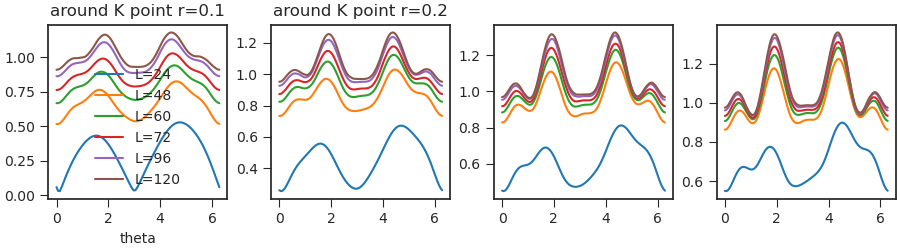

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=[9, 2.5], layout="constrained")
for l in [24, 48, 60, 72, 96, 120]:
    if l <= 96:
        data = read_accumulator(f"new-data/t0j0-ergodic/{l}x{l}_r-0_t0.000000_j0.000_50000000.10_0/tri-tri.dat")[0].reshape((l, l, 2))
    else:
        data = read_accumulator(f"new-data/t0j0-ergodic/{l}x{l}_r-0_t0.000000_j0.000_100000000.10_0/tri-tri.dat")[0].reshape((l, l, 2))
# for l in [48]:
#     data = read_accumulator(f"new-data/pto/0.01/rand/48x48_r-0_t0.020000_j0.010_30000000.15_0/tri-tri.dat")[0].reshape((l, l, 2))

    ft = FT_hex(data)

    xs = np.linspace(0, np.pi * 2, 100)
    ys = [[] for _ in range(4)]
    for theta in xs:
        ys[0].append(np.abs(ft((4/3+np.cos(theta)*0.07, np.sin(theta)*0.07))))
        ys[1].append(np.abs(ft((4/3+np.cos(theta)*0.1, np.sin(theta)*0.1))))
        ys[2].append(np.abs(ft((4/3+np.cos(theta)*0.13, np.sin(theta)*0.13))))
        ys[3].append(np.abs(ft((4/3+np.cos(theta)*0.15, np.sin(theta)*0.15))))
    ax[0].plot(xs, ys[0], label="L="+str(l))
    ax[1].plot(xs, ys[1])
    ax[2].plot(xs, ys[2])
    ax[3].plot(xs, ys[3])

ax[0].legend()
ax[0].set_title("around K point r=0.1")
ax[0].set_xlabel("theta")
ax[1].set_title("around K point r=0.2")

In [1]:
fig, ax = plt.subplots(2, 2, figsize=[7, 6], layout="constrained")
data = autoshape(read_accumulator(f"new-data/t0j0-ergodic/120x120_r-0_t0.000000_j0.000_100000000.10_0/tri-tri.dat")[0])
ft = FT(data)
for r in [0.08, 0.1, 0.15, 0.20]:
    xs = np.linspace(0, np.pi * 2, 100)
    ys, ys2 = [], []
    for theta in xs:
        ys.append(np.abs(ft((4/3+np.cos(theta)*r, np.sin(theta)*r))))
        ys2.append(np.abs(s(e(4/3+np.cos(theta)*r, np.sin(theta)*r, 1/2))).squeeze())
    ax[1,0].plot(xs, ys, label="r="+str(r))
    ax[1,1].plot(xs, ys2, label="r="+str(r))

for i in range(2):
    ax[1,i].set_xlabel("angle")
    ax[1,i].set_ylabel("Correlation")
    ax[1,i].set_title("Circular cuts around K")
ax[1,0].legend()
ax[1,0].set_ylim([0, 2])
ax[1,1].set_ylim([0, 2])

extent = (4/3-0.4, 4/3+0.4, -0.4, 0.4)

plot_FT(ax[0,0], ft, proj="abs", res=75, vmax=2, extent=extent, fold=False)
plot_FT(ax[0,1], lambda k: s(e(k[0], k[1], 0.51)), proj="abs", res=75, vmax=2, extent=extent, fold=False)
ax[0,0].set_title("Trimer MC")
ax[0,1].set_title("Honeycomb spin")

NameError: name 'plt' is not defined

Text(0.5, 1.0, 'gamma=0.55')

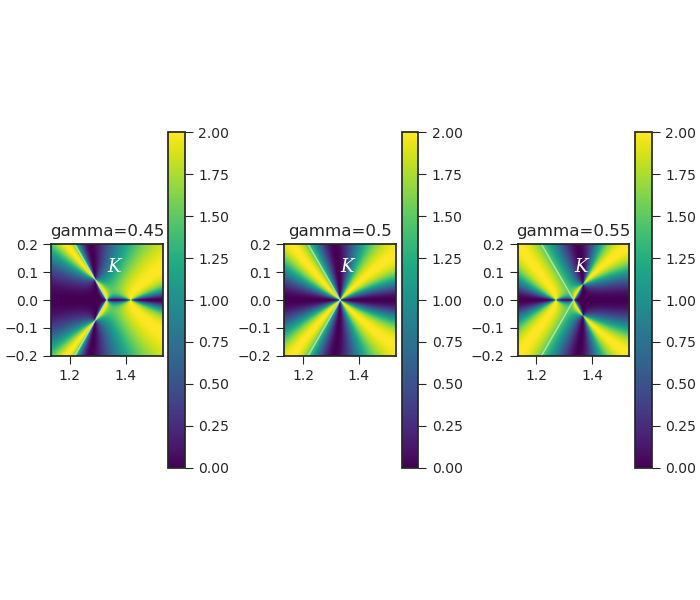

In [10]:
fig, ax = plt.subplots(1, 3, figsize=[7, 6], layout="constrained")
extent = (4/3-0.2, 4/3+0.2, -0.2, 0.2)

plot_FT(ax[0], lambda k: s(e(k[0], k[1], 0.45)), proj="abs", res=75, vmax=2, extent=extent, fold=False)
plot_FT(ax[1], lambda k: s(e(k[0], k[1], 0.50)), proj="abs", res=75, vmax=2, extent=extent, fold=False)
plot_FT(ax[2], lambda k: s(e(k[0], k[1], 0.55)), proj="abs", res=75, vmax=2, extent=extent, fold=False)
ax[0].set_title("gamma=0.45")
ax[1].set_title("gamma=0.5")
ax[2].set_title("gamma=0.55")

# asdf

In [16]:
def snapshot_ft(poss, w, h, ns, coords):
    xss, yss = [], []
    for dx in range(1):
        for dy in range(1):
            xs = np.zeros((w, h, ns))
            ys = np.zeros((w, h, ns))
            for x in range(w):
                for y in range(h):
                    for s in range(ns):
                        xy = coords(x-dx*w, y-dy*h, s)
                        xs[x, y, s] = xy[0]
                        ys[x, y, s] = xy[1]
            xss.append(xs)
            yss.append(ys)

    occs = []
    for pos in poss:
        occ = np.zeros((w, h, ns))
        for x, y, s in pos:
            occ[x, y, s] = 1
        occs.append(occ)

    def corr(k):
        return sum(np.abs(
            sum(np.sum(occ * np.exp(1j * np.pi * (xs * k[0] + ys * k[1])), axis=None) for xs, ys in zip(xss, yss))
        )**2/len(poss[0]) for occ in occs) / len(occs)
    return corr

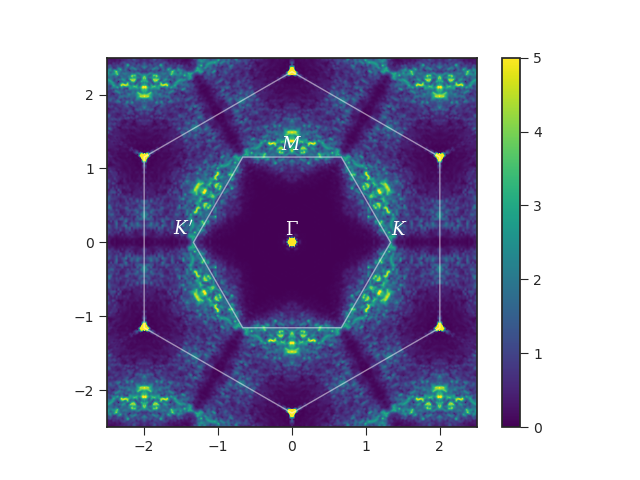

In [11]:
pos0 = read_positions("new-data/t0j0-ergodic/48x48_r-0_t0.000000_j0.000_50000000.10_0/positions.dat")
plt.figure()
plot_FT(plt.gca(), snapshot_ft(pos0[:5], 48, 48, 2, trimer_coords), fold=True, proj="abs", vmax=5, res=50)

In [96]:
def corr_ft(data, w, h, ns, coords):
    xs = np.zeros((w*2, h*2, ns*ns))
    ys = np.zeros((w*2, h*2, ns*ns))
    window = np.zeros((w*2, h*2, ns*ns))
    window[:, :, :] = 1
    for x in range(w*2):
        for y in range(h*2):
            for s in range(ns*ns):
                xy = coords(x-w, y-h, s%ns)
                xy0 = coords(0, 0, s//ns)
                xs[x, y, s] = xy[0]-xy0[0]
                ys[x, y, s] = xy[1]-xy0[1]
                window[x, y, s] = np.exp(-((xy[0]-xy0[0])**2+(xy[1]-xy0[1])**2)/2/(w/2)**2)

    def corr(k):
        return np.sum(window * data * np.exp(1j * np.pi * (xs * k[0] + ys * k[1])), axis=None)
    return corr

def corr_ft2(data, w, h, ns, coords):
    xs = np.zeros((w, h, ns*ns))
    ys = np.zeros((w, h, ns*ns))
    window = np.zeros((w, h, ns*ns))
    window[:, :, :] = 1
    for x in range(w):
        for y in range(h):
            for s in range(ns*ns):
                xy = coords(x, y, s%ns)
                xy0 = coords(0, 0, s//ns)
                xs[x, y, s] = xy[0]-xy0[0]
                ys[x, y, s] = xy[1]-xy0[1]
                window[x, y, s] = np.exp(-((xy[0]-xy0[0])**2+(xy[1]-xy0[1])**2)/2/(w/2)**2)

    def corr(k):
        return np.sum(window * data * np.exp(1j * np.pi * (xs * k[0] + ys * k[1])), axis=None)
    return corr

def ft2(k):
    total = 0

    # N = matplotlib.colors.Normalize(vmin=np.min(data), vmax=np.max(data))

    # patches = []
    # colors = []

    for s in range(data.shape[2]):
        xy0 = trimer_coords(0, 0, s%2)
        for x in range(data.shape[0]):
            for y in range(data.shape[1]):
                xy = trimer_coords(x, y, s//2)
                xy = xy[0]-xy0[0], xy[1]-xy0[1]

                total += data[x, y, s] * np.exp(1j * np.pi * (xy[0] * k[0] + xy[1] * k[1]))
                # patches.append(matplotlib.patches.Circle(xy, radius=0.2))
                # colors.append(matplotlib.colormaps["viridis"](N(data[x, y, s])))

    # plt.figure()
    # plt.gca().add_collection(matplotlib.collections.PatchCollection(patches, facecolors=colors, alpha=0.9))
    return total

In [10]:
# data4 = read_accumulator("new-data/t0j0-ergodic/48x48_r-0_t0.000000_j0.000_50000000.10_0/tri-tri.dat")[0].reshape((48, 48, 2))
# data3 = autoshape(read_accumulator("new-data/temp/48x48_r-3_t0.000000_j0.000_10000000.10_0/tri-tri.dat")[0], 4)
data5 = autoshape(read_accumulator("new-data/temp/48x48_r-6_t0.000000_j0.000_50000000.10_2/tri-tri.dat")[0], 4)
data6 = autoshape(read_accumulator("new-data/temp/48x48_r-6_t0.000000_j0.000_50000000.10_3/tri-tri.dat")[0], 4)

In [47]:
# data = np.zeros((96, 96, 4))
data = np.zeros((48, 48, 4))
for pos in pos0[:10]:
    for p in pos:
        for p2 in pos:
            # data[(p2[0]-p[0])+48, (p2[1]-p[1])+48, p2[2]*2+p[2]] += 1
            if p[2] == 0:
                data[(p2[0]-p[0])%48, (p2[1]-p[1])%48, p2[2]] += 1
            else:
                data[(p[0]-p2[0])%48, (p[1]-p2[1])%48, 1-p2[2]] += 1
data /= 48*48//3 * 10

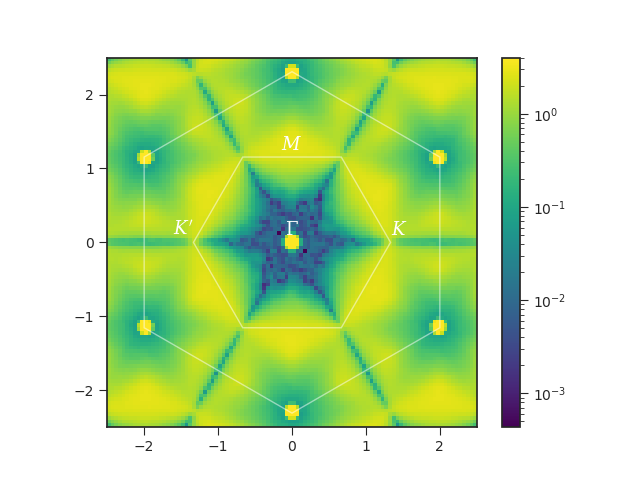

In [14]:
plt.figure()
plot_FT(plt.gca(), FT(data5[:, :, :2]), fold=False, proj="logabs", res=50, vmax=4)
# plot_FT(plt.gca(), FT(data4[:, :]), fold=False, proj="logabs", res=50, vmax=4)
# plot_FT(plt.gca(), FT(data3[:, :, ::2]), fold=True, proj="logabs", res=50, vmax=4)
# plot_FT(plt.gca(), FT(data[:, :]), fold=False, proj="abs", res=50, vmax=4)
# plot_FT(plt.gca(), FT(data[:, :, ::2]), fold=False, proj="logabs", res=50, vmax=4)
# plot_FT(plt.gca(), corr_ft(data, 48, 48, 2, trimer_coords), fold=True, proj="absre", res=50, vmax=5)

In [ ]:
plot_FT(plt.gca(), FT(data6[:, :, :2]), fold=False, proj="logabs", res=50, vmax=4)


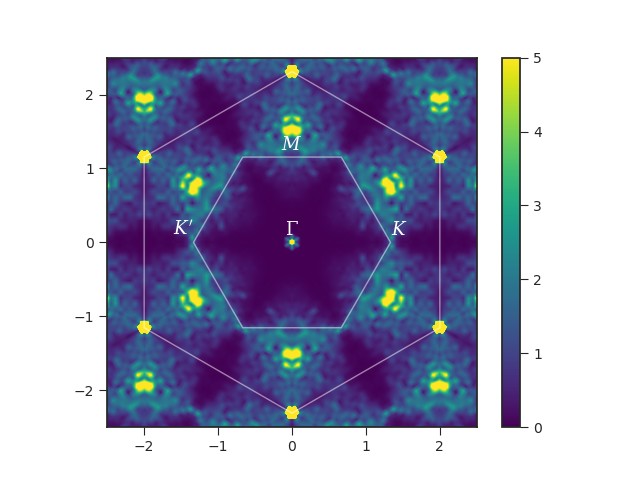

In [90]:
pos0 = read_positions("new-data/dimers-hex/48x48/positions.dat")
plt.figure()
plot_FT(plt.gca(), snapshot_ft(pos0[:5], 48, 48, 3, dimer_hex_coords), fold=True, proj="abs", res=20, vmax=5)

In [91]:
data = np.zeros((96, 96, 9))
# data = np.zeros((48, 48, 9))
for pos in pos0[:5]:
    for p in pos:
        for p2 in pos:
            data[(p2[0]-p[0])+48, (p2[1]-p[1])+48, p[2]*3+p2[2]] += 1
data /= 48*48 * 5

In [92]:
data2 = np.zeros((48, 48, 9))
for pos in pos0[:5]:
    for p in pos:
        for p2 in pos:
            data2[(p2[0]-p[0])%48, (p2[1]-p[1])%48, p[2]*3+p2[2]] += 1
data2 /= 48*48 * 5

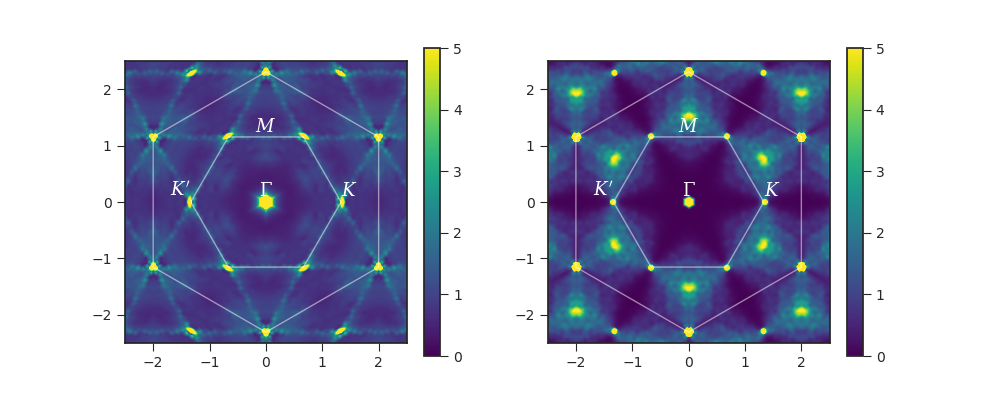

In [93]:
fig, ax = plt.subplots(1, 2, figsize=[10, 4])
plot_FT(ax[0], corr_ft2(data2, 48, 48, 3, dimer_hex_coords), fold=True, proj="abs", res=20, vmax=5)
plot_FT(ax[1], corr_ft(data, 48, 48, 3, dimer_hex_coords), fold=True, proj="abs", res=20, vmax=5)

In [97]:
data5 = autoshape(read_accumulator("new-data/dimers-hex/48x48/dimer-dimer.dat")[0], 9)

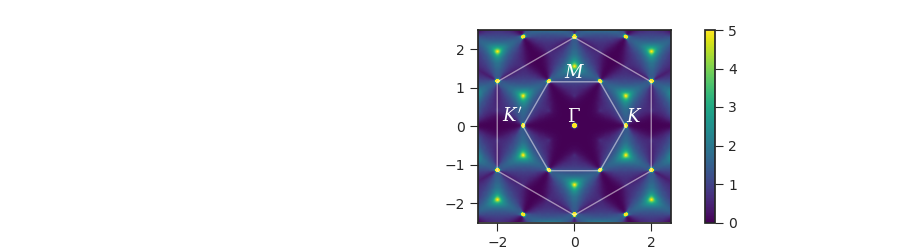

In [99]:
fig, ax = plt.subplots(1, 1, figsize=[9, 2.5])
plot_FT(plt.gca(), corr_ft(data5, 48, 48, 3, dimer_hex_coords), fold=True, proj="abs", res=50, vmax=5)